# CenterResnet Starter


I am very new to these concepts so I am trying out by changing this amazing and probably only 3D model related awesome public kernel by Ruslan
https://www.kaggle.com/hocop1/centernet-baseline

Most of the codes are loaned from there . There are other codes that I took from OFT implementation github . But I dont know what is OFT , so I have not yet implemented it . 

My current score is not from this kernel( as there are some errors in this kernel) , but from some simple architecture modification of the original public kernel. 


In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from functools import reduce
import os
from sklearn.model_selection import train_test_split
from scipy.optimize import minimize
from tqdm.auto import tqdm as tq
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torchvision import transforms, utils

PATH = '../input/pku-autonomous-driving/'
os.listdir(PATH)

['car_models_json',
 'test_masks.zip',
 'test_images',
 'test_images.zip',
 'sample_submission.csv',
 'car_models',
 'train.csv',
 'camera.zip',
 'test_masks',
 'train_masks',
 'car_models_json.zip',
 'train_masks.zip',
 'train_images',
 'camera',
 'train_images.zip',
 'car_models.zip']

In [2]:
## Constants
SWITCH_LOSS_EPOCH = 5

# Load data

In [114]:
train = pd.read_csv(PATH + 'train.csv')
test = pd.read_csv(PATH + 'sample_submission.csv')

# From camera.zip
camera_matrix = np.array([[2304.5479, 0,  1686.2379],
                          [0, 2305.8757, 1354.9849],
                          [0, 0, 1]], dtype=np.float32)
camera_matrix_inv = np.linalg.inv(camera_matrix)

train.head()

,ImageId,PredictionString
0,ID_8a6e65317,16 0.254839 -2.57534 -3.10256 7.96539 3.20066 ...
1,ID_337ddc495,66 0.163988 0.192169 -3.12112 -3.17424 6.55331...
2,ID_a381bf4d0,43 0.162877 0.00519276 -3.02676 2.1876 3.53427...
3,ID_7c4a3e0aa,43 0.126957 -3.04442 -3.10883 -14.738 24.6389 ...
4,ID_8b510fad6,37 0.16017 0.00862796 -3.0887 -3.04548 3.4977 ...


**ImageId** column contains names of images:

In [115]:
def imread(path, fast_mode=False):
    img = cv2.imread(path)
    if not fast_mode and img is not None and len(img.shape) == 3:
        img = np.array(img[:, :, ::-1])
    return img

img = imread(PATH + 'train_images/ID_8a6e65317' + '.jpg')
IMG_SHAPE = img.shape

#plt.figure(figsize=(15,8))
#plt.imshow(img);

In [116]:
def str2coords(s, names=['id', 'yaw', 'pitch', 'roll', 'x', 'y', 'z']):
    '''
    Input:
        s: PredictionString (e.g. from train dataframe)
        names: array of what to extract from the string
    Output:
        list of dicts with keys from `names`
    '''
    coords = []
    for l in np.array(s.split()).reshape([-1, 7]):
        coords.append(dict(zip(names, l.astype('float'))))
        if 'id' in coords[-1]:
            coords[-1]['id'] = int(coords[-1]['id'])
    return coords

In [117]:
inp = train['PredictionString'][0]
print('Example input:\n', inp)
print()
print('Output:\n', str2coords(inp))

Example input:
 16 0.254839 -2.57534 -3.10256 7.96539 3.20066 11.0225 56 0.181647 -1.46947 -3.12159 9.60332 4.66632 19.339 70 0.163072 -1.56865 -3.11754 10.39 11.2219 59.7825 70 0.141942 -3.1395 3.11969 -9.59236 5.13662 24.7337 46 0.163068 -2.08578 -3.11754 9.83335 13.2689 72.9323

Output:
 [{'id': 16, 'yaw': 0.254839, 'pitch': -2.57534, 'roll': -3.10256, 'x': 7.96539, 'y': 3.20066, 'z': 11.0225}, {'id': 56, 'yaw': 0.181647, 'pitch': -1.46947, 'roll': -3.12159, 'x': 9.60332, 'y': 4.66632, 'z': 19.339}, {'id': 70, 'yaw': 0.163072, 'pitch': -1.56865, 'roll': -3.11754, 'x': 10.39, 'y': 11.2219, 'z': 59.7825}, {'id': 70, 'yaw': 0.141942, 'pitch': -3.1395, 'roll': 3.11969, 'x': -9.59236, 'y': 5.13662, 'z': 24.7337}, {'id': 46, 'yaw': 0.163068, 'pitch': -2.08578, 'roll': -3.11754, 'x': 9.83335, 'y': 13.2689, 'z': 72.9323}]


# Data distributions

In [118]:
lens = [len(str2coords(s)) for s in train['PredictionString']]

#plt.figure(figsize=(15,6))
#sns.countplot(lens);
#plt.xlabel('Number of cars in image');

In [8]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['x'] for c in str2coords(s)] for s in train['PredictionString']]), bins=500);
# # sns.distplot([str2coords(s)[0]['x'] for s in train['PredictionString']]);
# plt.xlabel('x')
# plt.show()

In [9]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['y'] for c in str2coords(s)] for s in train['PredictionString']]), bins=500);
# plt.xlabel('y')
# plt.show()

In [10]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['z'] for c in str2coords(s)] for s in train['PredictionString']]), bins=500);
# plt.xlabel('z')
# plt.show()

In [11]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['yaw'] for c in str2coords(s)] for s in train['PredictionString']]));
# plt.xlabel('yaw')
# plt.show()

In [12]:
# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[c['pitch'] for c in str2coords(s)] for s in train['PredictionString']]));
# plt.xlabel('pitch')
# plt.show()

I guess, pitch and yaw are mixed up in this dataset. Pitch cannot be that big. That would mean that cars are upside down.

In [13]:
def rotate(x, angle):
    x = x + angle
    x = x - (x + np.pi) // (2 * np.pi) * 2 * np.pi
    return x

# plt.figure(figsize=(15,6))
# sns.distplot(reduce(lambda a, b: a + b, [[rotate(c['roll'], np.pi) for c in str2coords(s)] for s in train['PredictionString']]));
# plt.xlabel('roll rotated by pi')
# plt.show()

# 2D Visualization

In [14]:
def get_img_coords(s):
    '''
    Input is a PredictionString (e.g. from train dataframe)
    Output is two arrays:
        xs: x coordinates in the image
        ys: y coordinates in the image
    '''
    coords = str2coords(s)
    xs = [c['x'] for c in coords]
    ys = [c['y'] for c in coords]
    zs = [c['z'] for c in coords]
    P = np.array(list(zip(xs, ys, zs))).T
    img_p = np.dot(camera_matrix, P).T
    img_p[:, 0] /= img_p[:, 2]
    img_p[:, 1] /= img_p[:, 2]
    img_xs = img_p[:, 0]
    img_ys = img_p[:, 1]
    img_zs = img_p[:, 2] # z = Distance from the camera
    return img_xs, img_ys

#plt.figure(figsize=(14,14))
#plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][2217] + '.jpg'))
#plt.scatter(*get_img_coords(train['PredictionString'][2217]), color='red', s=100);

One point is out of image!

Let's look at the distribution of all points. Image is here just for reference.

In [15]:
# xs, ys = [], []

# for ps in train['PredictionString']:
#     x, y = get_img_coords(ps)
#     xs += list(x)
#     ys += list(y)

# plt.figure(figsize=(18,18))
# plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][2217] + '.jpg'), alpha=0.3)
# plt.scatter(xs, ys, color='red', s=10, alpha=0.2);

Many points are outside!

Let's look at this distribution "from the sky"

In [16]:
# # Cars points
# xs, ys = [], []
# for ps in train['PredictionString']:
#     coords = str2coords(ps)
#     xs += [c['x'] for c in coords]
#     ys += [c['y'] for c in coords]

# # Road points
# road_width = 6
# road_xs = [-road_width, road_width, road_width, -road_width, -road_width]
# road_ys = [0, 0, 500, 500, 0]

# plt.figure(figsize=(16,16))
# plt.axes().set_aspect(1)
# # View road
# plt.fill(road_xs, road_ys, alpha=0.2, color='gray')
# plt.plot([road_width/2,road_width/2], [0,500], alpha=0.4, linewidth=4, color='white', ls='--')
# plt.plot([-road_width/2,-road_width/2], [0,500], alpha=0.4, linewidth=4, color='white', ls='--')
# # View cars
# plt.scatter(xs, ys, color='red', s=20, alpha=0.2);

Some points are very far away

Scale up

In [17]:
# plt.figure(figsize=(16,16))
# plt.axes().set_aspect(1)
# plt.xlim(-50,50)
# plt.ylim(0,50)

# # View road
# plt.fill(road_xs, road_ys, alpha=0.2, color='gray')
# plt.plot([road_width/2,road_width/2], [0,100], alpha=0.4, linewidth=4, color='white', ls='--')
# plt.plot([-road_width/2,-road_width/2], [0,100], alpha=0.4, linewidth=4, color='white', ls='--')
# # View cars
# plt.scatter(xs, ys, color='red', s=10, alpha=0.1);

# 3D Visualization
Used code from https://www.kaggle.com/zstusnoopy/visualize-the-location-and-3d-bounding-box-of-car, but made it one function

In [18]:
from math import sin, cos

# convert euler angle to rotation matrix
def euler_to_Rot(yaw, pitch, roll):
    Y = np.array([[cos(yaw), 0, sin(yaw)],
                  [0, 1, 0],
                  [-sin(yaw), 0, cos(yaw)]])
    P = np.array([[1, 0, 0],
                  [0, cos(pitch), -sin(pitch)],
                  [0, sin(pitch), cos(pitch)]])
    R = np.array([[cos(roll), -sin(roll), 0],
                  [sin(roll), cos(roll), 0],
                  [0, 0, 1]])
    return np.dot(Y, np.dot(P, R))

In [19]:
def draw_line(image, points):
    color = (255, 0, 0)
    cv2.line(image, tuple(points[0][:2]), tuple(points[3][:2]), color, 16)
    cv2.line(image, tuple(points[0][:2]), tuple(points[1][:2]), color, 16)
    cv2.line(image, tuple(points[1][:2]), tuple(points[2][:2]), color, 16)
    cv2.line(image, tuple(points[2][:2]), tuple(points[3][:2]), color, 16)
    return image


def draw_points(image, points):
    for (p_x, p_y, p_z) in points:
        cv2.circle(image, (p_x, p_y), int(1000 / p_z), (0, 255, 0), -1)
#         if p_x > image.shape[1] or p_y > image.shape[0]:
#             print('Point', p_x, p_y, 'is out of image with shape', image.shape)
    return image

In [20]:
def visualize(img, coords):
    # You will also need functions from the previous cells
    x_l = 1.02
    y_l = 0.80
    z_l = 2.31
    
    img = img.copy()
    for point in coords:
        # Get values
        x, y, z = point['x'], point['y'], point['z']
        yaw, pitch, roll = -point['pitch'], -point['yaw'], -point['roll']
        # Math
        Rt = np.eye(4)
        t = np.array([x, y, z])
        Rt[:3, 3] = t
        Rt[:3, :3] = euler_to_Rot(yaw, pitch, roll).T
        Rt = Rt[:3, :]
        P = np.array([[x_l, -y_l, -z_l, 1],
                      [x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, -z_l, 1],
                      [0, 0, 0, 1]]).T
        img_cor_points = np.dot(camera_matrix, np.dot(Rt, P))
        img_cor_points = img_cor_points.T
        img_cor_points[:, 0] /= img_cor_points[:, 2]
        img_cor_points[:, 1] /= img_cor_points[:, 2]
        img_cor_points = img_cor_points.astype(int)
        # Drawing
        img = draw_line(img, img_cor_points)
        img = draw_points(img, img_cor_points[-1:])
    
    return img

In [21]:
# n_rows = 6

# for idx in range(n_rows):
#     fig, axes = plt.subplots(1, 2, figsize=(20,20))
#     img = imread(PATH + 'train_images/' + train['ImageId'].iloc[idx] + '.jpg')
#     axes[0].imshow(img)
#     img_vis = visualize(img, str2coords(train['PredictionString'].iloc[idx]))
#     axes[1].imshow(img_vis)
#     plt.show()

# Image preprocessing

In [22]:
IMG_WIDTH = 2048
IMG_HEIGHT = IMG_WIDTH // 4
MODEL_SCALE = 8

def _regr_preprocess(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] / 100
    regr_dict['roll'] = rotate(regr_dict['roll'], np.pi)
    regr_dict['pitch_sin'] = sin(regr_dict['pitch'])
    regr_dict['pitch_cos'] = cos(regr_dict['pitch'])
    regr_dict.pop('pitch')
    regr_dict.pop('id')
    return regr_dict

def _regr_back(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] * 100
    regr_dict['roll'] = rotate(regr_dict['roll'], -np.pi)
    
    pitch_sin = regr_dict['pitch_sin'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    pitch_cos = regr_dict['pitch_cos'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    regr_dict['pitch'] = np.arccos(pitch_cos) * np.sign(pitch_sin)
    return regr_dict

def preprocess_image(img):
    img = img[img.shape[0] //2 :]
    bg = np.ones_like(img) * img.mean(1, keepdims=True).astype(img.dtype)
    bg = bg[:, :img.shape[1] // 4]
    img = np.concatenate([bg, img, bg], 1)
    img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    return (img / 255).astype('float32')

def get_mask_and_regr(img, labels):
    mask = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE], dtype='float32')
    regr_names = ['x', 'y', 'z', 'yaw', 'pitch', 'roll']
    regr = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE, 7], dtype='float32')
    coords = str2coords(labels)
    xs, ys = get_img_coords(labels)
    for x, y, regr_dict in zip(xs, ys, coords):
        x, y = y, x
        x = (x - img.shape[0] // 2) * IMG_HEIGHT / (img.shape[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + img.shape[1] // 4) * IMG_WIDTH / (img.shape[1] * 1.5) / MODEL_SCALE
        y = np.round(y).astype('int')
        if x >= 0 and x < IMG_HEIGHT // MODEL_SCALE and y >= 0 and y < IMG_WIDTH // MODEL_SCALE:
            mask[x, y] = 1
            regr_dict = _regr_preprocess(regr_dict)
            regr[x, y] = [regr_dict[n] for n in sorted(regr_dict)]
    return mask, regr

In [23]:
# img0 = imread(PATH + 'train_images/' + train['ImageId'][0] + '.jpg')
# img = preprocess_image(img0)

# mask, regr = get_mask_and_regr(img0, train['PredictionString'][0])

# print('img.shape', img.shape, 'std:', np.std(img))
# print('mask.shape', mask.shape, 'std:', np.std(mask))
# print('regr.shape', regr.shape, 'std:', np.std(regr))

# plt.figure(figsize=(16,16))
# plt.title('Processed image')
# plt.imshow(img)
# plt.show()

# plt.figure(figsize=(16,16))
# plt.title('Detection Mask')
# plt.imshow(mask)
# plt.show()
# plt.figure(figsize=(16,16))
# plt.title('Yaw values')
# plt.imshow(regr[:,:,-2])
# plt.show()

# PyTorch Dataset

In [119]:
class CarDataset(Dataset):
    """Car dataset."""

    def __init__(self, dataframe, root_dir, training=True, transform=None):
        self.df = dataframe
        self.root_dir = root_dir
        self.transform = transform
        self.training = training

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        # Get image name
        idx, labels = self.df.values[idx]
        img_name = self.root_dir.format(idx)
        
        # Read image
        img0 = imread(img_name, True)
        img = preprocess_image(img0)
        img = np.rollaxis(img, 2, 0)
        
        # Get mask and regression maps
        if self.training:
            mask, regr = get_mask_and_regr(img0, labels)
            regr = np.rollaxis(regr, 2, 0)
        else:
            mask, regr = 0, 0
        
        return [img, mask, regr]
    
train_images_dir = PATH + 'train_images/{}.jpg'
test_images_dir = PATH + 'test_images/{}.jpg'

df_train, df_dev = train_test_split(train, test_size=0.01, random_state=42)
df_test = test

# Create dataset objects
train_dataset = CarDataset(df_train, train_images_dir)
dev_dataset = CarDataset(df_dev, train_images_dir)
test_dataset = CarDataset(df_test, test_images_dir)

In [120]:
BATCH_SIZE = 8

# Create data generators - they will produce batches
train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
dev_loader = DataLoader(dataset=dev_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)
test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=4)

In [26]:
class double_conv(nn.Module):
    '''(conv => BN => ReLU) * 2'''
    def __init__(self, in_ch, out_ch):
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()

        #  would be a nice idea if the upsampling could be learned too,
        #  but my machine do not have enough memory to handle all those weights
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch//2, in_ch//2, 2, stride=2)

        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2=None):
        x1 = self.up(x1)
        
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, (diffX // 2, diffX - diffX//2,
                        diffY // 2, diffY - diffY//2))
        
        # for padding issues, see 
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        
        if x2 is not None:
            x = torch.cat([x2, x1], dim=1)
        else:
            x = x1
        x = self.conv(x)
        return x

def get_mesh(batch_size, shape_x, shape_y):
    mg_x, mg_y = np.meshgrid(np.linspace(0, 1, shape_y), np.linspace(0, 1, shape_x))
    mg_x = np.tile(mg_x[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mg_y = np.tile(mg_y[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mesh = torch.cat([torch.tensor(mg_x).to(device), torch.tensor(mg_y).to(device)], 1)
    return mesh

import torch.nn as nn
import torch.nn.functional as F
import torch.utils.model_zoo as model_zoo


model_urls = {
    'resnet18': 'https://download.pytorch.org/models/resnet18-5c106cde.pth',
    'resnet34': 'https://download.pytorch.org/models/resnet34-333f7ec4.pth',
    'resnet50': 'https://download.pytorch.org/models/resnet50-19c8e357.pth',
    'resnet101': 'https://download.pytorch.org/models/resnet101-5d3b4d8f.pth',
    'resnet152': 'https://download.pytorch.org/models/resnet152-b121ed2d.pth',
}


def conv3x3(in_planes, out_planes, stride=1):
    """3x3 convolution with padding"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=3, stride=stride,
                     padding=1, bias=False)


def conv1x1(in_planes, out_planes, stride=1):
    """1x1 convolution"""
    return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


class BasicBlock(nn.Module):
    expansion = 1

    def __init__(self, inplanes, planes, stride=1):
        super(BasicBlock, self).__init__()

        self.conv1 = conv3x3(inplanes, planes, stride)
        self.bn1 = nn.GroupNorm(16, planes)

        self.conv2 = conv3x3(planes, planes)
        self.bn2 = nn.GroupNorm(16, planes)

        if stride != 1 or inplanes != planes:
            self.downsample = nn.Sequential(
                conv1x1(inplanes, planes, stride), nn.GroupNorm(16, planes))
        else:
            self.downsample = None


    def forward(self, x):
        identity = x

        out = F.relu(self.bn1(self.conv1(x)), inplace=True)
        out = self.bn2(self.conv2(out))

        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = F.relu(out, inplace=True)

        return out


class Bottleneck(nn.Module):
    expansion = 4

    def __init__(self, inplanes, planes, stride=1):
        super(Bottleneck, self).__init__()
        self.conv1 = conv1x1(inplanes, planes)
        self.bn1 = nn.GroupNorm(16, planes)
        self.conv2 = conv3x3(planes, planes, stride)
        self.bn2 = nn.GroupNorm(16, planes)
        self.conv3 = conv1x1(planes, planes * self.expansion)
        self.bn3 = nn.GroupNorm(16, planes * self.expansion)

        if stride != 1 or inplanes != planes * self.expansion:
            self.downsample = nn.Sequential(
                conv1x1(inplanes, planes * self.expansion, stride), 
                nn.GroupNorm(16, planes * self.expansion))
        else:
            self.downsample = None

    def forward(self, x):
        identity = x

        out = F.relu(self.bn1(self.conv1(x)), inplace=True)
        out = F.relu(self.bn2(self.conv2(out)), inplace=True)
        out = self.bn3(self.conv3(out))
 
        if self.downsample is not None:
            identity = self.downsample(x)

        out += identity
        out = F.relu(out)

        return out


class ResNetFeatures(nn.Module):

    def __init__(self, block, layers, num_classes=1000, zero_init_residual=False):
        super(ResNetFeatures, self).__init__()
        self.inplanes = 64
        self.conv1 = nn.Conv2d(3, 64, kernel_size=7, stride=2, padding=3,
                               bias=False)
        self.bn1 = nn.GroupNorm(16, 64)

        self.layer1 = self._make_layer(block, 64, layers[0])
        self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
        self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
        self.layer4 = self._make_layer(block, 512, layers[3], stride=2)


        for m in self.modules():
            if isinstance(m, nn.Conv2d):
                nn.init.kaiming_normal_(m.weight, mode='fan_out', nonlinearity='relu')
            elif isinstance(m, nn.BatchNorm2d):
                nn.init.constant_(m.weight, 1)
                nn.init.constant_(m.bias, 0)

        # Zero-initialize the last BN in each residual branch,
        # so that the residual branch starts with zeros, and each residual block behaves like an identity.
        # This improves the model by 0.2~0.3% according to https://arxiv.org/abs/1706.02677
        if zero_init_residual:
            for m in self.modules():
                if isinstance(m, Bottleneck):
                    nn.init.constant_(m.bn3.weight, 0)
                elif isinstance(m, BasicBlock):
                    nn.init.constant_(m.bn2.weight, 0)

    def _make_layer(self, block, planes, blocks, stride=1):

        layers = []
        layers.append(block(self.inplanes, planes, stride))
        self.inplanes = planes * block.expansion
        for _ in range(1, blocks):
            layers.append(block(self.inplanes, planes))

        return nn.Sequential(*layers)


    def forward(self, x):
        conv1 = F.relu(self.bn1(self.conv1(x)), inplace=True)
        conv1 = F.max_pool2d(conv1, 3, stride=2, padding=1)

        feats4 = self.layer1(conv1)
        feats8 = self.layer2(feats4)
        feats16 = self.layer3(feats8)
        feats32 = self.layer4(feats16)

        return feats8, feats16, feats32


def resnet18(pretrained=False, **kwargs):
    """Constructs a ResNet-18 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [2, 2, 2, 2], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet18']))
    return model



def resnet34(pretrained=False, **kwargs):
    """Constructs a ResNet-34 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [3, 4, 6, 3], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet34']))
    return model


def resnet50(pretrained=False, **kwargs):
    """Constructs a ResNet-34 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [3, 4, 6, 3], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet34']))
    return model


def resnet101(pretrained=False, **kwargs):
    """Constructs a ResNet-34 model.
    Args:
        pretrained (bool): If True, returns a model pre-trained on ImageNet
    """
    model = ResNetFeatures(BasicBlock, [3, 4, 23, 3], **kwargs)
    if pretrained:
        _load_pretrained(model, model_zoo.load_url(model_urls['resnet34']))
    return model

def _load_pretrained(model, pretrained):
    model_dict = model.state_dict()
    pretrained = {k : v for k, v in pretrained.items() if k in model_dict}
    model_dict.update(pretrained)
    model.load_state_dict(model_dict)

In [27]:
class CentResnet(nn.Module):
    '''Mixture of previous classes'''
    def __init__(self, n_classes):
        super(CentResnet, self).__init__()
        self.base_model = resnet18(pretrained=False)
        
        # Lateral layers convert resnet outputs to a common feature size
        self.lat8 = nn.Conv2d(128, 256, 1)
        self.lat16 = nn.Conv2d(256, 256, 1)
        self.lat32 = nn.Conv2d(512, 256, 1)
        self.bn8 = nn.GroupNorm(16, 256)
        self.bn16 = nn.GroupNorm(16, 256)
        self.bn32 = nn.GroupNorm(16, 256)

       
        self.conv0 = double_conv(5, 64)
        self.conv1 = double_conv(64, 128)
        self.conv2 = double_conv(128, 512)
        self.conv3 = double_conv(512, 1024)
        
        self.mp = nn.MaxPool2d(2)
        
        self.up1 = up(1282 , 512) #+ 1024
        self.up2 = up(512 + 512, 256)
        self.outc = nn.Conv2d(256, n_classes, 1)
        
    
    def forward(self, x):
        batch_size = x.shape[0]
        mesh1 = get_mesh(batch_size, x.shape[2], x.shape[3])
        x0 = torch.cat([x, mesh1], 1)
        x1 = self.mp(self.conv0(x0))
        x2 = self.mp(self.conv1(x1))
        x3 = self.mp(self.conv2(x2))
        x4 = self.mp(self.conv3(x3))
        
        #feats = self.base_model.extract_features(x)
                # Run frontend network
        feats8, feats16, feats32 = self.base_model(x)
        lat8 = F.relu(self.bn8(self.lat8(feats8)))
        lat16 = F.relu(self.bn16(self.lat16(feats16)))
        lat32 = F.relu(self.bn32(self.lat32(feats32)))
        
        # Add positional info
        mesh2 = get_mesh(batch_size, lat32.shape[2], lat32.shape[3])
        feats = torch.cat([lat32, mesh2], 1)
        #print(feats.shape)
        #print (x4.shape)
        x = self.up1(feats, x4)
        x = self.up2(x, x3)
        x = self.outc(x)
        return x

In [28]:
from dlav0 import get_pose_net as get_dlav0

In [29]:
_model_factory = {
  #'res': get_pose_net, # default Resnet with deconv
  'dlav0': get_dlav0, # default DLAup
  #'dla': get_dla_dcn,
  #'resdcn': get_pose_net_dcn,
  #'hourglass': get_large_hourglass_net,
}

In [30]:
def create_model(arch, heads, head_conv):
    num_layers = int(arch[arch.find('_') + 1:]) if '_' in arch else 0
    arch = arch[:arch.find('_')] if '_' in arch else arch
    arch = 'dlav0'
    get_model = _model_factory[arch]
    model = get_model(num_layers=num_layers, heads=heads, head_conv=head_conv)
    return model

In [31]:
model = create_model('dla_34', {'hm': 1, 'reg' : 7} , 256)#{'hm': 3, 'dep': 1, 'rot': 8, 'dim': 3, 'wh': 2, 'reg': 2},256)

In [32]:
# Gets the GPU if there is one, otherwise the cpu
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

n_epochs = 12 #6

#model = CentResnet(8).to(device)
model.cuda()
optimizer = optim.AdamW(model.parameters(), lr=0.001)
#optimizer =  RAdam(model.parameters(), lr = 0.001)
#optimizer =  optim.Adam(model.parameters(), lr = 0.001)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=max(n_epochs, 10) * len(train_loader) // 3, gamma=0.1)

cuda


In [33]:
# model.load_state_dict(torch.load('./modelGaussian.pth'))
# model.eval();

In [34]:
def gaussian_radius(det_size, min_overlap=0.7):
    height, width = det_size

    a1  = 1
    b1  = (height + width)
    c1  = width * height * (1 - min_overlap) / (1 + min_overlap)
    sq1 = np.sqrt(b1 ** 2 - 4 * a1 * c1)
    r1  = (b1 + sq1) / 2

    a2  = 4
    b2  = 2 * (height + width)
    c2  = (1 - min_overlap) * width * height
    sq2 = np.sqrt(b2 ** 2 - 4 * a2 * c2)
    r2  = (b2 + sq2) / 2

    a3  = 4 * min_overlap
    b3  = -2 * min_overlap * (height + width)
    c3  = (min_overlap - 1) * width * height
    sq3 = np.sqrt(b3 ** 2 - 4 * a3 * c3)
    r3  = (b3 + sq3) / 2
    return min(r1, r2, r3)
def gaussian2D(shape, sigma=1):
    m, n = [(ss - 1.) / 2. for ss in shape]
    y, x = np.ogrid[-m:m+1,-n:n+1]

    h = np.exp(-(x * x + y * y) / (2 * sigma * sigma))
    h[h < np.finfo(h.dtype).eps * h.max()] = 0
    return h
def draw_msra_gaussian(heatmap, center, sigma):
    tmp_size = sigma * 3
    mu_x = int(center[0] + 0.5)
    mu_y = int(center[1] + 0.5)
    w, h = heatmap.shape[0], heatmap.shape[1]
    ul = [int(mu_x - tmp_size), int(mu_y - tmp_size)]
    br = [int(mu_x + tmp_size + 1), int(mu_y + tmp_size + 1)]
    if ul[0] >= h or ul[1] >= w or br[0] < 0 or br[1] < 0:
        return heatmap
    size = 2 * tmp_size + 1
    x = np.arange(0, size, 1, np.float32)
    y = x[:, np.newaxis]
    
    x0 = y0 = size // 2
    g = np.exp(- ((x - x0) ** 2 + (y - y0) ** 2) / (2 * sigma ** 2))
    g_x = max(0, -ul[0]), min(br[0], h) - ul[0]
    g_y = max(0, -ul[1]), min(br[1], w) - ul[1]
    img_x = max(0, ul[0]), min(br[0], h)
    img_y = max(0, ul[1]), min(br[1], w)
    
    
    heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]] = np.maximum(
        heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]],
        g[g_y[0]:g_y[1], g_x[0]:g_x[1]])
    return heatmap


def gaussian_mask(mask):
    xlist, ylist = np.where(mask == 1)
    masklist = [(i,j) for i, j in zip(xlist, ylist)]
    hm = np.zeros(mask.shape) 

    for (y,x) in masklist:
        bbox = np.array([x-0.1, y-0.1, x+0.1, y+0.1])
        h, w = bbox[3] - bbox[1], bbox[2] - bbox[0]
        radius = gaussian_radius((h, w))    
        ct = np.array([(bbox[0] + bbox[2]) / 2, (bbox[1] + bbox[3]) / 2], dtype=np.float32)
        ct_int = ct.astype(np.int32)
        hm[int(bbox[1]): int(bbox[3]), int(bbox[0]): int(bbox[2])] = 0.9999    
        gm =+ draw_msra_gaussian(hm, ct, 0.7) # np.exp((y-5)/200)

    #plt.figure(figsize=(16,16))
    #plt.imshow(gm, vmin=0, vmax=1)
    #plt.show()
    
    return gm

from tqdm import tqdm
def apply_gaussian(dataset):
    for i in tqdm(range(len(dataset))):
        dataset[i][1] = gaussian_mask(dataset[i][1])    
    return dataset

In [35]:
#train_dataset = apply_gaussian(train_dataset)

# Training

In [36]:
def train(epoch, history=None):
    model.train()
    t = tqdm(train_loader)
    for batch_idx, (img_batch, mask_batch, regr_batch) in enumerate(t):
        img_batch = img_batch.to(device)
        mask_batch = mask_batch.to(device)
        regr_batch = regr_batch.to(device)
        
        optimizer.zero_grad()
        output = model(img_batch)
        
        if epoch < SWITCH_LOSS_EPOCH :
            loss, mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,1)
        else:
            loss,mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,0.5)  
        
        t.set_description(f'train_loss (l={loss:.3f})(m={mask_loss:.2f}) (r={regr_loss:.4f}')
        
        if history is not None:
            history.loc[epoch + batch_idx / len(train_loader), 'train_loss'] = loss.data.cpu().numpy()
        
        loss.backward()
        
        optimizer.step()
        exp_lr_scheduler.step()

    
    print('Train Epoch: {} \tLR: {:.6f}\tLoss: {:.6f}\tMaskLoss: {:.6f}\tRegLoss: {:.6f}'.format(
        epoch,
        optimizer.state_dict()['param_groups'][0]['lr'],
        loss.data,
        mask_loss.data,
        regr_loss.data))

def evaluate(epoch, history=None):
    model.eval()
    loss = 0
    valid_loss = 0
    valid_mask_loss = 0
    valid_regr_loss = 0
    with torch.no_grad():
        for img_batch, mask_batch, regr_batch in dev_loader:
            img_batch = img_batch.to(device)
            mask_batch = mask_batch.to(device)
            regr_batch = regr_batch.to(device)

            output = model(img_batch)

            if epoch < SWITCH_LOSS_EPOCH :
                loss,mask_loss, regr_loss= criterion(output, mask_batch, regr_batch,1, size_average=False)
                valid_loss += loss.data
                valid_mask_loss += mask_loss.data
                valid_regr_loss += regr_loss.data
            else :
                loss,mask_loss, regr_loss = criterion(output, mask_batch, regr_batch,0.5, size_average=False)
                valid_loss += loss.data
                valid_mask_loss += mask_loss.data
                valid_regr_loss += regr_loss.data 

    
    valid_loss /= len(dev_loader.dataset)
    valid_mask_loss /= len(dev_loader.dataset)
    valid_regr_loss /= len(dev_loader.dataset)
    
    if history is not None:
        history.loc[epoch, 'dev_loss'] = valid_loss.cpu().numpy()
        history.loc[epoch, 'mask_loss'] = valid_mask_loss.cpu().numpy()
        history.loc[epoch, 'regr_loss'] = valid_regr_loss.cpu().numpy()

    
    print('Dev loss: {:.4f}'.format(valid_loss))

In [37]:
%%time
import gc

history = pd.DataFrame()

def criterion(prediction, mask, regr, weight=0.4, size_average=True):
    # Binary mask loss
    pred_mask = prediction[0]['hm']


    pred_mask = torch.sigmoid(pred_mask[:, 0])
#     mask_loss = mask * (1 - pred_mask)**2 * torch.log(pred_mask + 1e-12) + (1 - mask) * pred_mask**2 * torch.log(1 - pred_mask + 1e-12)

    mask_loss = mask * torch.log(pred_mask + 1e-12) + (1 - mask) * torch.log(1 - pred_mask + 1e-12)
    mask_loss = -mask_loss.mean(0).sum()

    # Regression L1 loss
    #pred_regr = prediction[:, 1:]
    pred_regr = prediction[0]['reg']
    #regr_loss = (torch.abs(pred_regr - regr).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1


    regr_loss = (torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2)).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
    # smooth l1 - torch.min(torch.abs(pred_regr - regr), torch.abs((pred_regr - regr)**2))
    regr_loss = regr_loss.mean(0)

    # Sum
    loss = weight*mask_loss +(1-weight)* regr_loss
    #if not size_average:
    #    loss *= prediction.shape[0]
    return loss ,mask_loss , regr_loss


for epoch in range(n_epochs):
    torch.cuda.empty_cache()
    gc.collect()
    train(epoch, history)
    evaluate(epoch, history)

torch.save(model.state_dict(), './model-dla'+'_'+str(w04)+'.pth')

train_loss (l=55.639)(m=55.64) (r=1.3528: 100%|██████████| 528/528 [06:37<00:00,  1.33it/s]  


Train Epoch: 0 	LR: 0.001000	Loss: 55.639271	MaskLoss: 55.639271	RegLoss: 1.352764


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 5.7840


train_loss (l=61.560)(m=61.56) (r=1.3902: 100%|██████████| 528/528 [06:37<00:00,  1.33it/s]

Train Epoch: 1 	LR: 0.001000	Loss: 61.560104	MaskLoss: 61.560104	RegLoss: 1.390162


Dev loss: 5.0010


train_loss (l=33.428)(m=33.43) (r=1.3328: 100%|██████████| 528/528 [06:37<00:00,  1.33it/s]


Train Epoch: 2 	LR: 0.001000	Loss: 33.428444	MaskLoss: 33.428444	RegLoss: 1.332778


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.5899


train_loss (l=28.705)(m=28.71) (r=1.3470: 100%|██████████| 528/528 [06:37<00:00,  1.33it/s]


Train Epoch: 3 	LR: 0.001000	Loss: 28.705393	MaskLoss: 28.705393	RegLoss: 1.346961


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.3852


train_loss (l=19.063)(m=19.06) (r=1.3378: 100%|██████████| 528/528 [06:37<00:00,  1.33it/s]

Train Epoch: 4 	LR: 0.000100	Loss: 19.062960	MaskLoss: 19.062960	RegLoss: 1.337775



  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 4.1327


train_loss (l=9.821)(m=19.13) (r=0.5159: 100%|██████████| 528/528 [06:37<00:00,  1.33it/s] 

Train Epoch: 5 	LR: 0.000100	Loss: 9.820887	MaskLoss: 19.125879	RegLoss: 0.515895



  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.1285


train_loss (l=10.476)(m=20.20) (r=0.7474: 100%|██████████| 528/528 [06:38<00:00,  1.33it/s]

Train Epoch: 6 	LR: 0.000100	Loss: 10.476021	MaskLoss: 20.204613	RegLoss: 0.747428



  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.1242


train_loss (l=13.087)(m=25.74) (r=0.4375: 100%|██████████| 528/528 [06:37<00:00,  1.33it/s]


Train Epoch: 7 	LR: 0.000100	Loss: 13.086807	MaskLoss: 25.736137	RegLoss: 0.437477


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.1646


train_loss (l=10.098)(m=19.96) (r=0.2368: 100%|██████████| 528/528 [06:37<00:00,  1.33it/s]

Train Epoch: 8 	LR: 0.000010	Loss: 10.097864	MaskLoss: 19.958952	RegLoss: 0.236777



  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.2684


train_loss (l=6.194)(m=12.07) (r=0.3147: 100%|██████████| 528/528 [06:37<00:00,  1.33it/s] 

Train Epoch: 9 	LR: 0.000010	Loss: 6.193830	MaskLoss: 12.072934	RegLoss: 0.314725



  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.2938


train_loss (l=9.369)(m=18.48) (r=0.2585: 100%|██████████| 528/528 [06:37<00:00,  1.33it/s] 

Train Epoch: 10 	LR: 0.000010	Loss: 9.368793	MaskLoss: 18.479065	RegLoss: 0.258521



  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 2.3292


train_loss (l=9.066)(m=17.86) (r=0.2692: 100%|██████████| 528/528 [06:38<00:00,  1.33it/s] 

Train Epoch: 11 	LR: 0.000010	Loss: 9.066220	MaskLoss: 17.863199	RegLoss: 0.269241


Dev loss: 2.4052


NameError: name 'weight' is not defined

train_loss (l=40.919)(m=40.92) (r=1.3768: 100%|██████████| 528/528 [06:33<00:00,  1.34it/s]  


Train Epoch: 0 	LR: 0.001000	Loss: 40.918892	MaskLoss: 40.918892	RegLoss: 1.376849


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 5.7766


train_loss (l=40.626)(m=40.63) (r=1.3877: 100%|██████████| 528/528 [06:34<00:00,  1.34it/s]


Train Epoch: 1 	LR: 0.001000	Loss: 40.626362	MaskLoss: 40.626362	RegLoss: 1.387686


  0%|          | 0/528 [00:00<?, ?it/s]

Dev loss: 5.1951


train_loss (l=30.409)(m=30.41) (r=1.4327:  82%|████████▏ | 431/528 [05:32<01:18,  1.23it/s]Process Process-17:
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 96, in _worker_loop
    r = index_queue.get(timeout=MANAGER_STATUS_CHECK_INTERVAL)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/queues.py", line 104, in get
    if not self._poll(timeout):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/connection.py", line 257, in poll
    return self._poll(timeout)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/connection.py", line 414, in _po

Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/IPython/core/magics/execution.py", line 1312, in time
    exec(code, glob, local_ns)
  File "<timed exec>", line 36, in <module>
  File "<ipython-input-37-a7b2eaa24d31>", line 24, in train
    optimizer.step()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/optim/adamw.py", line 101, in step
    exp_avg.mul_(beta1).add_(1 - beta1, grad)
KeyboardInterrupt

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 2034, in showtraceback
    stb = value._render_traceback_()
AttributeError: 'KeyboardInterrupt' object has no attribute '_render_traceback_'

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/Cente

KeyboardInterrupt: 

In [39]:
torch.save(model.state_dict(), './model-dla'+'w'+str(06)+'.pth')

SyntaxError: invalid token (<ipython-input-39-0c6ca91379cb>, line 1)

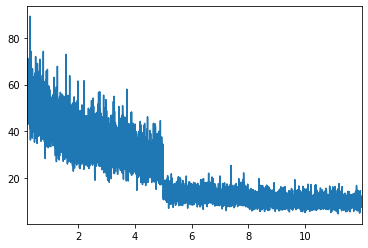

In [40]:
history['train_loss'].iloc[100:].plot();

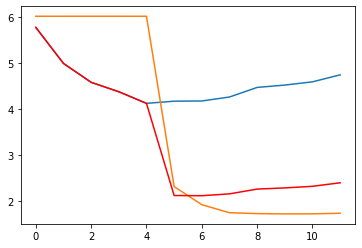

In [42]:
series1 = history.dropna()['mask_loss']
plt.plot(series1.index, series1 ,label = 'mask loss');
series2 = history.dropna()['regr_loss']
plt.plot(series2.index, 30*series2,label = 'regr loss');
series3 = history.dropna()['dev_loss']
plt.plot(series3.index, series3,label = 'dev loss', color = 'red');
plt.show()

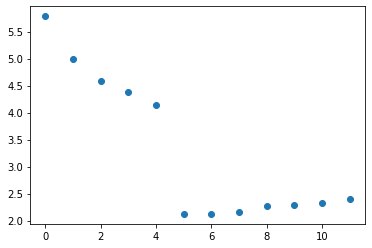

In [43]:
series = history.dropna()['dev_loss']
plt.scatter(series.index, series);

In [51]:
# model.load_state_dict(torch.load('./model-dla.pth'))
# model.eval()

# Visualize predictions

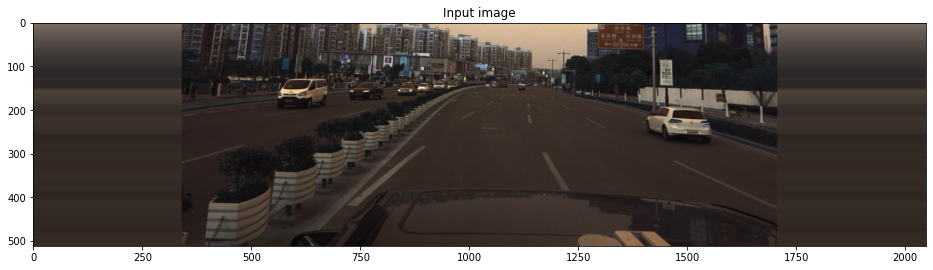

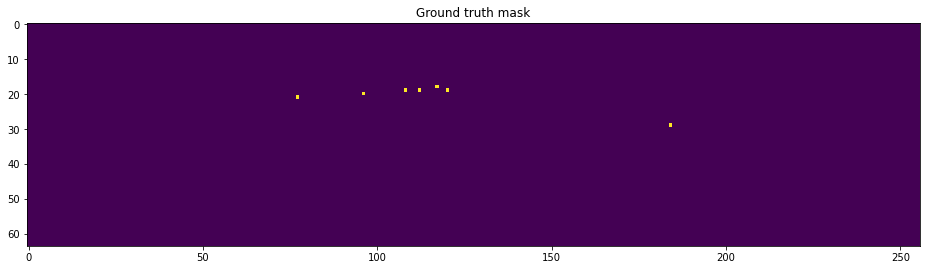

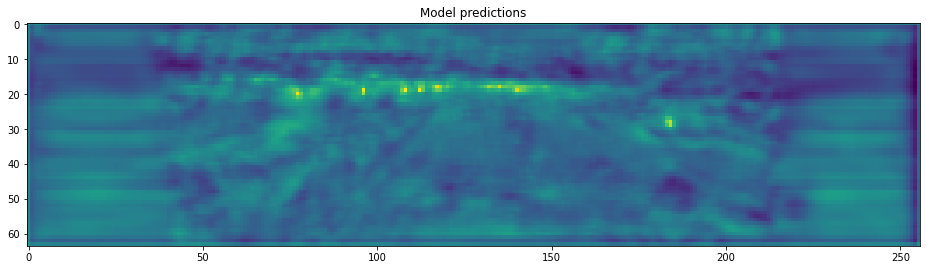

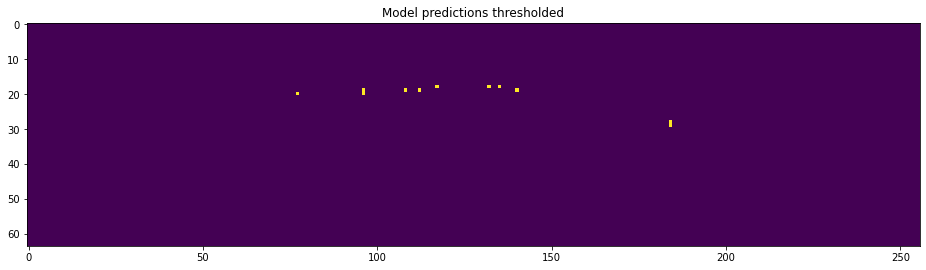

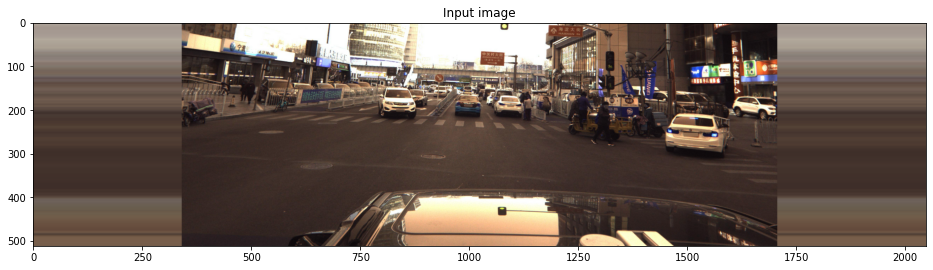

...

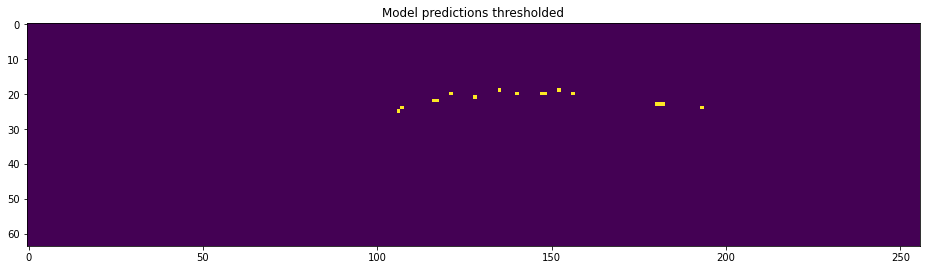

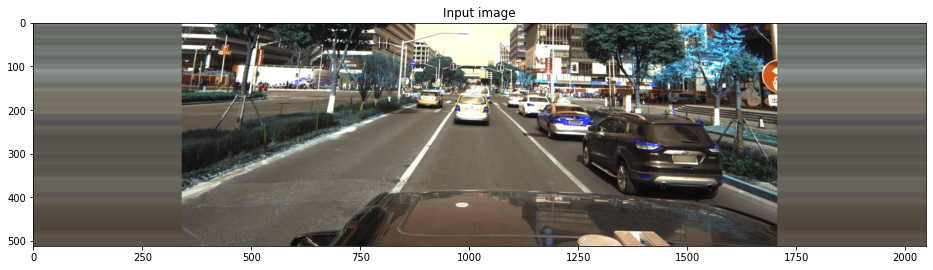

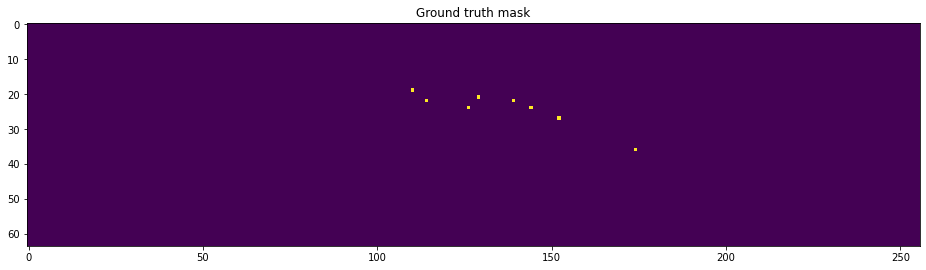

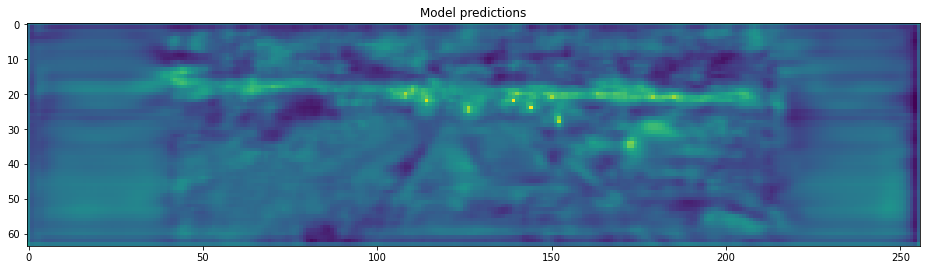

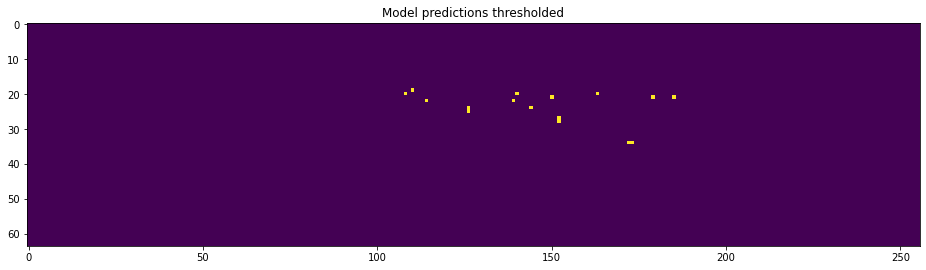

In [121]:
for i in range(10,20):
    img, mask, regr = dev_dataset[i]

    plt.figure(figsize=(16,16))
    plt.title('Input image')
    plt.imshow(np.rollaxis(img, 0, 3))
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Ground truth mask')
    plt.imshow(mask)
    plt.show()

    output = model(torch.tensor(img[None]).to(device))
    logits = output[0]['hm'].data.cpu().numpy()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions')
    plt.imshow(logits[0,0])
    plt.show()


    plt.figure(figsize=(16,16))
    plt.title('Model predictions thresholded')
    plt.imshow(logits[0,0] > -2)
    plt.show()

In [50]:
# ## Simple test of probabilities
# act = torch.nn.Sigmoid()
# logtens = torch.from_numpy(logits)
# probs = act(logtens)
# probs = probs[probs>0.03]
# print(probs)

In [97]:
DISTANCE_THRESH_CLEAR = 2

def convert_3d_to_2d(x, y, z, fx = 2304.5479, fy = 2305.8757, cx = 1686.2379, cy = 1354.9849):
    # stolen from https://www.kaggle.com/theshockwaverider/eda-visualization-baseline
    return x * fx / z + cx, y * fy / z + cy

def optimize_xy(r, c, x0, y0, z0):
    def distance_fn(xyz):
        x, y, z = xyz
        x, y = convert_3d_to_2d(x, y, z0)
        y, x = x, y
        x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + IMG_SHAPE[1] // 4) * IMG_WIDTH / (IMG_SHAPE[1] * 1.5) / MODEL_SCALE
        y = np.round(y).astype('int')
        return (x-r)**2 + (y-c)**2
    
    res = minimize(distance_fn, [x0, y0, z0], method='Powell')
    x_new, y_new, z_new = res.x
    return x_new, y_new, z0

def clear_duplicates(coords):
    for c1 in coords:
        xyz1 = np.array([c1['x'], c1['y'], c1['z']])
        for c2 in coords:
            xyz2 = np.array([c2['x'], c2['y'], c2['z']])
            distance = np.sqrt(((xyz1 - xyz2)**2).sum())
            if distance < DISTANCE_THRESH_CLEAR:
                if c1['confidence'] < c2['confidence']:
                    c1['confidence'] = -1
    return [c for c in coords if c['confidence'] > 0]

def coords2str(coords, names=['yaw', 'pitch', 'roll', 'x', 'y', 'z', 'confidence']):
    s = []
    for c in coords:
        for n in names:
            s.append(str(c.get(n, 0)))
    return ' '.join(s)

In [98]:
# import gc

# torch.cuda.empty_cache()
# gc.collect()

# for idx in range(8):
#     img, mask, regr = dev_dataset[idx]
    
#     output = model(torch.tensor(img[None]).to(device)).data.cpu().numpy()
#     coords_pred = extract_coords(output[0])
#     coords_true = extract_coords(np.concatenate([mask[None], regr], 0))
    
#     img = imread(train_images_dir.format(df_dev['ImageId'].iloc[idx]))
    
#     fig, axes = plt.subplots(1, 2, figsize=(30,30))
#     axes[0].set_title('Ground truth')
#     axes[0].imshow(visualize(img, coords_true))
#     axes[1].set_title('Prediction')
#     axes[1].imshow(visualize(img, coords_pred))
#     plt.show()

In [99]:
# model.load_state_dict(torch.load('./modelGaussian.pth'))
# model.eval()

# Evaluation

In [100]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from math import sqrt, acos, pi, sin, cos
from scipy.spatial.transform import Rotation as R
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_curve
from inspect import signature
import matplotlib.pyplot as plt
from multiprocessing import Pool

def expand_df(df, PredictionStringCols):
    df = df.dropna().copy()
    df['NumCars'] = [int((x.count(' ')+1)/7) for x in df['PredictionString']]

    image_id_expanded = [item for item, count in zip(df['ImageId'], df['NumCars']) for i in range(count)]
    prediction_strings_expanded = df['PredictionString'].str.split(' ',expand = True).values.reshape(-1,7).astype(float)
    prediction_strings_expanded = prediction_strings_expanded[~np.isnan(prediction_strings_expanded).all(axis=1)]
    df = pd.DataFrame(
        {
            'ImageId': image_id_expanded,
            PredictionStringCols[0]:prediction_strings_expanded[:,0],
            PredictionStringCols[1]:prediction_strings_expanded[:,1],
            PredictionStringCols[2]:prediction_strings_expanded[:,2],
            PredictionStringCols[3]:prediction_strings_expanded[:,3],
            PredictionStringCols[4]:prediction_strings_expanded[:,4],
            PredictionStringCols[5]:prediction_strings_expanded[:,5],
            PredictionStringCols[6]:prediction_strings_expanded[:,6]
        })
    return df



#def str2coords(s, names):
#    coords = []
#    for l in np.array(s.split()).reshape([-1, 7]):
#        coords.append(dict(zip(names, l.astype('float'))))
#    return coords

def TranslationDistance(p,g, abs_dist = False):
    dx = p['x'] - g['x']
    dy = p['y'] - g['y']
    dz = p['z'] - g['z']
    diff0 = (g['x']**2 + g['y']**2 + g['z']**2)**0.5
    diff1 = (dx**2 + dy**2 + dz**2)**0.5
    if abs_dist:
        diff = diff1
    else:
        diff = diff1/diff0
    return diff

def RotationDistance(p, g):
    true=[ g['pitch'] ,g['yaw'] ,g['roll'] ]
    pred=[ p['pitch'] ,p['yaw'] ,p['roll'] ]
    q1 = R.from_euler('xyz', true)
    q2 = R.from_euler('xyz', pred)
    diff = R.inv(q2) * q1
    W = np.clip(diff.as_quat()[-1], -1., 1.)
    
    # in the official metrics code:
    # https://www.kaggle.com/c/pku-autonomous-driving/overview/evaluation
    #   return Object3D.RadianToDegree( Math.Acos(diff.W) )
    # this code treat θ and θ+2π differntly.
    # So this should be fixed as follows.
    W = (acos(W)*360)/pi
    if W > 180:
        W = 360 - W
    return W

def print_pr_curve(result_flg, scores, recall_total=1):
    average_precision = average_precision_score(result_flg, scores)
    precision, recall, _ = precision_recall_curve(result_flg, scores)
    recall *= recall_total
    plt.step(recall, precision, color='b', alpha=0.2, where='post')
    plt.fill_between(recall, precision, alpha=0.2, color='b')
    plt.xlabel('Recall')
    plt.ylabel('Precision')
    plt.ylim([0.0, 1.05])
    plt.xlim([0.0, 1.0])
    plt.show()

In [101]:
thres_tr_list = [0.1, 0.09, 0.08, 0.07, 0.06, 0.05, 0.04, 0.03, 0.02, 0.01]
thres_ro_list = [50, 45, 40, 35, 30, 25, 20, 15, 10, 5]

def check_match(idx):
    keep_gt=False
    thre_tr_dist = thres_tr_list[idx]
    thre_ro_dist = thres_ro_list[idx]
    train_dict = {imgID:str2coords(s, names=['carid_or_score', 'pitch', 'yaw', 'roll', 'x', 'y', 'z']) for imgID,s in zip(train_df['ImageId'],train_df['PredictionString'])}
    valid_dict = {imgID:str2coords(s, names=['pitch', 'yaw', 'roll', 'x', 'y', 'z', 'carid_or_score']) for imgID,s in zip(valid_df['ImageId'],valid_df['PredictionString'])}
    result_flg = [] # 1 for TP, 0 for FP
    scores = []
    MAX_VAL = 10**10
    for img_id in valid_dict:
        for pcar in sorted(valid_dict[img_id], key=lambda x: -x['carid_or_score']):
            # find nearest GT
            min_tr_dist = MAX_VAL
            min_idx = -1
            for idx, gcar in enumerate(train_dict[img_id]):
                tr_dist = TranslationDistance(pcar,gcar)
                if tr_dist < min_tr_dist:
                    min_tr_dist = tr_dist
                    min_ro_dist = RotationDistance(pcar,gcar)
                    min_idx = idx
                    
            # set the result
            if min_tr_dist < thre_tr_dist and min_ro_dist < thre_ro_dist:
                if not keep_gt:
                    train_dict[img_id].pop(min_idx)
                result_flg.append(1)
            else:
                result_flg.append(0)
            scores.append(pcar['carid_or_score'])
    
    return result_flg, scores


In [110]:
def extract_coords(prediction, plot=False):
    logits = prediction[0].cpu().numpy() #prediction[0]#peak(prediction[0], threshold1, threshold2)##peak(prediction[0], threshold1, threshold2)
    logits = logits[0]
    
    if plot==True:    
        plt.figure(figsize=(15,8))
        plt.imshow(logits)
        plt.show()

        plt.figure(figsize=(15,8))
        plt.imshow(logits>threshold1)
        plt.show()
    
    regr_output = prediction[1].cpu().numpy()
    points = np.argwhere(logits > -2)
    
    # top 100 points
    (xlist, ylist) = np.where(logits>np.sort(logits.reshape((1,-1)))[0,-100])
    top_list = [pair for pair in zip(list(xlist), list(ylist))]
    
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    
    for r, c in points:
        if (r,c) not in top_list:
            continue
            
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = 1 / (1 + np.exp(-logits[r, c]))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, coords[-1]['x'], coords[-1]['y'], coords[-1]['z'])
    coords = clear_duplicates(coords)
    return coords

100%|██████████| 11/11 [00:06<00:00,  1.66it/s]


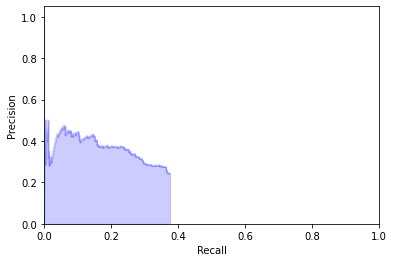

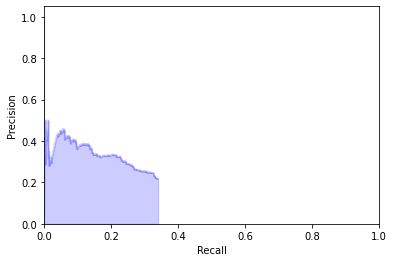

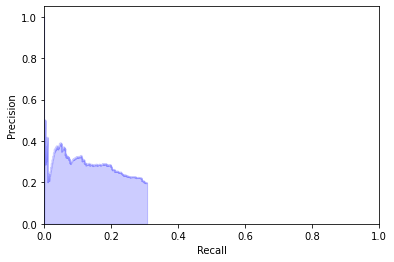

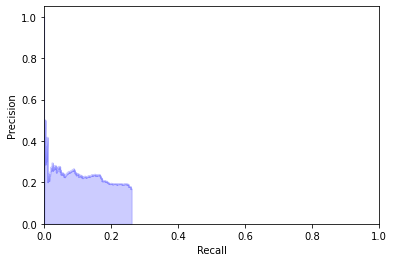

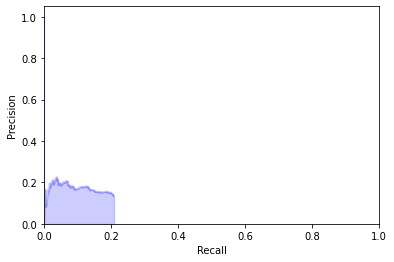

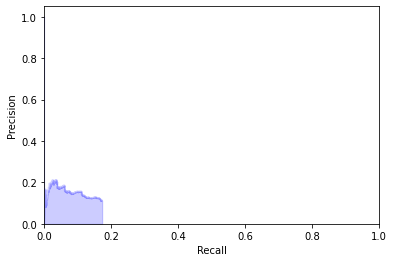

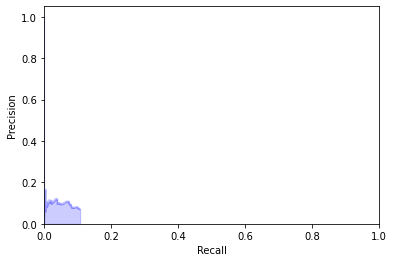

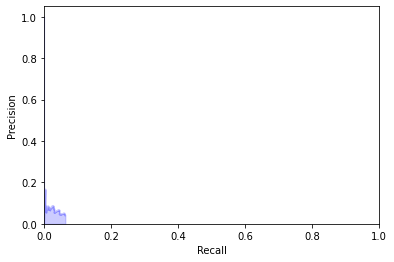

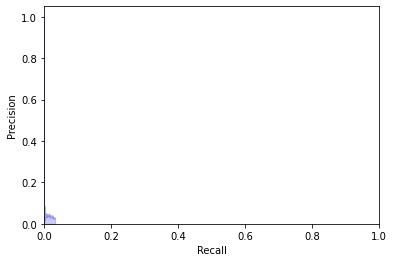

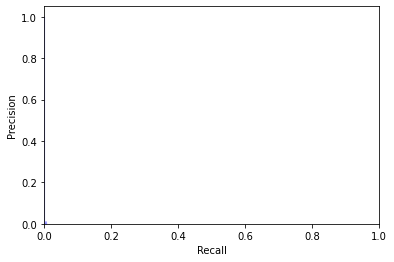

map: 0.04821636143545747


Process ForkPoolWorker-235:
Process ForkPoolWorker-233:
Process ForkPoolWorker-230:
Process ForkPoolWorker-234:
Process ForkPoolWorker-227:
Process ForkPoolWorker-229:
Process ForkPoolWorker-228:
Process ForkPoolWorker-231:
Traceback (most recent call last):
Traceback (most recent call last):
Traceback (most recent call last):
Process ForkPoolWorker-232:
Traceback (most recent call last):
Traceback (most recent call last):
Process ForkPoolWorker-236:
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 9

In [111]:
import copy

predictions = []
dev_loader = DataLoader(dataset=dev_dataset, batch_size=4, shuffle=False, num_workers=4)
model.eval()
for img, _, _ in tqdm(dev_loader):
    with torch.no_grad():
        output = model(img.to(device))
    
    for i in range(output[0]['hm'].shape[0]):
        coords = extract_coords((output[0]['hm'][i], output[0]['reg'][i]))
        s = coords2str(coords)
        predictions.append(s)
        
df_dev['PredictionString'] = copy.copy(predictions)

valid_df = df_dev
expanded_valid_df = expand_df(valid_df, ['pitch','yaw','roll','x','y','z','Score'])
valid_df = valid_df.fillna('')

train_df = pd.read_csv('../input/pku-autonomous-driving/train.csv')
train_df = train_df[train_df.ImageId.isin(valid_df.ImageId.unique())]
# data description page says, The pose information is formatted as
# model type, yaw, pitch, roll, x, y, z
# but it doesn't, and it should be
# model type, pitch, yaw, roll, x, y, z
expanded_train_df = expand_df(train_df, ['model_type','pitch','yaw','roll','x','y','z'])

max_workers = 10
n_gt = len(expanded_train_df)
ap_list = []
p = Pool(processes=max_workers)
for result_flg, scores in p.imap(check_match, range(10)):
    if np.sum(result_flg) > 0:
        n_tp = np.sum(result_flg)
        recall = n_tp/n_gt
        ap = average_precision_score(result_flg, scores)*recall
        print_pr_curve(result_flg, scores, recall)
    else:
        ap = 0
    ap_list.append(ap)
map = np.mean(ap_list)
print('map:', map)

# validation prediction

In [47]:
threshold1 = -2
threshold2 = 1

In [48]:
# map: 0.10844716601852893 # -2
# map: 0.11908345067814112 # -3
# map: 0.1279842909587167  # -4
# map: 0.13395854895945764 # -5 
# map: 0.1383288800848642  # -6
# map: 0.14158187970998287 # -7

In [49]:
def peak_tmp(array, threshold1, threshold2):
    print(array.shape)
    (xlist, ylist) = np.where(array[0]>np.sort(array[0].reshape((1,-1)))[0][-100])
    
    peak_array = array[0]
    maximum = array.max()
    
    advantage = 0
    for k in range(len(xlist)):
        i = xlist[k]
        j = ylist[k]
        ct1 = 0 # 주변의 점들이 top 50 안에 있는가
        ct2 = 0 # 주변의 점들의 값이 더 작은가 
        
        if 0<i<array.shape[1]-1 and 0<j<array.shape[2]-1:    
            surroundings = [(i-1,j+1),(i-1,j),(i-1,j+1),(i,j-1),(i,j+1),(i+1,j+1),(i+1,j),(i+1,j+1)]
            for xy in surroundings:
                if xy[0] in xlist and xy[1] in ylist:
                    ct1 += 1
                if peak_array[i,j] > peak_array[xy[0], xy[1]]:
                    ct2 += 1
            if ct1 > 6 and ct2 > 7:
                advantage += 1
                peak_array[i,j]+=(maximum - peak_array[i,j])*(1/2)
            
    penalty = np.zeros(array[0].shape)
    
    
    for i in range(1,array.shape[1]-1):
        for j in range(1,array.shape[2]-1):    
            ct_sur = 0
            ct_vert = 0
            ct_hori = 0
            surroundings = [(i,j),(i,j+1),(i+1,j),(i+1,j+1)]
            horizontal = [(i,j-1),(i,j),(i,j+1)]
            vertical = [(i-1,j),(i,j),(i+1,j)] 
            
            for xy in surroundings:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_sur += 1
                    
            for xy in vertical:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_vert += 1

            for xy in vertical:
                if array[0][xy[0],xy[1]]>threshold1:
                    ct_hori += 1

            if ct_sur > 2:
                idx = np.argmax(np.array([array[0][i,j],array[0][i,j+1],array[0][i+1,j],array[0][i+1,j+1]]))
                if idx == 0:
                    penalty[i,j+1]-=1
                    penalty[i+1,j]-=1
                    penalty[i+1,j+1]-=1
                elif idx == 1:
                    penalty[i,j]-=1
                    penalty[i+1,j]-=1
                    penalty[i+1,j+1]-=1
                elif idx == 2:
                    penalty[i,j]-=1
                    penalty[i,j+1]-=1
                    penalty[i+1,j+1]-=1
                elif idx == 3:
                    penalty[i,j]-=1
                    penalty[i,j+1]-=1
                    penalty[i+1,j]-=1

            elif ct_sur > 1:
                idx = np.argmax(np.array([array[0][i,j],array[0][i,j+1],array[0][i+1,j],array[0][i+1,j+1]]))
                if idx == 0:
                    penalty[i,j+1]-=0.3
                    penalty[i+1,j]-=0.3
                    penalty[i+1,j+1]-=0.3
                elif idx == 1:
                    penalty[i,j]-=0.3
                    penalty[i+1,j]-=0.3
                    penalty[i+1,j+1]-=0.3
                elif idx == 2:
                    penalty[i,j]-=0.3
                    penalty[i,j+1]-=0.3
                    penalty[i+1,j+1]-=0.3
                elif idx == 3:
                    penalty[i,j]-=0.3
                    penalty[i,j+1]-=0.3
                    penalty[i+1,j]-=0.3

            if ct_vert == 3:
                idx = np.argmax(np.array([array[0][i-1,j],array[0][i,j],array[0][i+1,j]]))
                if idx == 0:
                    penalty[i,j]-=0.5
                    penalty[i+1,j]-=0.5
                elif idx == 1:
                    penalty[i-1,j]-=0.5
                    penalty[i+1,j]-=0.5
                elif idx == 2:
                    penalty[i-1,j]-=0.5
                    penalty[i,j]-=0.5
                    
            if ct_hori == 3:
                idx = np.argmax(np.array([array[0][i-1,j],array[0][i,j],array[0][i+1,j]]))
                if idx == 0:
                    penalty[i,j]-=0.5
                    penalty[i,j+1]-=0.5
                elif idx == 1:
                    penalty[i,j-1]-=0.5
                    penalty[i,j+1]-=0.5
                elif idx == 2:
                    penalty[i,j-1]-=0.5
                    penalty[i,j]-=0.5
                    
                
    print("advantage:", advantage)
    print("penalty:", np.sum(penalty))            
    peak_array = peak_array + penalty*threshold2
    
    threshold_iter = 0
    while np.sum(peak_array>threshold1)<5 and threshold_iter<8:
        threshold_iter+=1
        peak_array += 0.5
        print("brighter:", np.sum(peak_array>threshold1))
        
        #if idx==1 and array[i,j]>threshold1-3:
        #    peak_array[i,j]+=(maximum - peak_array[i,j])*(2/3)
        #if idx==0 and array[i,j]>threshold1:
        #    peak_array[i,j]+=(maximum - peak_array[i,j])*(2/3)
            
        #if array[i,j]>threshold1+threshold2: #1.5
        #    pass#peak_array[i,j]+=0.5 #1
    return peak_array, advantage

In [50]:
# import copy

# predictions = []
# dev_loader = DataLoader(dataset=dev_dataset, batch_size=4, shuffle=False, num_workers=4)
# model.eval()
# for img, _, _ in tqdm(dev_loader):
#     with torch.no_grad():
#         output = model(img.to(device))
    
#     for i in range(output[0]['hm'].shape[0]):
#         coords = extract_coords((output[0]['hm'][i][0], output[0]['reg'][i][0]), threshold1, threshold2)
#         s = coords2str(coords)
#         predictions.append(s)
        
# df_dev['PredictionString'] = copy.copy(predictions)

# valid_df = df_dev
# expanded_valid_df = expand_df(valid_df, ['pitch','yaw','roll','x','y','z','Score'])
# valid_df = valid_df.fillna('')

# train_df = pd.read_csv('../input/pku-autonomous-driving/train.csv')
# train_df = train_df[train_df.ImageId.isin(valid_df.ImageId.unique())]
# # data description page says, The pose information is formatted as
# # model type, yaw, pitch, roll, x, y, z
# # but it doesn't, and it should be
# # model type, pitch, yaw, roll, x, y, z
# expanded_train_df = expand_df(train_df, ['model_type','pitch','yaw','roll','x','y','z'])

# max_workers = 10
# n_gt = len(expanded_train_df)
# ap_list = []
# p = Pool(processes=max_workers)
# for result_flg, scores in p.imap(check_match, range(10)):
#     if np.sum(result_flg) > 0:
#         n_tp = np.sum(result_flg)
#         recall = n_tp/n_gt
#         ap = average_precision_score(result_flg, scores)*recall
#         print_pr_curve(result_flg, scores, recall)
#     else:
#         ap = 0
#     ap_list.append(ap)
# map = np.mean(ap_list)
# print('map:', map)

# score = {}
# score[str(threshold1)+'_'+str(threshold2)]=map

In [51]:
# train = pd.read_csv(PATH + 'train.csv')
# test = pd.read_csv(PATH + 'sample_submission.csv')

# # From camera.zip
# camera_matrix = np.array([[2304.5479, 0,  1686.2379],
#                           [0, 2305.8757, 1354.9849],
#                           [0, 0, 1]], dtype=np.float32)
# camera_matrix_inv = np.linalg.inv(camera_matrix)

# train_images_dir = PATH + 'train_images/{}.jpg'
# test_images_dir = PATH + 'test_images/{}.jpg'

# df_train, df_dev = train_test_split(train, test_size=0.01, random_state=42)
# df_test = test

# # Create dataset objects
# train_dataset = CarDataset(df_train, train_images_dir)
# dev_dataset = CarDataset(df_dev, train_images_dir)
# test_dataset = CarDataset(df_test, test_images_dir)

In [52]:
threshold1 = -2
threshold2 = 1

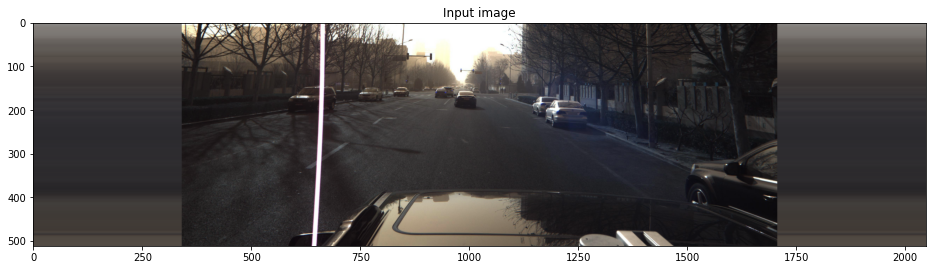

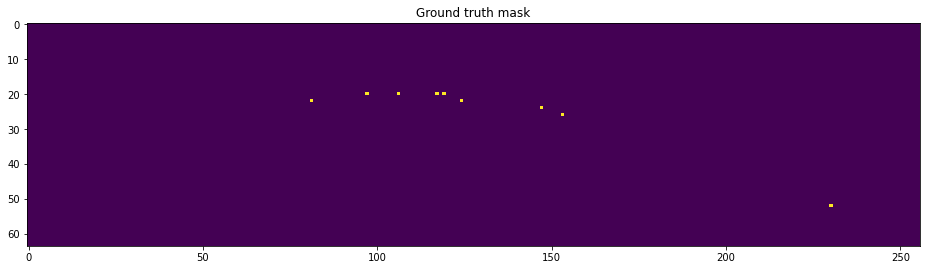

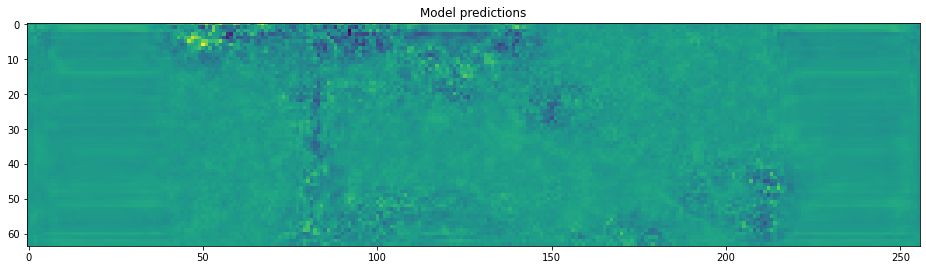

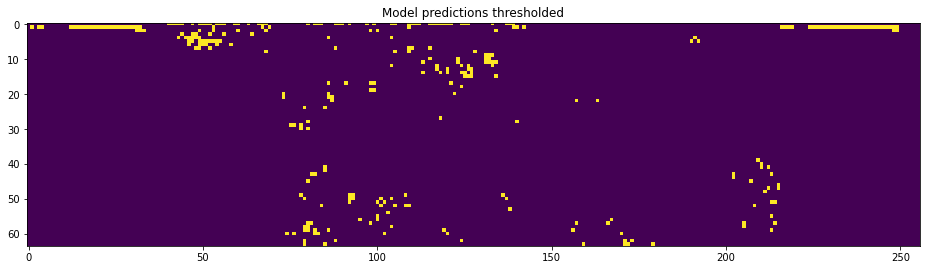

(1, 64, 256)
advantage: 11
penalty: -279.0


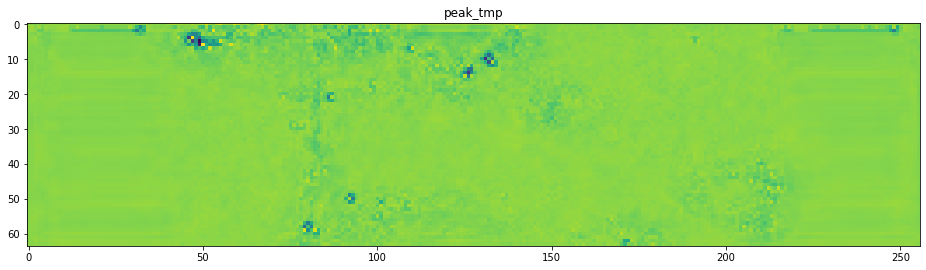

GT count: 9
MP count: 306
PEAK count: 168


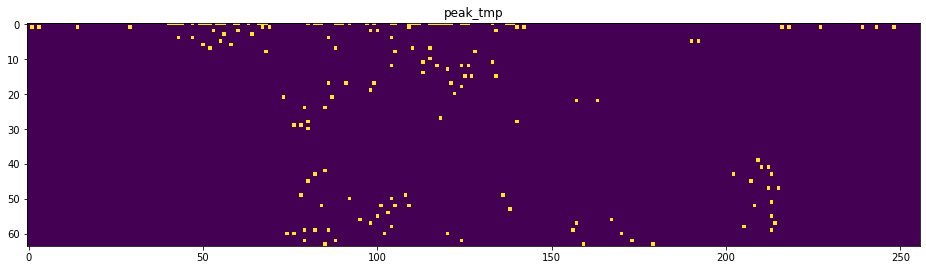

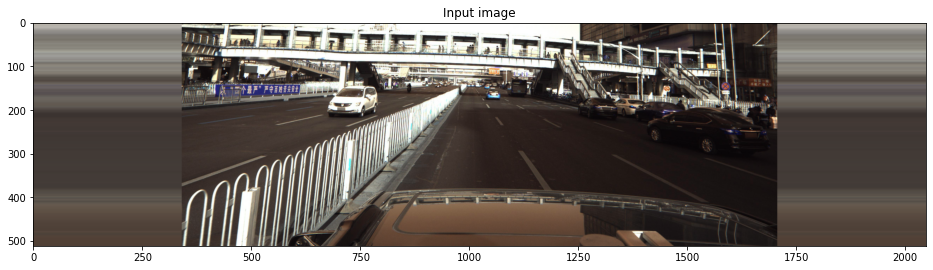

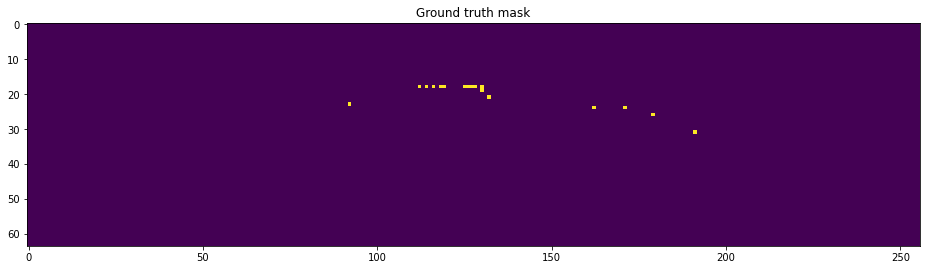

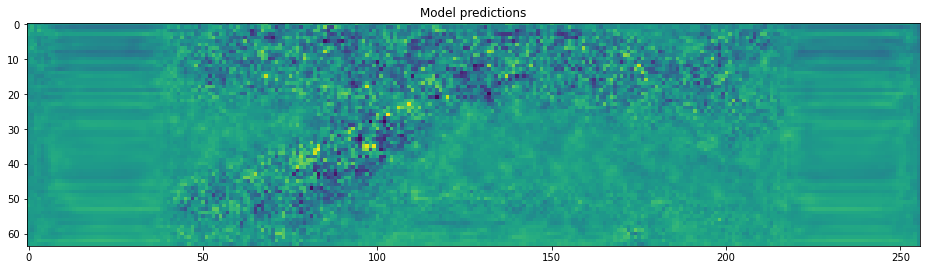

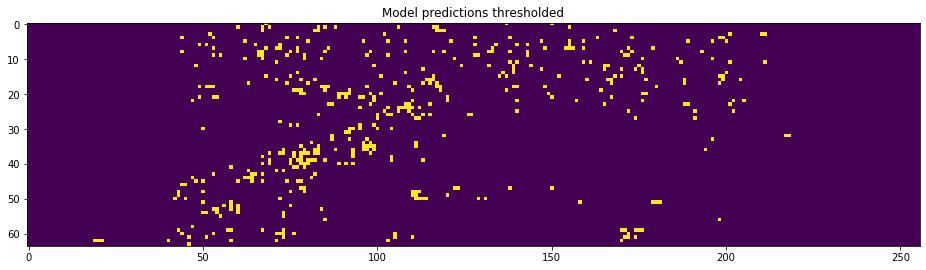

(1, 64, 256)
advantage: 31
penalty: -439.6


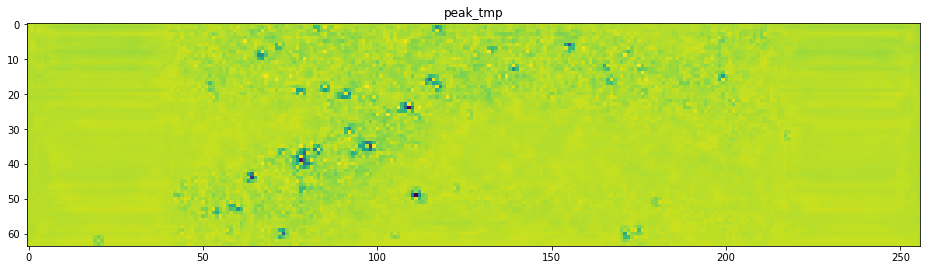

GT count: 17
MP count: 456
PEAK count: 265


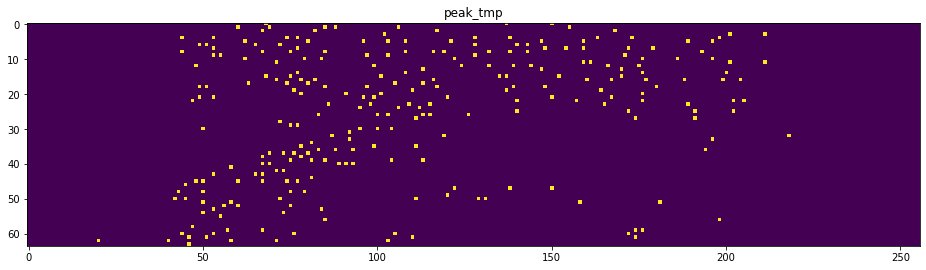

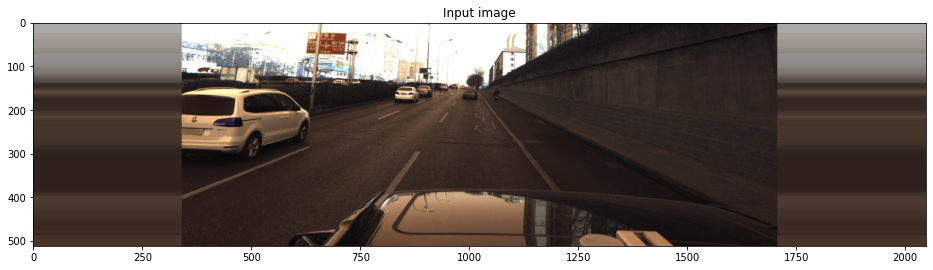

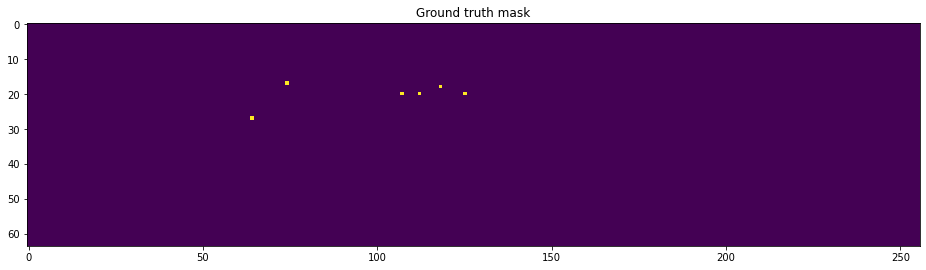

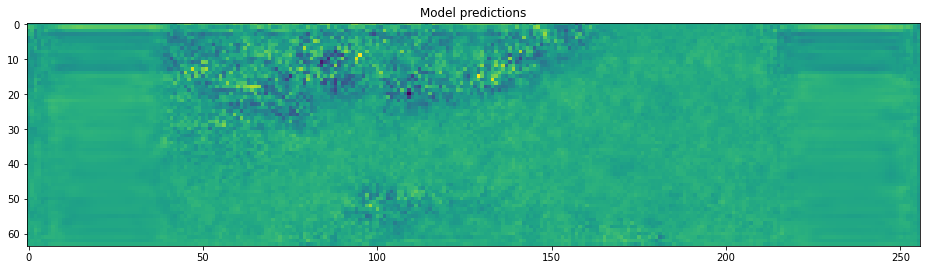

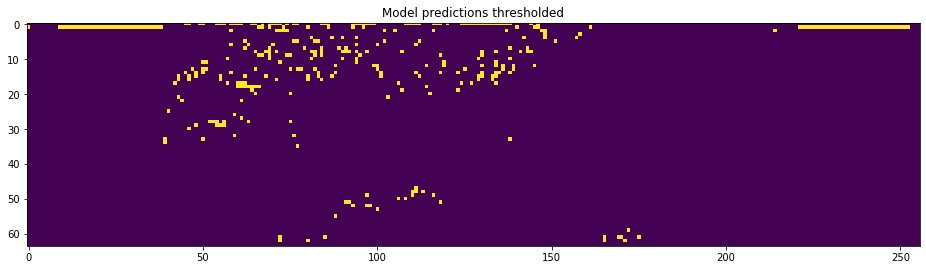

(1, 64, 256)
advantage: 33
penalty: -256.09999999999997


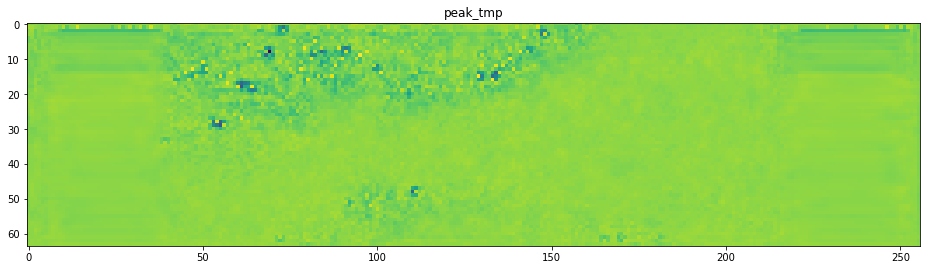

GT count: 6
MP count: 351
PEAK count: 208


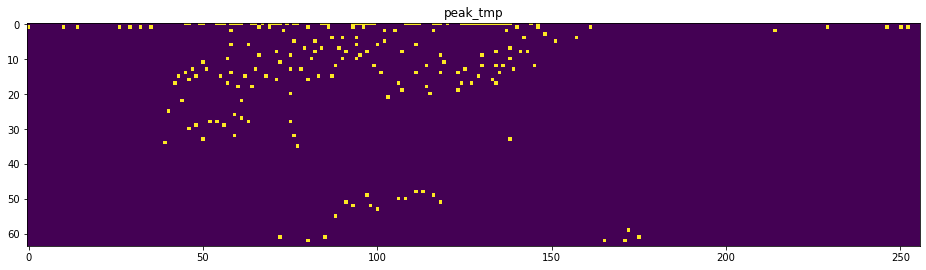

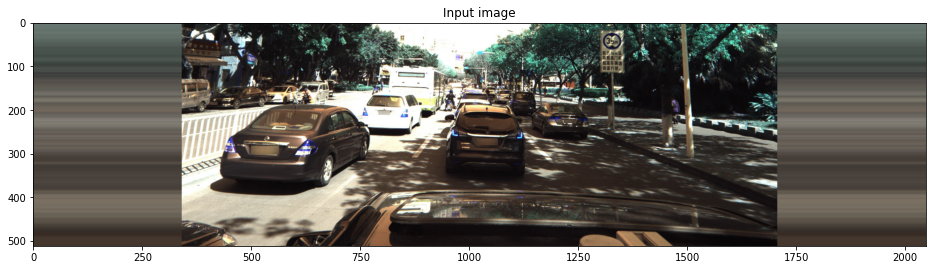

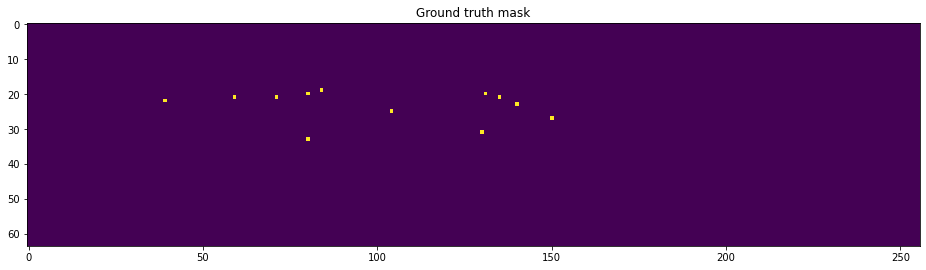

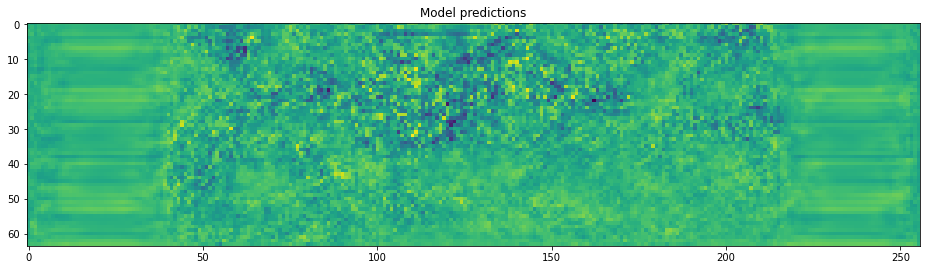

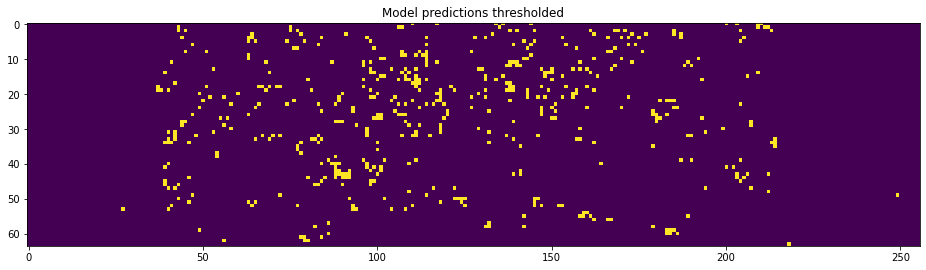

(1, 64, 256)
advantage: 27
penalty: -456.4


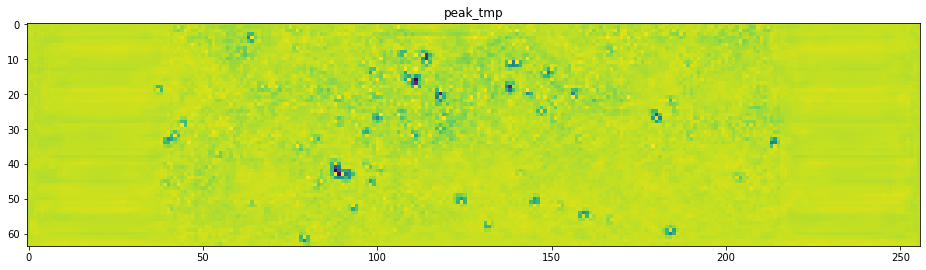

GT count: 12
MP count: 511
PEAK count: 309


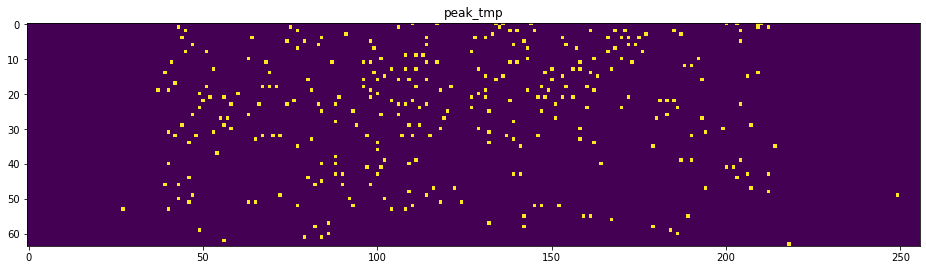

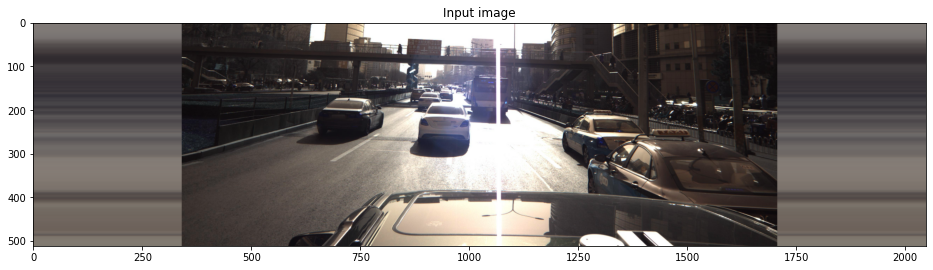

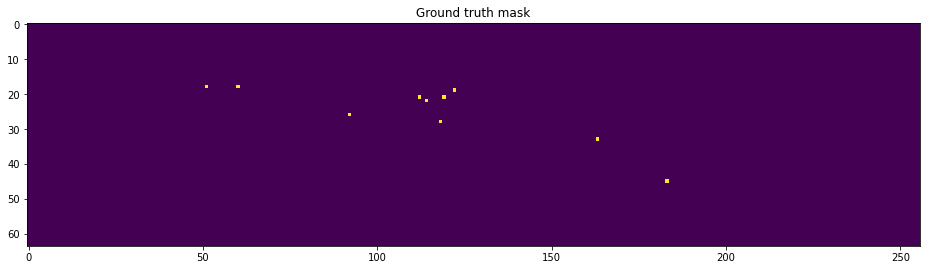

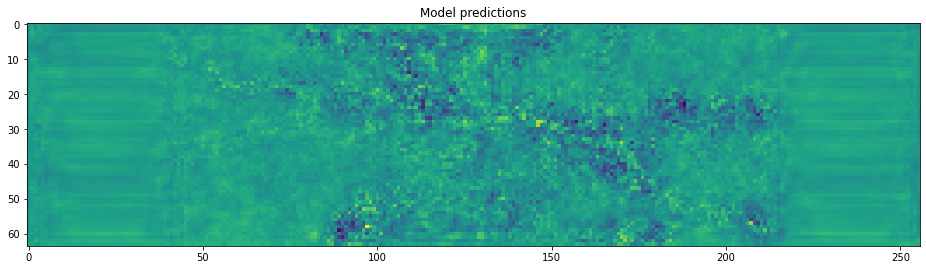

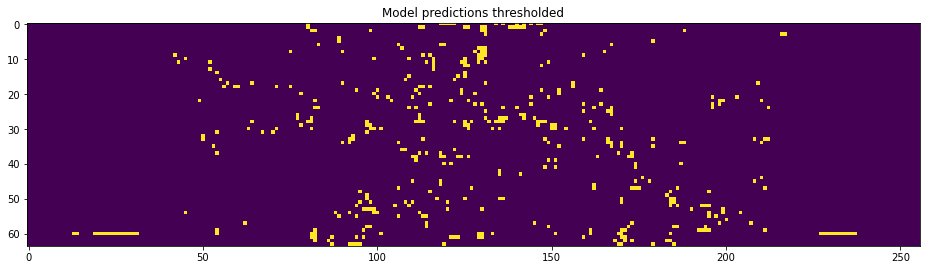

(1, 64, 256)
advantage: 21
penalty: -412.3


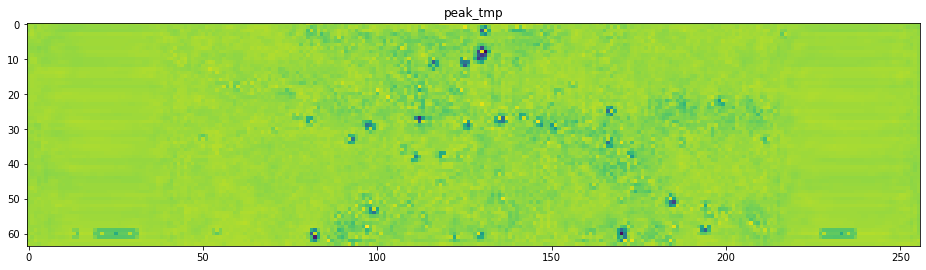

GT count: 10
MP count: 439
PEAK count: 252


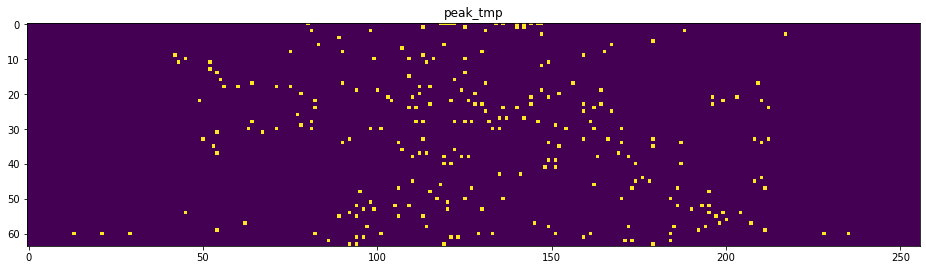

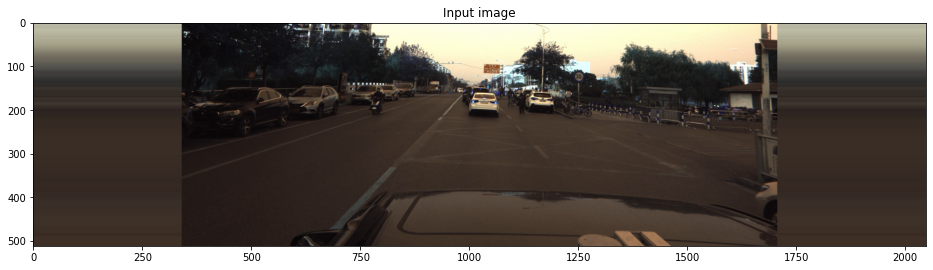

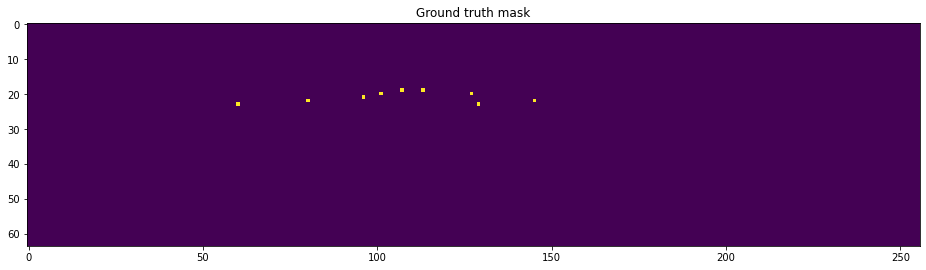

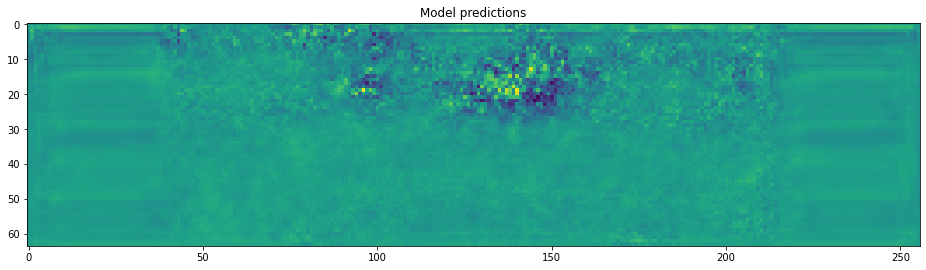

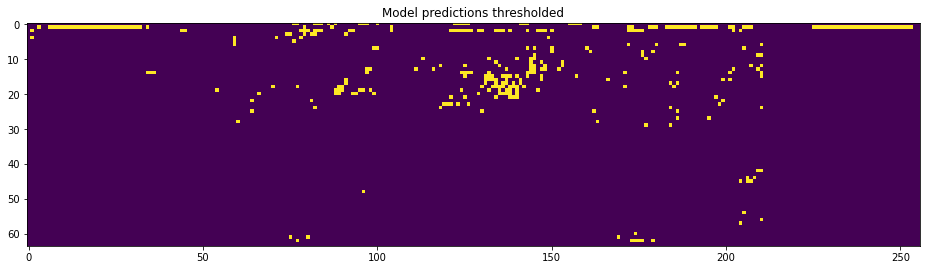

(1, 64, 256)
advantage: 30
penalty: -390.5


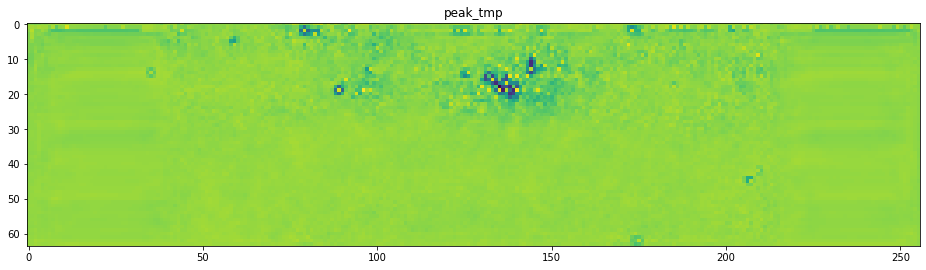

GT count: 9
MP count: 352
PEAK count: 173


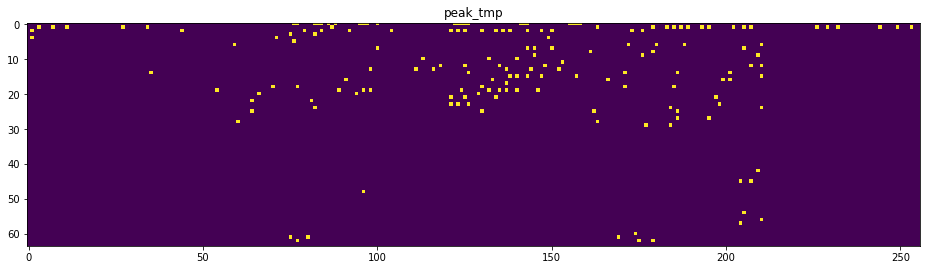

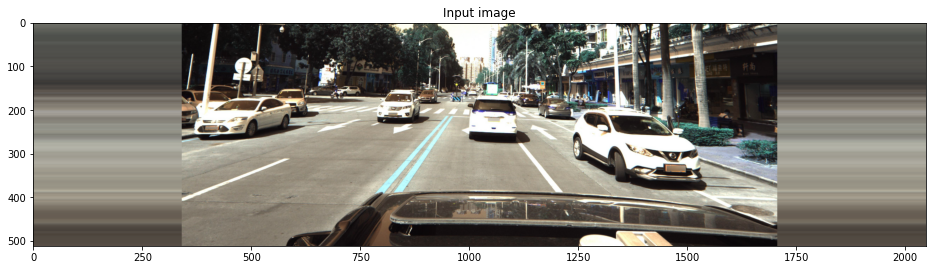

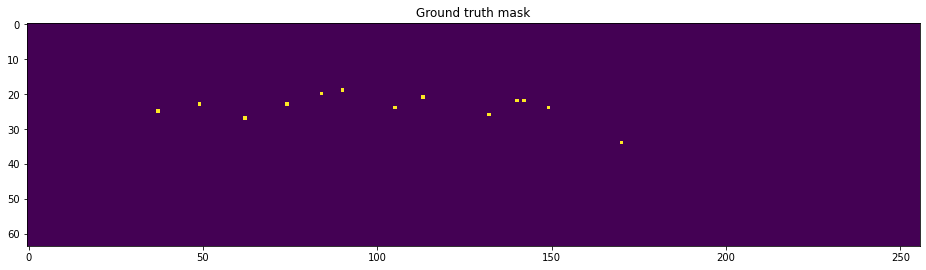

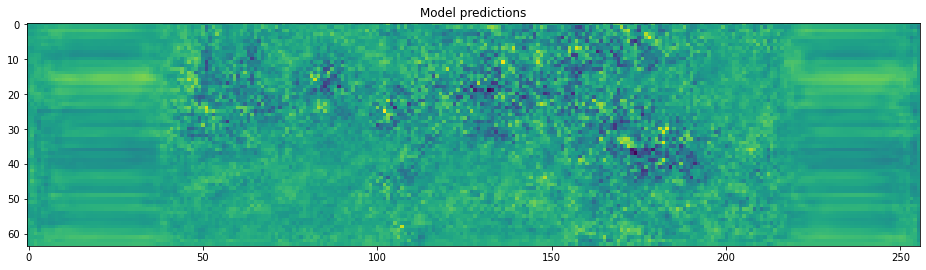

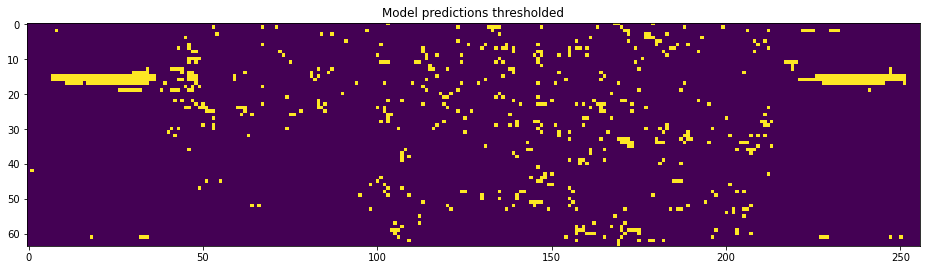

(1, 64, 256)
advantage: 30
penalty: -999.4000000000001


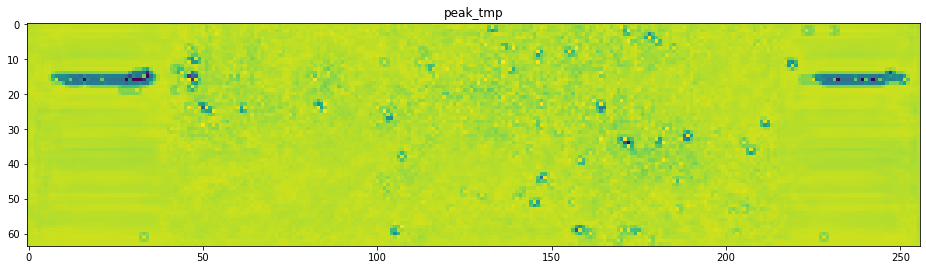

GT count: 13
MP count: 695
PEAK count: 315


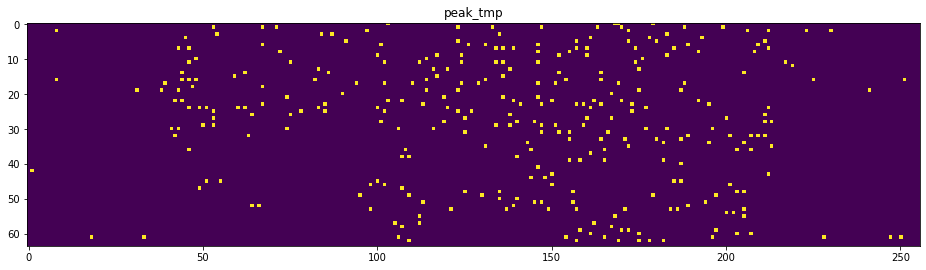

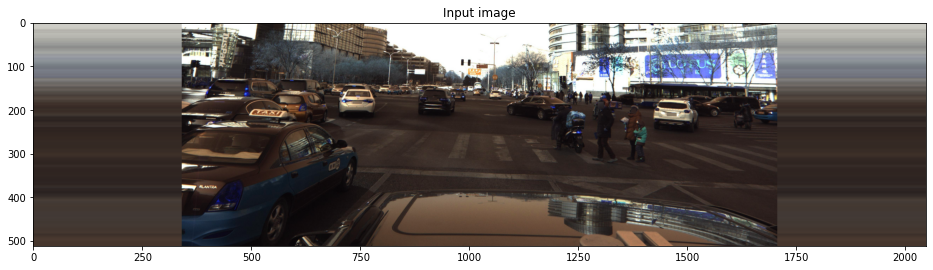

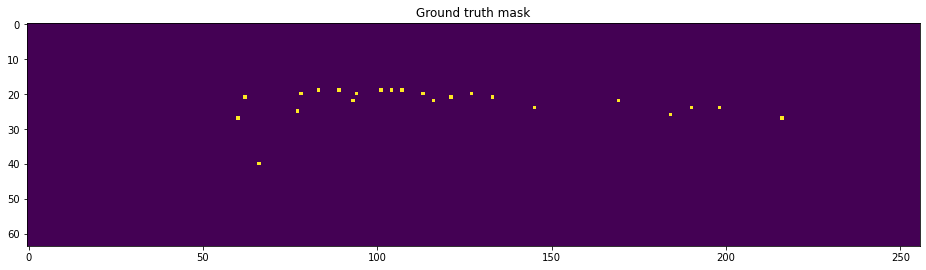

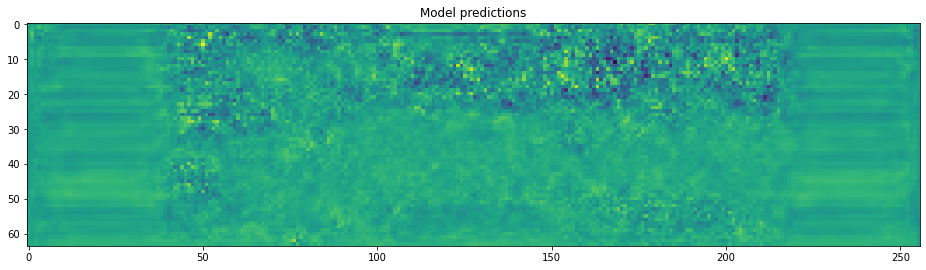

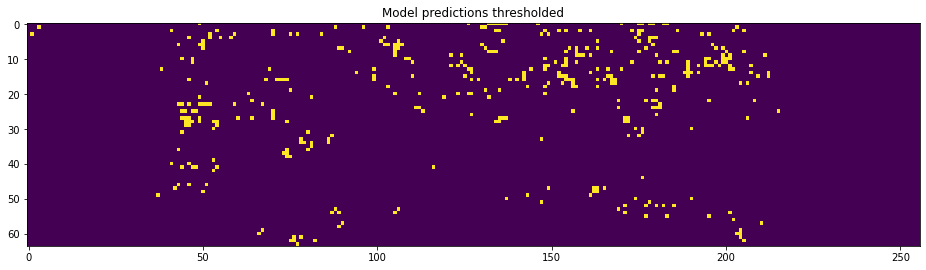

(1, 64, 256)
advantage: 22
penalty: -368.0


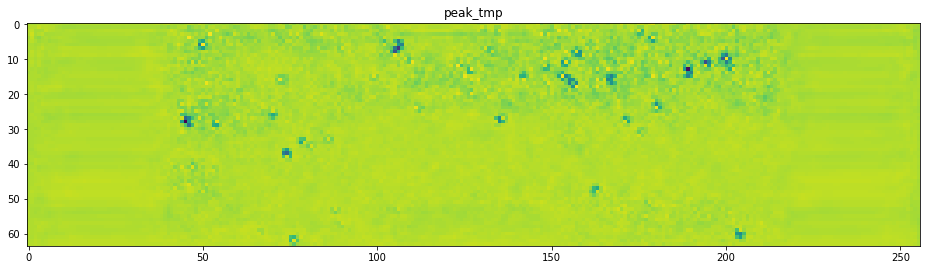

GT count: 23
MP count: 392
PEAK count: 234


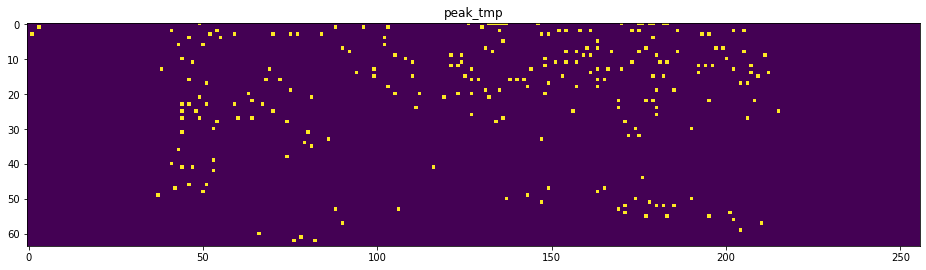

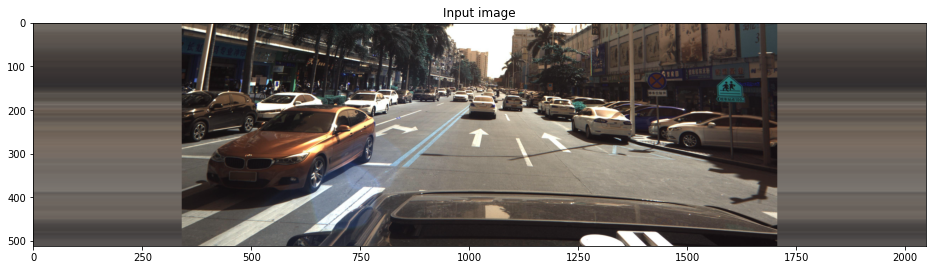

KeyboardInterrupt: 

KeyboardInterrupt: 

In [53]:
for i in range(40,50):
    img, mask, regr = train_dataset[i]
    plt.figure(figsize=(16,16))
    plt.title('Input image')
    plt.imshow(np.rollaxis(img, 0, 3))
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Ground truth mask')
    plt.imshow(mask)
    plt.show()
    
    output = model(torch.tensor(img[None]).to(device))
    output = output[0]['hm']
    logits = output[0,0].data.cpu().numpy()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions')
    plt.imshow(logits)
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions thresholded')
    plt.imshow(logits>-2)
    plt.show()
    
    img, idx = peak_tmp(logits[None],threshold1,threshold2)
    plt.figure(figsize=(16,16))
    plt.title('peak_tmp')
    plt.imshow(img)
    plt.show()

    print("GT count:", np.sum(mask>0))
    print("MP count:", np.sum(logits>-2))
    print("PEAK count:", np.sum(img>-2))
    
    plt.figure(figsize=(16,16))
    plt.title('peak_tmp')
    plt.imshow(img>-2)
    plt.show()


# Make submission

In [55]:
def show_coords(prediction, threshold1, threshold2):
    logits, idx = peak_tmp(prediction[0][0][None].cpu().numpy(), threshold1, threshold2) #peak_tmp(prediction, threshold1, threshold2) #peak(prediction[0], threshold1, threshold2)#prediction[0]#peak(prediction[0], threshold1, threshold2)##peak(prediction[0], threshold1, threshold2)
    plt.figure(figsize=(12, 8))
    plt.imshow(logits)
    plt.show()

    regr_output = prediction[1:]
    plt.figure(figsize=(12, 8))
    plt.imshow(logits > threshold1)
    plt.show()

In [56]:
# Show prediction results

  0%|          | 0/506 [00:00<?, ?it/s]

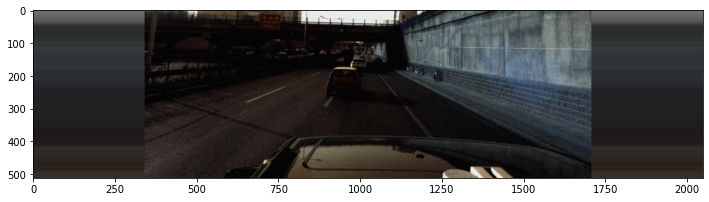

(1, 64, 256)
advantage: 0
penalty: 0.0
brighter: 16384


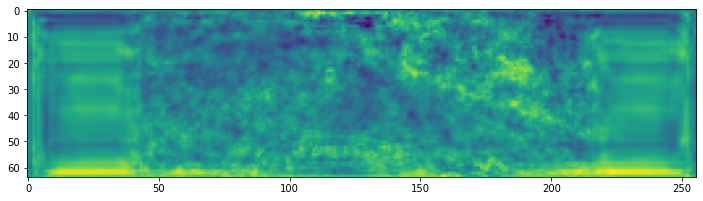

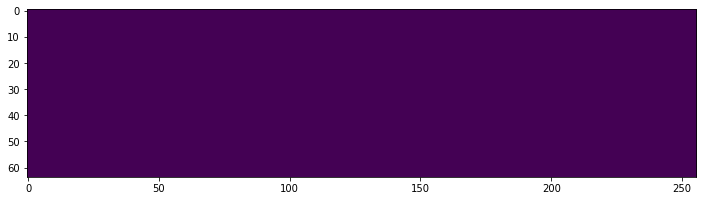

  0%|          | 1/506 [00:02<23:53,  2.84s/it]

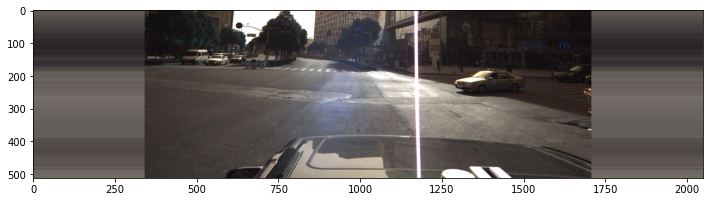

(1, 64, 256)
advantage: 16
penalty: 0.0
brighter: 16384


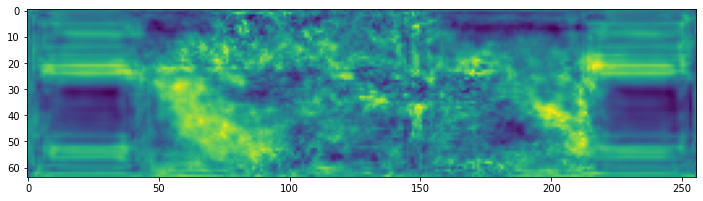

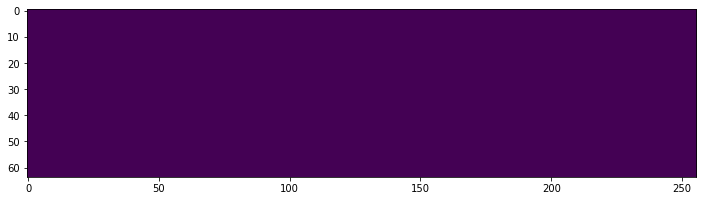

  0%|          | 2/506 [00:04<20:18,  2.42s/it]

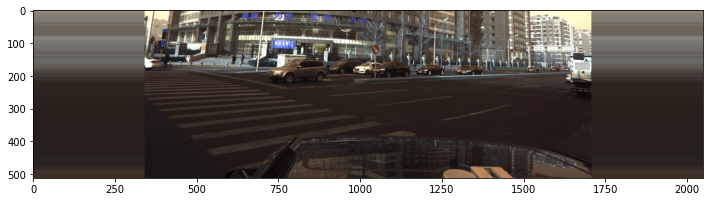

(1, 64, 256)
advantage: 12
penalty: 0.0
brighter: 16384


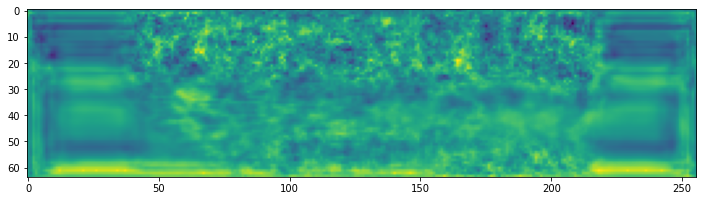

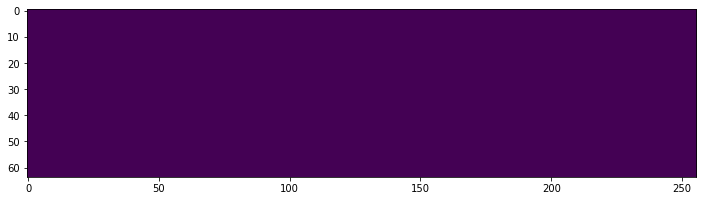

  1%|          | 3/506 [00:05<18:04,  2.16s/it]

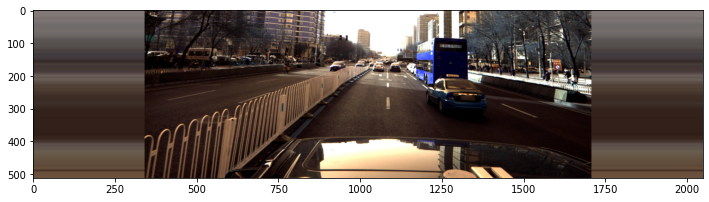

(1, 64, 256)
advantage: 15
penalty: 0.0
brighter: 16384


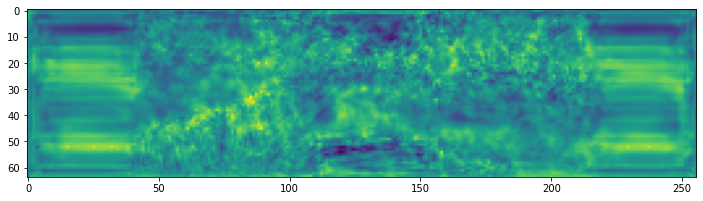

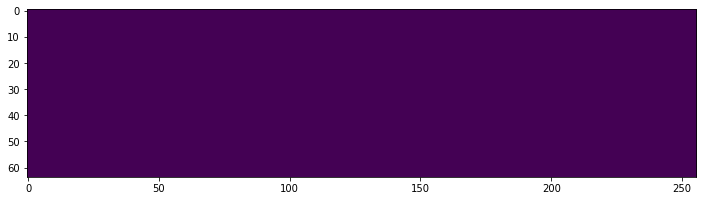

  1%|          | 4/506 [00:07<16:06,  1.92s/it]

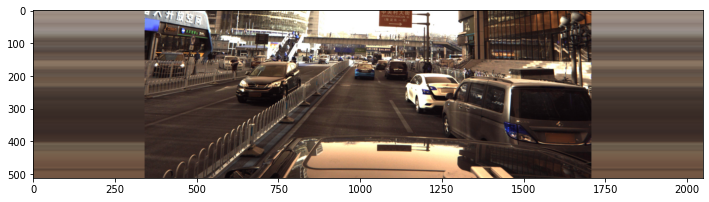

(1, 64, 256)
advantage: 12
penalty: 0.0
brighter: 16384


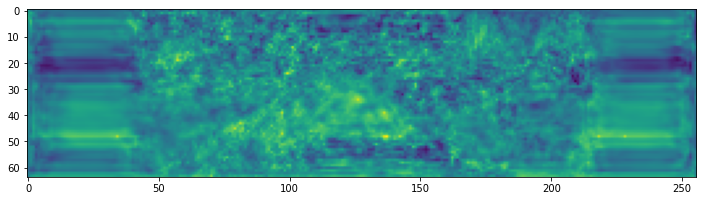

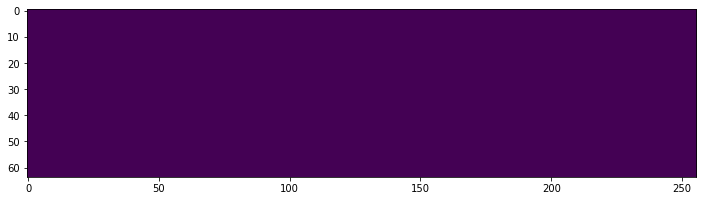

  1%|          | 5/506 [00:08<14:35,  1.75s/it]Process Process-5:
Process Process-7:
Process Process-8:
Traceback (most recent call last):
Traceback (most recent call last):
  1%|          | 5/506 [00:08<14:26,  1.73s/it]  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)



KeyboardInterrupt: 

  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 96, in _worker_loop
    r = index_queue.get(timeout=MANAGER_STATUS_CHECK_INTERVAL)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/queues.py", line 104, in get
    if not self._poll(timeout):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 96, in _worker_loop
    r = index_queue.get(timeout=MANAGER_STATUS_CHECK_INTERVAL)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/queues.py", line 104, in get
    if not self._poll(timeout):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/mult

In [57]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)
model.eval()


for img, _, _ in tqdm(test_loader):
    
    plt.figure(figsize=(12, 8))
    plt.imshow(np.einsum('ijk->jki', img[0]))
    plt.show()
    
    with torch.no_grad():
        output = model(img.to(device))
    output = output[0]['hm']
    show_coords(output,threshold1, threshold2)
        

In [176]:
def extract_coords(prediction, threshold1, threshold2, plot=False):
    logits, idx = peak_tmp(prediction[0].cpu().numpy(), threshold1, threshold2)#prediction[0]#peak(prediction[0], threshold1, threshold2)##peak(prediction[0], threshold1, threshold2)
    
    if plot==True:    
        plt.figure(figsize=(15,8))
        plt.imshow(logits)
        plt.show()

        plt.figure(figsize=(15,8))
        plt.imshow(logits>threshold1)
        plt.show()
    
    regr_output = prediction[1]
    points = np.argwhere(logits > threshold1)
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    if len(points) == 0:
        print('no points')
        return coords
    
    
    for r,c in zip(points[:,0], points[:,1]): #.numpy() .numpy()
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        for val in regr_dict:
            #if type(regr_dict[val])==torch.Tensor:
            regr_dict[val] = np.float32(regr_dict[val])
                             
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = np.float32(1 / (1 + np.exp(-logits[r, c])))
        #coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, np.float(coords[-1]['x'].cpu().numpy()), np.float(coords[-1]['x'].cpu().numpy()), np.float(coords[-1]['z'].cpu().numpy()))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = optimize_xy(r, c, coords[-1]['x'], coords[-1]['y'], coords[-1]['z'])
    coords = clear_duplicates(coords)
    return coords

In [194]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)

model.eval()

plot = False

for img, _, _ in tqdm(test_loader):
    
    idx = 0
    
    with torch.no_grad():
        output = model(img.to(device))
    for i in range(output[0]['hm'].shape[0]):
        coords = extract_coords((output[0]['hm'][i], output[0]['reg'][i]), threshold1, threshold2, plot)
        s = coords2str(coords)
        predictions.append(s)
        
        if plot == True:
            plt.figure(figsize=(15, 8))
            plt.imshow(np.einsum('ijk->jki', img[idx]))
            plt.show()

        idx += 1
        
test = pd.read_csv(PATH + 'sample_submission.csv')
test['PredictionString'] = predictions
test.to_csv('predictions_DLA'+'_'+str(threshold1)+'_'+str(threshold2)+'.csv', index=False)
test.head()








  0%|          | 0/506 [00:00<?, ?it/s]

(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 0
brighter: 0
brighter: 1
brighter: 1
brighter: 6
(1, 64, 256)
advantage: 11
penalty: -3.6
(1, 64, 256)
advantage: 18
penalty: -18.6
(1, 64, 256)









  0%|          | 1/506 [00:03<31:21,  3.73s/it]

advantage: 15
penalty: -16.2
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 8
penalty: -8.4
(1, 64, 256)









  0%|          | 2/506 [00:06<27:39,  3.29s/it]

advantage: 16
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 9
penalty: -9.0
(1, 64, 256)
advantage: 15
penalty: -21.599999999999998
(1, 64, 256)
advantage: 13
penalty: -11.7
(1, 64, 256)









  1%|          | 3/506 [00:08<25:23,  3.03s/it]

advantage: 11
penalty: -10.2
(1, 64, 256)
advantage: 19
penalty: -22.1
(1, 64, 256)
advantage: 9
penalty: -12.0
(1, 64, 256)
advantage: 14
penalty: -1.7999999999999998
(1, 64, 256)









  1%|          | 4/506 [00:10<23:48,  2.85s/it]

advantage: 16
penalty: -5.699999999999999
(1, 64, 256)
advantage: 14
penalty: -6.300000000000001
(1, 64, 256)
advantage: 22
penalty: -45.599999999999994
(1, 64, 256)
advantage: 16
penalty: -2.6999999999999997
(1, 64, 256)









  1%|          | 5/506 [00:13<22:56,  2.75s/it]

advantage: 13
penalty: -13.799999999999999
(1, 64, 256)
advantage: 13
penalty: -16.5
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 17
penalty: -19.2
(1, 64, 256)









  1%|          | 6/506 [00:15<22:26,  2.69s/it]

advantage: 16
penalty: -15.6
(1, 64, 256)
advantage: 18
penalty: -20.1
(1, 64, 256)
advantage: 9
penalty: -18.299999999999997
(1, 64, 256)
advantage: 16
penalty: -27.6
(1, 64, 256)









  1%|▏         | 7/506 [00:18<22:22,  2.69s/it]

advantage: 14
penalty: -20.999999999999996
(1, 64, 256)
advantage: 11
penalty: -10.2
(1, 64, 256)
advantage: 12
penalty: -24.6
(1, 64, 256)
advantage: 23
penalty: -39.3
(1, 64, 256)









  2%|▏         | 8/506 [00:21<22:09,  2.67s/it]

advantage: 15
penalty: -5.4
(1, 64, 256)
advantage: 16
penalty: -15.6
(1, 64, 256)
advantage: 12
penalty: -11.1
(1, 64, 256)
advantage: 14
penalty: -13.8
(1, 64, 256)









  2%|▏         | 9/506 [00:23<21:49,  2.64s/it]

advantage: 14
penalty: -10.2
(1, 64, 256)
advantage: 15
penalty: -15.299999999999999
(1, 64, 256)
advantage: 10
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 15
penalty: -8.1
(1, 64, 256)









  2%|▏         | 10/506 [00:26<21:35,  2.61s/it]

advantage: 11
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -7.2
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
brighter: 5
(1, 64, 256)
advantage: 15
penalty: -22.5
(1, 64, 256)









  2%|▏         | 11/506 [00:29<21:39,  2.63s/it]

advantage: 16
penalty: -24.0
(1, 64, 256)
advantage: 14
penalty: -21.599999999999998
(1, 64, 256)
advantage: 15
penalty: -19.5
(1, 64, 256)
advantage: 25
penalty: -43.199999999999996
(1, 64, 256)









  2%|▏         | 12/506 [00:31<21:35,  2.62s/it]

advantage: 7
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 17
penalty: -28.799999999999997
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 11
penalty: -20.400000000000002
(1, 64, 256)


/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/scipy/optimize/optimize.py:2664: RuntimeWarning: overflow encountered in long_scalars
  t -= delta*temp*temp







  3%|▎         | 13/506 [00:34<21:32,  2.62s/it]

advantage: 18
penalty: -12.6
(1, 64, 256)
advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 8
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 15
penalty: -7.2
(1, 64, 256)









  3%|▎         | 14/506 [00:36<20:49,  2.54s/it]

advantage: 11
penalty: 0.0
(1, 64, 256)
advantage: 14
penalty: -5.4
(1, 64, 256)
advantage: 20
penalty: -8.4
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)









  3%|▎         | 15/506 [00:39<20:37,  2.52s/it]

advantage: 15
penalty: -16.2
(1, 64, 256)
advantage: 18
penalty: -9.9
(1, 64, 256)
advantage: 16
penalty: -19.499999999999996
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)









  3%|▎         | 16/506 [00:41<20:02,  2.45s/it]

advantage: 6
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 15
penalty: -45.599999999999994
(1, 64, 256)
advantage: 10
penalty: -14.399999999999999
(1, 64, 256)
advantage: 13
penalty: -6.299999999999999
(1, 64, 256)









  3%|▎         | 17/506 [00:43<19:59,  2.45s/it]

advantage: 5
penalty: -6.6
(1, 64, 256)
advantage: 8
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -17.400000000000002
(1, 64, 256)









  4%|▎         | 18/506 [00:46<19:36,  2.41s/it]

advantage: 9
penalty: -8.399999999999999
(1, 64, 256)
advantage: 8
penalty: -3.6
(1, 64, 256)
advantage: 9
penalty: -8.399999999999999
(1, 64, 256)
advantage: 13
penalty: -17.1
(1, 64, 256)









  4%|▍         | 19/506 [00:48<19:35,  2.41s/it]

advantage: 17
penalty: -24.9
(1, 64, 256)
advantage: 8
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -7.199999999999999
(1, 64, 256)
advantage: 18
penalty: -35.1
(1, 64, 256)









  4%|▍         | 20/506 [00:50<19:28,  2.40s/it]

advantage: 10
penalty: -15.0
(1, 64, 256)
advantage: 20
penalty: -12.899999999999999
(1, 64, 256)
advantage: 12
penalty: -16.8
(1, 64, 256)
advantage: 9
penalty: -7.199999999999999
(1, 64, 256)









  4%|▍         | 21/506 [00:53<19:24,  2.40s/it]

advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 13
penalty: -20.099999999999998
(1, 64, 256)
advantage: 13
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 11
penalty: -10.2
(1, 64, 256)









  4%|▍         | 22/506 [00:55<19:04,  2.37s/it]

advantage: 9
penalty: -13.8
(1, 64, 256)
advantage: 10
penalty: -17.4
(1, 64, 256)
advantage: 8
penalty: -8.4
(1, 64, 256)
advantage: 10
penalty: -26.999999999999996
(1, 64, 256)









  5%|▍         | 23/506 [00:57<18:49,  2.34s/it]

advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -9.899999999999999
(1, 64, 256)
advantage: 8
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)









  5%|▍         | 24/506 [01:00<18:45,  2.34s/it]

advantage: 15
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 13
penalty: -15.0
(1, 64, 256)
advantage: 13
penalty: -22.8
(1, 64, 256)









  5%|▍         | 25/506 [01:02<19:01,  2.37s/it]

advantage: 17
penalty: -14.1
(1, 64, 256)
advantage: 13
penalty: -18.6
(1, 64, 256)
advantage: 19
penalty: -11.7
(1, 64, 256)
advantage: 10
penalty: -22.799999999999997
(1, 64, 256)









  5%|▌         | 26/506 [01:05<19:35,  2.45s/it]

advantage: 8
penalty: -23.5
(1, 64, 256)
advantage: 16
penalty: -30.299999999999997
(1, 64, 256)
advantage: 17
penalty: -18.6
(1, 64, 256)
advantage: 14
penalty: -10.2
(1, 64, 256)









  5%|▌         | 27/506 [01:07<19:39,  2.46s/it]

advantage: 9
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 9
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 8
penalty: 0.0
brighter: 1
brighter: 2
brighter: 2
brighter: 2
brighter: 3
brighter: 4
brighter: 7
(1, 64, 256)
advantage: 13
penalty: -11.7
(1, 64, 256)









  6%|▌         | 28/506 [01:10<19:16,  2.42s/it]

advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: 0.0
brighter: 1
brighter: 2
brighter: 2
brighter: 4
brighter: 8
(1, 64, 256)
advantage: 17
penalty: -13.8
(1, 64, 256)
advantage: 10
penalty: -6.6
(1, 64, 256)









  6%|▌         | 29/506 [01:12<19:18,  2.43s/it]

advantage: 17
penalty: -22.8
(1, 64, 256)
advantage: 16
penalty: -34.199999999999996
(1, 64, 256)
advantage: 17
penalty: -19.500000000000004
(1, 64, 256)
advantage: 11
penalty: -10.8
(1, 64, 256)









  6%|▌         | 30/506 [01:15<19:33,  2.47s/it]

advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -4.5
(1, 64, 256)
advantage: 16
penalty: -13.5
(1, 64, 256)
advantage: 11
penalty: -11.4
(1, 64, 256)









  6%|▌         | 31/506 [01:17<19:19,  2.44s/it]

advantage: 17
penalty: -10.799999999999999
(1, 64, 256)
advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -18.599999999999998
(1, 64, 256)
advantage: 13
penalty: -30.599999999999998
(1, 64, 256)









  6%|▋         | 32/506 [01:19<19:14,  2.44s/it]

advantage: 16
penalty: -9.6
(1, 64, 256)
advantage: 17
penalty: -13.8
(1, 64, 256)
advantage: 12
penalty: -37.800000000000004
(1, 64, 256)
advantage: 17
penalty: -28.8
(1, 64, 256)









  7%|▋         | 33/506 [01:22<19:25,  2.46s/it]

advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 17
penalty: -13.5
(1, 64, 256)
advantage: 16
penalty: -18.0
(1, 64, 256)









  7%|▋         | 34/506 [01:24<19:14,  2.45s/it]

advantage: 9
penalty: -1.7999999999999998
brighter: 2
brighter: 9
(1, 64, 256)
advantage: 16
penalty: -21.0
(1, 64, 256)
advantage: 17
penalty: -34.2
(1, 64, 256)
advantage: 16
penalty: -22.2
(1, 64, 256)









  7%|▋         | 35/506 [01:27<19:23,  2.47s/it]

advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -19.8
(1, 64, 256)
advantage: 8
penalty: -9.899999999999999
(1, 64, 256)









  7%|▋         | 36/506 [01:29<19:11,  2.45s/it]

advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -7.199999999999999
(1, 64, 256)
advantage: 17
penalty: -26.7
(1, 64, 256)









  7%|▋         | 37/506 [01:32<19:11,  2.46s/it]

advantage: 14
penalty: -10.8
(1, 64, 256)
advantage: 13
penalty: -18.299999999999997
(1, 64, 256)
advantage: 17
penalty: -15.3
(1, 64, 256)
advantage: 16
penalty: -15.6
(1, 64, 256)









  8%|▊         | 38/506 [01:34<19:40,  2.52s/it]

advantage: 22
penalty: -16.2
(1, 64, 256)
advantage: 13
penalty: -9.3
(1, 64, 256)
advantage: 16
penalty: -9.0
(1, 64, 256)
advantage: 18
penalty: -14.399999999999999
(1, 64, 256)









  8%|▊         | 39/506 [01:37<19:33,  2.51s/it]

advantage: 12
penalty: -6.6
(1, 64, 256)
advantage: 11
penalty: -15.600000000000001
(1, 64, 256)
advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -8.099999999999998
(1, 64, 256)









  8%|▊         | 40/506 [01:39<19:06,  2.46s/it]

advantage: 13
penalty: -18.6
(1, 64, 256)
advantage: 15
penalty: -22.1
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 11
penalty: -24.900000000000002
(1, 64, 256)









  8%|▊         | 41/506 [01:42<19:02,  2.46s/it]

advantage: 18
penalty: -18.0
(1, 64, 256)
advantage: 16
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 18
penalty: -13.8
(1, 64, 256)
advantage: 18
penalty: -2.6999999999999997
(1, 64, 256)









  8%|▊         | 42/506 [01:44<18:53,  2.44s/it]

advantage: 10
penalty: -11.099999999999998
(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 5
(1, 64, 256)
advantage: 22
penalty: -21.299999999999997
(1, 64, 256)
advantage: 22
penalty: -16.799999999999997
(1, 64, 256)









  8%|▊         | 43/506 [01:47<18:57,  2.46s/it]

advantage: 11
penalty: -15.0
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 18
penalty: -21.0
(1, 64, 256)
advantage: 11
penalty: -11.099999999999998
(1, 64, 256)









  9%|▊         | 44/506 [01:49<18:58,  2.47s/it]

advantage: 12
penalty: -37.199999999999996
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 11
penalty: -6.3
(1, 64, 256)
advantage: 17
penalty: -23.099999999999998
(1, 64, 256)









  9%|▉         | 45/506 [01:52<18:51,  2.45s/it]

advantage: 11
penalty: -6.3
(1, 64, 256)
advantage: 15
penalty: -11.399999999999999
(1, 64, 256)
advantage: 14
penalty: -16.499999999999996
(1, 64, 256)
advantage: 12
penalty: -10.2
(1, 64, 256)









  9%|▉         | 46/506 [01:54<18:59,  2.48s/it]

advantage: 22
penalty: -37.199999999999996
(1, 64, 256)
advantage: 14
penalty: -6.3
(1, 64, 256)
advantage: 13
penalty: -9.0
(1, 64, 256)
advantage: 11
penalty: -14.399999999999999
(1, 64, 256)









  9%|▉         | 47/506 [01:56<18:47,  2.46s/it]

advantage: 18
penalty: -18.6
(1, 64, 256)
advantage: 10
penalty: -13.8
(1, 64, 256)
advantage: 9
penalty: -15.0
(1, 64, 256)
advantage: 14
penalty: -22.8
(1, 64, 256)









  9%|▉         | 48/506 [01:59<18:50,  2.47s/it]

advantage: 20
penalty: -19.2
(1, 64, 256)
advantage: 16
penalty: -27.3
(1, 64, 256)
advantage: 10
penalty: 0.0
(1, 64, 256)
advantage: 15
penalty: -13.2
(1, 64, 256)









 10%|▉         | 49/506 [02:01<18:52,  2.48s/it]

advantage: 16
penalty: -37.199999999999996
(1, 64, 256)
advantage: 8
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 19
penalty: -25.5
(1, 64, 256)
advantage: 14
penalty: -17.4
(1, 64, 256)









 10%|▉         | 50/506 [02:04<19:12,  2.53s/it]

advantage: 11
penalty: -16.5
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 4
brighter: 7
(1, 64, 256)
advantage: 13
penalty: -14.1
(1, 64, 256)









 10%|█         | 51/506 [02:07<18:53,  2.49s/it]

advantage: 9
penalty: -15.899999999999999
(1, 64, 256)
advantage: 8
penalty: -10.799999999999999
(1, 64, 256)
advantage: 14
penalty: -13.5
(1, 64, 256)
advantage: 17
penalty: -16.8
(1, 64, 256)









 10%|█         | 52/506 [02:09<19:28,  2.57s/it]

advantage: 12
penalty: -4.499999999999999
(1, 64, 256)
advantage: 9
penalty: -10.2
(1, 64, 256)
advantage: 7
penalty: 0.0
(1, 64, 256)
advantage: 17
penalty: -18.0
(1, 64, 256)









 10%|█         | 53/506 [02:12<19:18,  2.56s/it]

advantage: 10
penalty: -4.5
(1, 64, 256)
advantage: 13
penalty: -7.2
(1, 64, 256)
advantage: 16
penalty: -8.099999999999998
(1, 64, 256)
advantage: 13
penalty: -18.6
(1, 64, 256)









 11%|█         | 54/506 [02:14<19:13,  2.55s/it]

advantage: 15
penalty: -17.4
(1, 64, 256)
advantage: 15
penalty: -8.999999999999998
(1, 64, 256)
advantage: 15
penalty: -14.4
(1, 64, 256)
advantage: 14
penalty: -32.1
(1, 64, 256)









 11%|█         | 55/506 [02:17<19:20,  2.57s/it]

advantage: 11
penalty: -10.2
(1, 64, 256)
advantage: 14
penalty: -17.099999999999998
(1, 64, 256)
advantage: 11
penalty: -18.9
(1, 64, 256)
advantage: 10
penalty: -2.6999999999999997
(1, 64, 256)









 11%|█         | 56/506 [02:19<18:53,  2.52s/it]

advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 16
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 12
penalty: -20.400000000000002
(1, 64, 256)









 11%|█▏        | 57/506 [02:22<18:26,  2.46s/it]

advantage: 6
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 11
penalty: -18.0
(1, 64, 256)
advantage: 14
penalty: -12.599999999999998
(1, 64, 256)
advantage: 11
penalty: -10.2
(1, 64, 256)









 11%|█▏        | 58/506 [02:24<18:56,  2.54s/it]

advantage: 17
penalty: -13.799999999999999
(1, 64, 256)
advantage: 11
penalty: -27.899999999999995
(1, 64, 256)
advantage: 11
penalty: -10.2
(1, 64, 256)
advantage: 6
penalty: -2.6999999999999997
(1, 64, 256)









 12%|█▏        | 59/506 [02:27<18:40,  2.51s/it]

advantage: 14
penalty: -2.7
(1, 64, 256)
advantage: 13
penalty: -14.399999999999999
(1, 64, 256)
advantage: 16
penalty: -26.999999999999996
(1, 64, 256)
advantage: 16
penalty: -18.0
(1, 64, 256)









 12%|█▏        | 60/506 [02:30<19:10,  2.58s/it]

advantage: 16
penalty: -20.700000000000003
(1, 64, 256)
advantage: 14
penalty: -30.300000000000004
(1, 64, 256)
advantage: 18
penalty: -10.8
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)









 12%|█▏        | 61/506 [02:32<18:59,  2.56s/it]

advantage: 12
penalty: -23.1
(1, 64, 256)
advantage: 16
penalty: -11.999999999999998
(1, 64, 256)
advantage: 13
penalty: -7.5
(1, 64, 256)
advantage: 11
penalty: -13.8
(1, 64, 256)









 12%|█▏        | 62/506 [02:35<19:04,  2.58s/it]

advantage: 13
penalty: -16.8
(1, 64, 256)
advantage: 11
penalty: -7.2
(1, 64, 256)
advantage: 17
penalty: -22.8
(1, 64, 256)
advantage: 7
penalty: -5.3999999999999995
(1, 64, 256)









 12%|█▏        | 63/506 [02:37<18:51,  2.56s/it]

advantage: 8
penalty: -11.700000000000001
(1, 64, 256)
advantage: 15
penalty: -8.1
(1, 64, 256)
advantage: 12
penalty: -19.500000000000004
(1, 64, 256)
advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)









 13%|█▎        | 64/506 [02:40<18:36,  2.53s/it]

advantage: 17
penalty: -3.6
(1, 64, 256)
advantage: 11
penalty: -8.4
(1, 64, 256)
advantage: 15
penalty: -14.399999999999999
(1, 64, 256)
advantage: 17
penalty: -11.1
(1, 64, 256)









 13%|█▎        | 65/506 [02:42<18:28,  2.51s/it]

advantage: 16
penalty: -8.1
(1, 64, 256)
advantage: 14
penalty: -27.9
(1, 64, 256)
advantage: 19
penalty: -17.099999999999998
(1, 64, 256)
advantage: 11
penalty: -24.900000000000002
(1, 64, 256)









 13%|█▎        | 66/506 [02:45<18:41,  2.55s/it]

advantage: 20
penalty: -24.599999999999998
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 18
penalty: -22.499999999999993
(1, 64, 256)
advantage: 10
penalty: -8.4
(1, 64, 256)









 13%|█▎        | 67/506 [02:47<18:24,  2.52s/it]

advantage: 19
penalty: -29.400000000000002
(1, 64, 256)
advantage: 11
penalty: -8.1
(1, 64, 256)
advantage: 15
penalty: -20.4
(1, 64, 256)
advantage: 13
penalty: -13.2
(1, 64, 256)









 13%|█▎        | 68/506 [02:50<18:12,  2.49s/it]

advantage: 21
penalty: -50.099999999999994
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 17
penalty: -12.6
(1, 64, 256)
advantage: 14
penalty: -13.8
(1, 64, 256)









 14%|█▎        | 69/506 [02:52<18:09,  2.49s/it]

advantage: 19
penalty: -36.0
(1, 64, 256)
advantage: 18
penalty: -13.5
(1, 64, 256)
advantage: 8
penalty: -21.6
(1, 64, 256)
advantage: 16
penalty: -8.1
(1, 64, 256)









 14%|█▍        | 70/506 [02:55<18:04,  2.49s/it]

advantage: 15
penalty: -9.899999999999999
(1, 64, 256)
advantage: 17
penalty: -31.2
(1, 64, 256)
advantage: 16
penalty: -10.8
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)









 14%|█▍        | 71/506 [02:57<17:41,  2.44s/it]

advantage: 8
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 18
penalty: -8.1
(1, 64, 256)
advantage: 16
penalty: -21.299999999999997
(1, 64, 256)
advantage: 18
penalty: -10.2
(1, 64, 256)









 14%|█▍        | 72/506 [02:59<17:50,  2.47s/it]

advantage: 14
penalty: -26.7
(1, 64, 256)
advantage: 20
penalty: -28.200000000000003
(1, 64, 256)
advantage: 17
penalty: -18.9
(1, 64, 256)
advantage: 8
penalty: -10.2
(1, 64, 256)









 14%|█▍        | 73/506 [03:02<17:39,  2.45s/it]

advantage: 13
penalty: -6.6
(1, 64, 256)
advantage: 16
penalty: -25.799999999999997
(1, 64, 256)
advantage: 10
penalty: -6.3
(1, 64, 256)
advantage: 16
penalty: -3.5999999999999996
(1, 64, 256)









 15%|█▍        | 74/506 [03:04<17:24,  2.42s/it]

advantage: 15
penalty: -8.399999999999999
(1, 64, 256)
advantage: 11
penalty: -25.2
(1, 64, 256)
advantage: 18
penalty: -18.299999999999997
(1, 64, 256)
advantage: 8
penalty: -14.100000000000001
(1, 64, 256)









 15%|█▍        | 75/506 [03:07<17:42,  2.47s/it]

advantage: 16
penalty: -29.400000000000002
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 6
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -7.2
(1, 64, 256)









 15%|█▌        | 76/506 [03:09<17:24,  2.43s/it]

advantage: 22
penalty: -25.1
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 14
penalty: -10.200000000000001
(1, 64, 256)
advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)









 15%|█▌        | 77/506 [03:11<17:04,  2.39s/it]

advantage: 9
penalty: -6.599999999999999
(1, 64, 256)
advantage: 8
penalty: -6.299999999999999
(1, 64, 256)
advantage: 14
penalty: -11.099999999999998
(1, 64, 256)
advantage: 16
penalty: -16.4
(1, 64, 256)









 15%|█▌        | 78/506 [03:14<16:49,  2.36s/it]

advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 6
penalty: -12.899999999999999
(1, 64, 256)
advantage: 13
penalty: -16.5
(1, 64, 256)
advantage: 5
penalty: -1.7999999999999998
(1, 64, 256)









 16%|█▌        | 79/506 [03:16<16:30,  2.32s/it]

advantage: 10
penalty: -6.599999999999999
(1, 64, 256)
advantage: 14
penalty: -29.1
(1, 64, 256)
advantage: 16
penalty: -31.199999999999996
(1, 64, 256)
advantage: 17
penalty: -17.4
(1, 64, 256)









 16%|█▌        | 80/506 [03:18<16:47,  2.37s/it]

advantage: 12
penalty: -14.4
(1, 64, 256)
advantage: 13
penalty: -24.599999999999998
(1, 64, 256)
advantage: 17
penalty: -33.6
(1, 64, 256)
advantage: 12
penalty: -3.6
(1, 64, 256)









 16%|█▌        | 81/506 [03:21<16:39,  2.35s/it]

advantage: 9
penalty: -1.8
(1, 64, 256)
advantage: 14
penalty: -16.5
(1, 64, 256)
advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 18
penalty: -27.6
(1, 64, 256)









 16%|█▌        | 82/506 [03:23<16:46,  2.37s/it]

advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 17
penalty: -18.6
(1, 64, 256)
advantage: 9
penalty: -9.0
(1, 64, 256)
advantage: 18
penalty: -23.4
(1, 64, 256)









 16%|█▋        | 83/506 [03:26<16:44,  2.37s/it]

advantage: 10
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 18
penalty: -5.4
(1, 64, 256)
advantage: 20
penalty: -13.799999999999999
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)









 17%|█▋        | 84/506 [03:28<16:51,  2.40s/it]

advantage: 8
penalty: -13.5
(1, 64, 256)
advantage: 13
penalty: -15.0
(1, 64, 256)
advantage: 16
penalty: -20.699999999999996
(1, 64, 256)
advantage: 13
penalty: -11.399999999999999
(1, 64, 256)









 17%|█▋        | 85/506 [03:30<16:52,  2.41s/it]

advantage: 12
penalty: -19.799999999999997
(1, 64, 256)
advantage: 7
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 16
penalty: -19.499999999999996
(1, 64, 256)
advantage: 20
penalty: -39.6
(1, 64, 256)









 17%|█▋        | 86/506 [03:33<17:05,  2.44s/it]

advantage: 12
penalty: -17.4
(1, 64, 256)
advantage: 7
penalty: -5.4
(1, 64, 256)
advantage: 12
penalty: -7.2
(1, 64, 256)
advantage: 11
penalty: -23.7
(1, 64, 256)









 17%|█▋        | 87/506 [03:35<16:50,  2.41s/it]

advantage: 9
penalty: -13.8
(1, 64, 256)
advantage: 13
penalty: -30.599999999999998
(1, 64, 256)
advantage: 15
penalty: -1.8
(1, 64, 256)
advantage: 14
penalty: -16.5
(1, 64, 256)









 17%|█▋        | 88/506 [03:38<16:47,  2.41s/it]

advantage: 16
penalty: -14.7
(1, 64, 256)
advantage: 2
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 14
penalty: -2.6999999999999997
(1, 64, 256)









 18%|█▊        | 89/506 [03:40<16:21,  2.35s/it]

advantage: 12
penalty: -15.0
(1, 64, 256)
advantage: 17
penalty: -31.5
(1, 64, 256)
advantage: 16
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 14
penalty: -8.399999999999999
(1, 64, 256)









 18%|█▊        | 90/506 [03:42<16:17,  2.35s/it]

advantage: 11
penalty: 0.0
brighter: 9
(1, 64, 256)
advantage: 13
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 18
penalty: -10.2
(1, 64, 256)
advantage: 12
penalty: -19.8
(1, 64, 256)









 18%|█▊        | 91/506 [03:45<16:12,  2.34s/it]

advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 16
penalty: -18.299999999999997
(1, 64, 256)
advantage: 11
penalty: -16.5
(1, 64, 256)
advantage: 18
penalty: -13.499999999999998
(1, 64, 256)









 18%|█▊        | 92/506 [03:47<16:23,  2.38s/it]

advantage: 15
penalty: -32.4
(1, 64, 256)
advantage: 9
penalty: -5.4
(1, 64, 256)
advantage: 21
penalty: -29.099999999999998
(1, 64, 256)
advantage: 15
penalty: -13.799999999999999
(1, 64, 256)









 18%|█▊        | 93/506 [03:49<16:27,  2.39s/it]

advantage: 17
penalty: -13.5
(1, 64, 256)
advantage: 16
penalty: -32.1
(1, 64, 256)
advantage: 20
penalty: -30.0
(1, 64, 256)
advantage: 12
penalty: -12.0
(1, 64, 256)









 19%|█▊        | 94/506 [03:52<16:44,  2.44s/it]

advantage: 17
penalty: -7.199999999999999
(1, 64, 256)
advantage: 7
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 10
penalty: -9.0
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)









 19%|█▉        | 95/506 [03:54<16:18,  2.38s/it]

advantage: 13
penalty: -8.399999999999999
(1, 64, 256)
advantage: 17
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 17
penalty: -33.599999999999994
(1, 64, 256)
advantage: 16
penalty: -3.5999999999999996
(1, 64, 256)









 19%|█▉        | 96/506 [03:57<16:41,  2.44s/it]

advantage: 22
penalty: -28.499999999999996
(1, 64, 256)
advantage: 15
penalty: -57.0
(1, 64, 256)
advantage: 12
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 13
penalty: -9.899999999999999
(1, 64, 256)









 19%|█▉        | 97/506 [03:59<17:00,  2.50s/it]

advantage: 10
penalty: -21.0
(1, 64, 256)
advantage: 8
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -11.0
(1, 64, 256)
advantage: 19
penalty: -25.799999999999997
(1, 64, 256)









 19%|█▉        | 98/506 [04:02<16:50,  2.48s/it]

advantage: 18
penalty: -12.299999999999999
(1, 64, 256)
advantage: 12
penalty: -7.2
(1, 64, 256)
advantage: 17
penalty: -14.4
(1, 64, 256)
advantage: 15
penalty: -10.799999999999999
(1, 64, 256)









 20%|█▉        | 99/506 [04:04<16:41,  2.46s/it]

advantage: 13
penalty: -8.399999999999999
(1, 64, 256)
advantage: 11
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 7
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 12
penalty: -13.2
(1, 64, 256)









 20%|█▉        | 100/506 [04:07<16:05,  2.38s/it]

advantage: 8
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 10
penalty: 0.0
(1, 64, 256)
advantage: 16
penalty: -18.0
(1, 64, 256)
advantage: 17
penalty: -10.2
(1, 64, 256)









 20%|█▉        | 101/506 [04:09<16:01,  2.37s/it]

advantage: 14
penalty: -18.6
(1, 64, 256)
advantage: 22
penalty: -10.8
(1, 64, 256)
advantage: 23
penalty: -32.1
(1, 64, 256)
advantage: 21
penalty: -40.79999999999999
(1, 64, 256)









 20%|██        | 102/506 [04:12<16:41,  2.48s/it]

advantage: 19
penalty: -13.5
(1, 64, 256)
advantage: 17
penalty: 0.0
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)









 20%|██        | 103/506 [04:14<16:25,  2.45s/it]

advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 16
penalty: -10.8
(1, 64, 256)
advantage: 15
penalty: -14.700000000000001
(1, 64, 256)









 21%|██        | 104/506 [04:16<16:17,  2.43s/it]

advantage: 18
penalty: -13.499999999999998
(1, 64, 256)
advantage: 13
penalty: -26.4
(1, 64, 256)
advantage: 13
penalty: -9.299999999999999
(1, 64, 256)
advantage: 14
penalty: -32.4
(1, 64, 256)









 21%|██        | 105/506 [04:19<16:00,  2.40s/it]

advantage: 14
penalty: -4.5
(1, 64, 256)
advantage: 11
penalty: -18.0
(1, 64, 256)
advantage: 15
penalty: -15.599999999999998
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)









 21%|██        | 106/506 [04:21<16:10,  2.43s/it]

advantage: 11
penalty: -6.3
(1, 64, 256)
advantage: 17
penalty: -24.0
(1, 64, 256)
advantage: 14
penalty: -22.200000000000003
(1, 64, 256)
advantage: 16
penalty: -26.4
(1, 64, 256)









 21%|██        | 107/506 [04:24<16:22,  2.46s/it]

advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 18
penalty: -10.2
(1, 64, 256)
advantage: 24
penalty: -38.099999999999994
(1, 64, 256)
advantage: 9
penalty: -15.600000000000001
(1, 64, 256)









 21%|██▏       | 108/506 [04:26<16:33,  2.50s/it]

advantage: 11
penalty: -17.7
(1, 64, 256)
advantage: 16
penalty: -41.099999999999994
(1, 64, 256)
advantage: 12
penalty: -10.8
(1, 64, 256)
advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)









 22%|██▏       | 109/506 [04:29<16:22,  2.47s/it]

advantage: 20
penalty: -25.8
(1, 64, 256)
advantage: 16
penalty: -30.299999999999997
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 14
penalty: -15.9
(1, 64, 256)









 22%|██▏       | 110/506 [04:31<16:10,  2.45s/it]

advantage: 10
penalty: 0.0
(1, 64, 256)
advantage: 17
penalty: -17.399999999999995
(1, 64, 256)
advantage: 13
penalty: -42.00000000000001
(1, 64, 256)
advantage: 10
penalty: -13.2
(1, 64, 256)









 22%|██▏       | 111/506 [04:34<16:16,  2.47s/it]

advantage: 17
penalty: -6.3
(1, 64, 256)
advantage: 9
penalty: -7.199999999999999
(1, 64, 256)
advantage: 12
penalty: 0.0
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 8
penalty: -10.2
(1, 64, 256)









 22%|██▏       | 112/506 [04:36<15:58,  2.43s/it]

advantage: 13
penalty: -8.999999999999998
(1, 64, 256)
advantage: 15
penalty: -7.199999999999999
(1, 64, 256)
advantage: 9
penalty: -3.6
(1, 64, 256)
advantage: 11
penalty: -8.4
(1, 64, 256)









 22%|██▏       | 113/506 [04:39<16:11,  2.47s/it]

advantage: 14
penalty: -14.399999999999999
(1, 64, 256)
advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 14
penalty: -6.300000000000001
(1, 64, 256)
advantage: 13
penalty: -7.199999999999998
(1, 64, 256)









 23%|██▎       | 114/506 [04:41<16:07,  2.47s/it]

advantage: 18
penalty: -20.4
(1, 64, 256)
advantage: 13
penalty: -8.4
(1, 64, 256)
advantage: 7
penalty: -0.8999999999999999
brighter: 6
(1, 64, 256)
advantage: 14
penalty: -6.6
(1, 64, 256)









 23%|██▎       | 115/506 [04:43<15:54,  2.44s/it]

advantage: 12
penalty: -6.3
(1, 64, 256)
advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -12.900000000000002
(1, 64, 256)
advantage: 17
penalty: -14.399999999999999
(1, 64, 256)









 23%|██▎       | 116/506 [04:46<15:46,  2.43s/it]

advantage: 10
penalty: -3.6
(1, 64, 256)
advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 14
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 5
penalty: -5.4
(1, 64, 256)









 23%|██▎       | 117/506 [04:48<15:40,  2.42s/it]

advantage: 16
penalty: -18.6
(1, 64, 256)
advantage: 13
penalty: -11.7
(1, 64, 256)
advantage: 14
penalty: -18.9
(1, 64, 256)
advantage: 15
penalty: -1.7999999999999998
(1, 64, 256)









 23%|██▎       | 118/506 [04:51<15:51,  2.45s/it]

advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -29.999999999999996
(1, 64, 256)
advantage: 13
penalty: -14.099999999999998
(1, 64, 256)
advantage: 14
penalty: -10.2
(1, 64, 256)









 24%|██▎       | 119/506 [04:53<15:50,  2.46s/it]

advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -17.4
(1, 64, 256)
advantage: 12
penalty: -12.0
(1, 64, 256)









 24%|██▎       | 120/506 [04:56<16:02,  2.49s/it]

advantage: 17
penalty: -21.6
(1, 64, 256)
advantage: 17
penalty: -4.5
(1, 64, 256)
advantage: 11
penalty: -17.7
(1, 64, 256)
advantage: 15
penalty: -11.1
(1, 64, 256)









 24%|██▍       | 121/506 [04:58<16:26,  2.56s/it]

advantage: 16
penalty: -19.200000000000003
(1, 64, 256)
advantage: 10
penalty: -13.499999999999998
(1, 64, 256)
advantage: 11
penalty: -20.4
(1, 64, 256)
advantage: 15
penalty: -7.2
(1, 64, 256)









 24%|██▍       | 122/506 [05:01<16:40,  2.61s/it]

advantage: 16
penalty: -11.1
(1, 64, 256)
advantage: 18
penalty: -10.2
(1, 64, 256)
advantage: 18
penalty: -7.199999999999999
(1, 64, 256)
advantage: 17
penalty: -10.8
(1, 64, 256)









 24%|██▍       | 123/506 [05:04<16:33,  2.59s/it]

advantage: 19
penalty: -31.5
(1, 64, 256)
advantage: 13
penalty: -14.400000000000002
(1, 64, 256)
advantage: 18
penalty: -34.8
(1, 64, 256)
advantage: 16
penalty: -8.4
(1, 64, 256)









 25%|██▍       | 124/506 [05:06<16:37,  2.61s/it]

advantage: 18
penalty: -12.6
(1, 64, 256)
advantage: 13
penalty: -12.600000000000001
(1, 64, 256)
advantage: 11
penalty: -9.899999999999999
(1, 64, 256)
advantage: 19
penalty: -19.8
(1, 64, 256)









 25%|██▍       | 125/506 [05:09<16:24,  2.58s/it]

advantage: 18
penalty: -18.9
(1, 64, 256)
advantage: 10
penalty: -10.2
(1, 64, 256)
advantage: 19
penalty: -14.7
(1, 64, 256)
advantage: 16
penalty: -9.899999999999999
(1, 64, 256)









 25%|██▍       | 126/506 [05:11<16:04,  2.54s/it]

advantage: 16
penalty: -12.599999999999998
(1, 64, 256)
advantage: 19
penalty: -34.2
(1, 64, 256)
advantage: 14
penalty: -3.6
(1, 64, 256)
advantage: 13
penalty: -13.2
(1, 64, 256)









 25%|██▌       | 127/506 [05:14<15:45,  2.50s/it]

advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 11
penalty: -10.4
(1, 64, 256)
advantage: 15
penalty: -33.599999999999994
(1, 64, 256)
advantage: 12
penalty: -12.299999999999999
(1, 64, 256)









 25%|██▌       | 128/506 [05:16<15:26,  2.45s/it]

advantage: 11
penalty: -15.6
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 11
penalty: -13.799999999999999
(1, 64, 256)
advantage: 14
penalty: -1.7999999999999998
(1, 64, 256)









 25%|██▌       | 129/506 [05:18<15:00,  2.39s/it]

advantage: 12
penalty: -12.0
(1, 64, 256)
advantage: 10
penalty: -12.0
(1, 64, 256)
advantage: 13
penalty: -13.8
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)









 26%|██▌       | 130/506 [05:21<14:47,  2.36s/it]

advantage: 14
penalty: -9.3
(1, 64, 256)
advantage: 26
penalty: -30.6
(1, 64, 256)
advantage: 18
penalty: -32.1
(1, 64, 256)
advantage: 9
penalty: -8.4
(1, 64, 256)









 26%|██▌       | 131/506 [05:23<15:12,  2.43s/it]

advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 8
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 13
penalty: -8.1
(1, 64, 256)









 26%|██▌       | 132/506 [05:26<14:59,  2.40s/it]

advantage: 13
penalty: -36.9
(1, 64, 256)
advantage: 20
penalty: -30.299999999999997
(1, 64, 256)
advantage: 13
penalty: -8.4
(1, 64, 256)
advantage: 9
penalty: -12.0
(1, 64, 256)









 26%|██▋       | 133/506 [05:28<15:15,  2.45s/it]

advantage: 14
penalty: -11.7
(1, 64, 256)
advantage: 20
penalty: -28.1
(1, 64, 256)
advantage: 8
penalty: -6.6
(1, 64, 256)
advantage: 14
penalty: -20.400000000000002
(1, 64, 256)









 26%|██▋       | 134/506 [05:31<15:15,  2.46s/it]

advantage: 10
penalty: -11.399999999999999
(1, 64, 256)
advantage: 9
penalty: -31.800000000000004
(1, 64, 256)
advantage: 13
penalty: -23.099999999999998
(1, 64, 256)
advantage: 15
penalty: -31.200000000000003
(1, 64, 256)









 27%|██▋       | 135/506 [05:33<15:39,  2.53s/it]

advantage: 15
penalty: -11.099999999999998
(1, 64, 256)
advantage: 15
penalty: -10.2
(1, 64, 256)
advantage: 14
penalty: -25.799999999999997
(1, 64, 256)
advantage: 18
penalty: -5.3999999999999995
(1, 64, 256)









 27%|██▋       | 136/506 [05:36<15:43,  2.55s/it]

advantage: 9
penalty: -8.399999999999999
(1, 64, 256)
advantage: 11
penalty: 0.0
(1, 64, 256)
advantage: 18
penalty: -28.2
(1, 64, 256)
advantage: 10
penalty: -15.0
(1, 64, 256)









 27%|██▋       | 137/506 [05:39<16:01,  2.61s/it]

advantage: 16
penalty: -12.6
(1, 64, 256)
advantage: 17
penalty: -29.699999999999996
(1, 64, 256)
advantage: 14
penalty: -19.5
(1, 64, 256)
advantage: 15
penalty: -2.6999999999999997
(1, 64, 256)









 27%|██▋       | 138/506 [05:41<16:01,  2.61s/it]

advantage: 19
penalty: -24.299999999999997
(1, 64, 256)
advantage: 17
penalty: -21.9
(1, 64, 256)
advantage: 16
penalty: -11.7
(1, 64, 256)
advantage: 12
penalty: -10.799999999999999
(1, 64, 256)









 27%|██▋       | 139/506 [05:44<15:47,  2.58s/it]

advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 16
penalty: -16.2
(1, 64, 256)
advantage: 13
penalty: -6.3
(1, 64, 256)
advantage: 13
penalty: -12.899999999999999
(1, 64, 256)









 28%|██▊       | 140/506 [05:46<15:38,  2.56s/it]

advantage: 12
penalty: -18.0
(1, 64, 256)
advantage: 14
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 19
penalty: -32.3
(1, 64, 256)
advantage: 8
penalty: -14.100000000000001
(1, 64, 256)









 28%|██▊       | 141/506 [05:49<15:25,  2.54s/it]

advantage: 16
penalty: -28.799999999999997
(1, 64, 256)
advantage: 20
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 9
penalty: -10.2
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)









 28%|██▊       | 142/506 [05:51<14:58,  2.47s/it]

advantage: 17
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 20
penalty: -23.4
(1, 64, 256)
advantage: 12
penalty: -5.699999999999999
(1, 64, 256)
advantage: 11
penalty: -5.4
(1, 64, 256)









 28%|██▊       | 143/506 [05:53<14:48,  2.45s/it]

advantage: 10
penalty: -10.8
(1, 64, 256)
advantage: 11
penalty: -9.3
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 18
penalty: -40.5
(1, 64, 256)









 28%|██▊       | 144/506 [05:56<14:38,  2.43s/it]

advantage: 10
penalty: -14.9
(1, 64, 256)
advantage: 20
penalty: -25.5
(1, 64, 256)
advantage: 11
penalty: -16.799999999999997
(1, 64, 256)
advantage: 18
penalty: -11.7
(1, 64, 256)









 29%|██▊       | 145/506 [05:58<14:25,  2.40s/it]

advantage: 13
penalty: -18.0
(1, 64, 256)
advantage: 18
penalty: -14.100000000000001
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 20
penalty: -30.299999999999997
(1, 64, 256)









 29%|██▉       | 146/506 [06:01<14:26,  2.41s/it]

advantage: 10
penalty: -4.5
(1, 64, 256)
advantage: 8
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -14.700000000000001
(1, 64, 256)
advantage: 19
penalty: -14.399999999999999
(1, 64, 256)









 29%|██▉       | 147/506 [06:03<14:16,  2.39s/it]

advantage: 16
penalty: -10.200000000000001
(1, 64, 256)
advantage: 18
penalty: -12.899999999999999
(1, 64, 256)
advantage: 17
penalty: -9.899999999999999
(1, 64, 256)
advantage: 20
penalty: -16.499999999999996
(1, 64, 256)









 29%|██▉       | 148/506 [06:05<14:20,  2.40s/it]

advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -17.4
(1, 64, 256)
advantage: 11
penalty: -7.2
(1, 64, 256)
advantage: 18
penalty: -14.399999999999999
(1, 64, 256)









 29%|██▉       | 149/506 [06:08<14:22,  2.42s/it]

advantage: 17
penalty: -6.3
(1, 64, 256)
advantage: 18
penalty: -16.5
(1, 64, 256)
advantage: 12
penalty: -14.7
(1, 64, 256)
advantage: 16
penalty: -7.2
(1, 64, 256)









 30%|██▉       | 150/506 [06:10<14:14,  2.40s/it]

advantage: 13
penalty: -13.2
(1, 64, 256)
advantage: 8
penalty: -13.799999999999999
(1, 64, 256)
advantage: 10
penalty: -19.2
(1, 64, 256)
advantage: 15
penalty: -8.999999999999998
(1, 64, 256)









 30%|██▉       | 151/506 [06:13<14:14,  2.41s/it]

advantage: 11
penalty: -23.400000000000002
(1, 64, 256)
advantage: 14
penalty: -32.1
(1, 64, 256)
advantage: 18
penalty: -20.7
(1, 64, 256)
advantage: 15
penalty: -13.8
(1, 64, 256)









 30%|███       | 152/506 [06:15<14:29,  2.46s/it]

advantage: 16
penalty: -24.9
(1, 64, 256)
advantage: 14
penalty: -16.5
(1, 64, 256)
advantage: 16
penalty: -10.2
(1, 64, 256)
advantage: 14
penalty: -3.6
(1, 64, 256)









 30%|███       | 153/506 [06:18<14:19,  2.43s/it]

advantage: 11
penalty: -12.0
(1, 64, 256)
advantage: 18
penalty: -21.0
(1, 64, 256)
advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 6
penalty: -7.199999999999999
(1, 64, 256)









 30%|███       | 154/506 [06:20<14:12,  2.42s/it]

advantage: 13
penalty: -18.9
(1, 64, 256)
advantage: 12
penalty: -6.6
(1, 64, 256)
advantage: 8
penalty: -12.3
(1, 64, 256)
advantage: 8
penalty: -14.100000000000001
(1, 64, 256)









 31%|███       | 155/506 [06:22<14:04,  2.41s/it]

advantage: 16
penalty: -12.599999999999998
(1, 64, 256)
advantage: 16
penalty: -50.7
(1, 64, 256)
advantage: 15
penalty: -9.899999999999999
(1, 64, 256)
advantage: 12
penalty: -4.5
(1, 64, 256)









 31%|███       | 156/506 [06:25<14:03,  2.41s/it]

advantage: 13
penalty: -18.9
(1, 64, 256)
advantage: 16
penalty: -15.600000000000001
(1, 64, 256)
advantage: 15
penalty: -22.5
(1, 64, 256)
advantage: 14
penalty: -13.8
(1, 64, 256)









 31%|███       | 157/506 [06:27<14:02,  2.41s/it]

advantage: 14
penalty: -25.7
(1, 64, 256)
advantage: 18
penalty: -22.799999999999997
(1, 64, 256)
advantage: 9
penalty: -9.0
(1, 64, 256)
advantage: 14
penalty: -15.599999999999998
(1, 64, 256)









 31%|███       | 158/506 [06:30<14:06,  2.43s/it]

advantage: 17
penalty: -12.6
(1, 64, 256)
advantage: 18
penalty: -16.200000000000003
(1, 64, 256)
advantage: 15
penalty: -11.7
(1, 64, 256)
advantage: 16
penalty: -22.799999999999997
(1, 64, 256)









 31%|███▏      | 159/506 [06:32<14:05,  2.44s/it]

advantage: 11
penalty: -20.099999999999998
(1, 64, 256)
advantage: 17
penalty: -9.299999999999999
(1, 64, 256)
advantage: 12
penalty: -19.5
(1, 64, 256)
advantage: 12
penalty: -6.6
(1, 64, 256)









 32%|███▏      | 160/506 [06:34<13:47,  2.39s/it]

advantage: 9
penalty: -6.6
(1, 64, 256)
advantage: 4
penalty: -9.0
(1, 64, 256)
advantage: 11
penalty: -11.099999999999998
(1, 64, 256)
advantage: 13
penalty: -23.099999999999998
(1, 64, 256)









 32%|███▏      | 161/506 [06:37<13:41,  2.38s/it]

advantage: 18
penalty: -4.5
(1, 64, 256)
advantage: 10
penalty: -8.1
(1, 64, 256)
advantage: 15
penalty: -10.8
(1, 64, 256)
advantage: 6
penalty: 0.0
brighter: 1
brighter: 1
brighter: 4
brighter: 6
(1, 64, 256)









 32%|███▏      | 162/506 [06:39<13:35,  2.37s/it]

advantage: 17
penalty: -5.4
(1, 64, 256)
advantage: 11
penalty: -17.400000000000002
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)









 32%|███▏      | 163/506 [06:41<13:34,  2.37s/it]

advantage: 12
penalty: -9.899999999999999
(1, 64, 256)
advantage: 9
penalty: -31.8
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 7
penalty: -5.699999999999999
(1, 64, 256)









 32%|███▏      | 164/506 [06:44<13:25,  2.36s/it]

advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 11
penalty: -10.799999999999999
(1, 64, 256)
advantage: 16
penalty: -24.6
(1, 64, 256)
advantage: 13
penalty: 0.0
(1, 64, 256)









 33%|███▎      | 165/506 [06:46<13:18,  2.34s/it]

advantage: 13
penalty: -10.2
(1, 64, 256)
advantage: 16
penalty: -16.799999999999997
(1, 64, 256)
advantage: 14
penalty: -10.799999999999999
(1, 64, 256)
advantage: 13
penalty: -6.6
(1, 64, 256)









 33%|███▎      | 166/506 [06:49<13:24,  2.37s/it]

advantage: 15
penalty: -12.0
(1, 64, 256)
advantage: 16
penalty: -7.199999999999999
(1, 64, 256)
advantage: 10
penalty: -10.200000000000001
(1, 64, 256)
advantage: 18
penalty: -15.6
(1, 64, 256)









 33%|███▎      | 167/506 [06:51<13:21,  2.36s/it]

advantage: 11
penalty: -4.5
(1, 64, 256)
advantage: 22
penalty: -19.8
(1, 64, 256)
advantage: 14
penalty: -13.5
(1, 64, 256)
advantage: 10
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)









 33%|███▎      | 168/506 [06:53<13:20,  2.37s/it]

advantage: 13
penalty: -21.6
(1, 64, 256)
advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 11
penalty: -11.1
(1, 64, 256)









 33%|███▎      | 169/506 [06:56<13:13,  2.35s/it]

advantage: 15
penalty: -13.499999999999998
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 10
penalty: -12.9
(1, 64, 256)
advantage: 14
penalty: -14.999999999999998
(1, 64, 256)









 34%|███▎      | 170/506 [06:58<13:12,  2.36s/it]

advantage: 17
penalty: -15.6
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 11
penalty: -9.0
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)









 34%|███▍      | 171/506 [07:00<13:09,  2.36s/it]

advantage: 15
penalty: -13.8
(1, 64, 256)
advantage: 10
penalty: -9.0
(1, 64, 256)
advantage: 22
penalty: -27.6
(1, 64, 256)
advantage: 13
penalty: -10.2
(1, 64, 256)
advantage: 23
penalty: -30.599999999999998









 34%|███▍      | 172/506 [07:03<13:28,  2.42s/it]

(1, 64, 256)
advantage: 14
penalty: -7.2
(1, 64, 256)
advantage: 17
penalty: -17.099999999999998
(1, 64, 256)
advantage: 14
penalty: -2.7
(1, 64, 256)









 34%|███▍      | 173/506 [07:05<13:16,  2.39s/it]

advantage: 14
penalty: -8.1
(1, 64, 256)
advantage: 13
penalty: -16.799999999999997
(1, 64, 256)
advantage: 15
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -28.200000000000003
(1, 64, 256)









 34%|███▍      | 174/506 [07:08<13:15,  2.40s/it]

advantage: 15
penalty: -18.9
(1, 64, 256)
advantage: 12
penalty: -36.9
(1, 64, 256)
advantage: 11
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 19
penalty: -12.6
(1, 64, 256)









 35%|███▍      | 175/506 [07:10<13:16,  2.41s/it]

advantage: 13
penalty: -10.799999999999999
(1, 64, 256)
advantage: 19
penalty: -17.999999999999996
(1, 64, 256)
advantage: 16
penalty: -5.4
(1, 64, 256)
advantage: 22
penalty: -21.6
(1, 64, 256)









 35%|███▍      | 176/506 [07:13<13:17,  2.42s/it]

advantage: 11
penalty: -7.2
(1, 64, 256)
advantage: 11
penalty: -16.799999999999997
(1, 64, 256)
advantage: 17
penalty: -9.0
(1, 64, 256)
advantage: 16
penalty: -9.899999999999999
(1, 64, 256)









 35%|███▍      | 177/506 [07:15<13:20,  2.43s/it]

advantage: 16
penalty: -9.0
(1, 64, 256)
advantage: 16
penalty: -19.800000000000004
(1, 64, 256)
advantage: 10
penalty: -12.0
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)









 35%|███▌      | 178/506 [07:17<13:19,  2.44s/it]

advantage: 20
penalty: -34.2
(1, 64, 256)
advantage: 16
penalty: -10.2
(1, 64, 256)
advantage: 10
penalty: 0.0
brighter: 3
brighter: 4
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 6
penalty: -7.199999999999999
(1, 64, 256)









 35%|███▌      | 179/506 [07:20<13:19,  2.44s/it]

advantage: 12
penalty: -9.0
(1, 64, 256)
advantage: 15
penalty: -24.9
(1, 64, 256)
advantage: 8
penalty: -14.100000000000001
(1, 64, 256)
advantage: 14
penalty: -6.3
(1, 64, 256)









 36%|███▌      | 180/506 [07:22<13:23,  2.47s/it]

advantage: 14
penalty: -13.799999999999999
(1, 64, 256)
advantage: 10
penalty: -33.2
(1, 64, 256)
advantage: 18
penalty: -28.2
(1, 64, 256)
advantage: 13
penalty: -28.199999999999996
(1, 64, 256)









 36%|███▌      | 181/506 [07:25<13:23,  2.47s/it]

advantage: 13
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 15
penalty: -22.499999999999996
(1, 64, 256)
advantage: 10
penalty: -11.399999999999999
(1, 64, 256)
advantage: 15
penalty: -26.4
(1, 64, 256)









 36%|███▌      | 182/506 [07:27<13:32,  2.51s/it]

advantage: 19
penalty: -31.8
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 16
penalty: -12.9
(1, 64, 256)
advantage: 13
penalty: -9.0
(1, 64, 256)









 36%|███▌      | 183/506 [07:30<13:09,  2.44s/it]

advantage: 13
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 18
penalty: -15.299999999999999
(1, 64, 256)
advantage: 13
penalty: -10.799999999999999
(1, 64, 256)
advantage: 13
penalty: -6.6
(1, 64, 256)









 36%|███▋      | 184/506 [07:32<13:13,  2.46s/it]

advantage: 13
penalty: 0.0
(1, 64, 256)
advantage: 12
penalty: -14.999999999999998
(1, 64, 256)
advantage: 13
penalty: -7.2
(1, 64, 256)
advantage: 13
penalty: -21.9
(1, 64, 256)









 37%|███▋      | 185/506 [07:35<13:09,  2.46s/it]

advantage: 10
penalty: -7.199999999999999
(1, 64, 256)
advantage: 9
penalty: -8.099999999999998
(1, 64, 256)
advantage: 19
penalty: -19.2
(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 1
brighter: 2
brighter: 4
brighter: 5
(1, 64, 256)









 37%|███▋      | 186/506 [07:37<12:51,  2.41s/it]

advantage: 12
penalty: -19.8
(1, 64, 256)
advantage: 8
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 12
penalty: -12.599999999999998
(1, 64, 256)
advantage: 17
penalty: -19.799999999999997
(1, 64, 256)









 37%|███▋      | 187/506 [07:40<12:56,  2.43s/it]

advantage: 16
penalty: -10.2
(1, 64, 256)
advantage: 19
penalty: -10.8
(1, 64, 256)
advantage: 7
penalty: -6.6
brighter: 5
(1, 64, 256)
advantage: 11
penalty: -14.7
(1, 64, 256)









 37%|███▋      | 188/506 [07:42<12:47,  2.41s/it]

advantage: 12
penalty: -24.0
(1, 64, 256)
advantage: 15
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 14
penalty: -15.600000000000001
(1, 64, 256)









 37%|███▋      | 189/506 [07:44<12:39,  2.40s/it]

advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 15
penalty: -16.2
(1, 64, 256)
advantage: 10
penalty: -14.700000000000003
(1, 64, 256)
advantage: 16
penalty: -12.0
(1, 64, 256)









 38%|███▊      | 190/506 [07:47<12:52,  2.44s/it]

advantage: 17
penalty: -47.699999999999996
(1, 64, 256)
advantage: 17
penalty: -7.2
(1, 64, 256)
advantage: 16
penalty: -9.899999999999999
(1, 64, 256)
advantage: 17
penalty: -19.5
(1, 64, 256)









 38%|███▊      | 191/506 [07:49<12:50,  2.45s/it]

advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 8
penalty: -3.6
(1, 64, 256)
advantage: 10
penalty: -45.6
(1, 64, 256)
advantage: 16
penalty: -19.5
(1, 64, 256)









 38%|███▊      | 192/506 [07:52<12:55,  2.47s/it]

advantage: 15
penalty: -28.500000000000004
(1, 64, 256)
advantage: 9
penalty: -8.4
(1, 64, 256)
advantage: 20
penalty: -16.2
(1, 64, 256)
advantage: 16
penalty: -28.2
(1, 64, 256)









 38%|███▊      | 193/506 [07:54<13:01,  2.50s/it]

advantage: 17
penalty: -38.699999999999996
(1, 64, 256)
advantage: 15
penalty: -13.8
(1, 64, 256)
advantage: 15
penalty: -20.999999999999996
(1, 64, 256)
advantage: 11
penalty: -9.0
(1, 64, 256)









 38%|███▊      | 194/506 [07:57<12:56,  2.49s/it]

advantage: 16
penalty: -8.1
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 17
penalty: -10.799999999999999
(1, 64, 256)
advantage: 16
penalty: -19.8
(1, 64, 256)









 39%|███▊      | 195/506 [07:59<12:38,  2.44s/it]

advantage: 12
penalty: -12.600000000000001
(1, 64, 256)
advantage: 13
penalty: -14.4
(1, 64, 256)
advantage: 19
penalty: -24.9
(1, 64, 256)
advantage: 12
penalty: -6.6
(1, 64, 256)









 39%|███▊      | 196/506 [08:02<12:34,  2.43s/it]

advantage: 18
penalty: -10.799999999999999
(1, 64, 256)
advantage: 14
penalty: -8.099999999999998
(1, 64, 256)
advantage: 13
penalty: -21.899999999999995
(1, 64, 256)
advantage: 24
penalty: -30.0
(1, 64, 256)









 39%|███▉      | 197/506 [08:04<12:38,  2.45s/it]

advantage: 14
penalty: -14.7
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 13
penalty: -21.599999999999998
(1, 64, 256)









 39%|███▉      | 198/506 [08:06<12:27,  2.43s/it]

advantage: 14
penalty: -15.0
(1, 64, 256)
advantage: 13
penalty: -13.799999999999999
(1, 64, 256)
advantage: 16
penalty: -13.799999999999999
(1, 64, 256)
advantage: 16
penalty: -22.2
(1, 64, 256)









 39%|███▉      | 199/506 [08:09<12:27,  2.43s/it]

advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 11
penalty: -10.200000000000001
(1, 64, 256)
advantage: 13
penalty: -20.1
(1, 64, 256)
advantage: 10
penalty: -10.200000000000001
(1, 64, 256)









 40%|███▉      | 200/506 [08:11<12:18,  2.41s/it]

advantage: 9
penalty: -7.199999999999999
(1, 64, 256)
advantage: 11
penalty: -6.3
(1, 64, 256)
advantage: 15
penalty: -9.899999999999999
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)









 40%|███▉      | 201/506 [08:13<12:01,  2.36s/it]

advantage: 15
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 13
penalty: -9.0
(1, 64, 256)
advantage: 10
penalty: -23.400000000000002
(1, 64, 256)
advantage: 13
penalty: -30.899999999999995
(1, 64, 256)









 40%|███▉      | 202/506 [08:16<12:02,  2.38s/it]

advantage: 8
penalty: -16.799999999999997
(1, 64, 256)
advantage: 18
penalty: -9.0
(1, 64, 256)
advantage: 11
penalty: -23.4
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)









 40%|████      | 203/506 [08:18<11:54,  2.36s/it]

advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -10.2
(1, 64, 256)
advantage: 8
penalty: -6.299999999999999
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)









 40%|████      | 204/506 [08:21<11:47,  2.34s/it]

advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -18.900000000000002
(1, 64, 256)
advantage: 18
penalty: -24.9
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)









 41%|████      | 205/506 [08:23<11:58,  2.39s/it]

advantage: 13
penalty: -15.0
(1, 64, 256)
advantage: 11
penalty: 0.0
(1, 64, 256)
advantage: 11
penalty: -23.699999999999996
(1, 64, 256)
advantage: 15
penalty: -10.8
(1, 64, 256)









 41%|████      | 206/506 [08:25<11:55,  2.39s/it]

advantage: 16
penalty: -43.800000000000004
(1, 64, 256)
advantage: 20
penalty: -17.4
(1, 64, 256)
advantage: 17
penalty: -24.9
(1, 64, 256)
advantage: 13
penalty: -10.799999999999999
(1, 64, 256)









 41%|████      | 207/506 [08:28<12:01,  2.41s/it]

advantage: 7
penalty: -26.099999999999998
(1, 64, 256)
advantage: 9
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 11
penalty: -10.2
(1, 64, 256)
advantage: 12
penalty: -9.3
(1, 64, 256)









 41%|████      | 208/506 [08:30<11:46,  2.37s/it]

advantage: 9
penalty: -8.100000000000001
(1, 64, 256)
advantage: 16
penalty: -13.5
(1, 64, 256)
advantage: 18
penalty: -42.30000000000001
(1, 64, 256)
advantage: 5
penalty: -11.7
(1, 64, 256)









 41%|████▏     | 209/506 [08:33<11:57,  2.42s/it]

advantage: 15
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 10
penalty: -24.6
(1, 64, 256)
advantage: 15
penalty: -44.1
(1, 64, 256)
advantage: 14
penalty: -8.999999999999998
(1, 64, 256)









 42%|████▏     | 210/506 [08:35<12:01,  2.44s/it]

advantage: 11
penalty: -23.099999999999998
(1, 64, 256)
advantage: 14
penalty: -37.50000000000001
(1, 64, 256)
advantage: 16
penalty: -26.700000000000003
(1, 64, 256)
advantage: 10
penalty: -15.0
(1, 64, 256)









 42%|████▏     | 211/506 [08:38<11:58,  2.44s/it]

advantage: 11
penalty: -10.799999999999999
(1, 64, 256)
advantage: 23
penalty: -25.5
(1, 64, 256)
advantage: 18
penalty: -20.099999999999998
(1, 64, 256)
advantage: 15
penalty: -20.400000000000002
(1, 64, 256)









 42%|████▏     | 212/506 [08:40<12:04,  2.46s/it]

advantage: 15
penalty: -18.599999999999998
(1, 64, 256)
advantage: 13
penalty: -3.6
(1, 64, 256)
advantage: 12
penalty: -14.399999999999999
(1, 64, 256)
advantage: 12
penalty: -7.199999999999999
(1, 64, 256)









 42%|████▏     | 213/506 [08:42<11:46,  2.41s/it]

advantage: 11
penalty: -6.599999999999999
(1, 64, 256)
advantage: 16
penalty: -10.2
(1, 64, 256)
advantage: 18
penalty: -11.100000000000001
(1, 64, 256)
advantage: 21
penalty: -24.0
(1, 64, 256)









 42%|████▏     | 214/506 [08:45<11:53,  2.44s/it]

advantage: 20
penalty: -26.1
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 10
penalty: -18.8
(1, 64, 256)
advantage: 15
penalty: -13.2
(1, 64, 256)









 42%|████▏     | 215/506 [08:47<11:36,  2.39s/it]

advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -4.5
(1, 64, 256)
advantage: 17
penalty: -12.0
(1, 64, 256)









 43%|████▎     | 216/506 [08:49<11:19,  2.34s/it]

advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -13.8
(1, 64, 256)
advantage: 11
penalty: -0.8999999999999999
brighter: 4
brighter: 9
(1, 64, 256)









 43%|████▎     | 217/506 [08:52<11:21,  2.36s/it]

advantage: 14
penalty: -26.4
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 17
penalty: -8.1
(1, 64, 256)
advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)









 43%|████▎     | 218/506 [08:54<11:28,  2.39s/it]

advantage: 18
penalty: -12.600000000000001
(1, 64, 256)
advantage: 17
penalty: -6.599999999999999
(1, 64, 256)
advantage: 16
penalty: -15.6
(1, 64, 256)
advantage: 12
penalty: -8.1
(1, 64, 256)









 43%|████▎     | 219/506 [08:57<11:28,  2.40s/it]

advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 20
penalty: -17.4
(1, 64, 256)
advantage: 18
penalty: -9.899999999999999
(1, 64, 256)
advantage: 15
penalty: -0.8999999999999999
(1, 64, 256)









 43%|████▎     | 220/506 [08:59<11:23,  2.39s/it]

advantage: 10
penalty: -4.8
(1, 64, 256)
advantage: 19
penalty: -9.899999999999999
(1, 64, 256)
advantage: 14
penalty: -17.400000000000002
(1, 64, 256)
advantage: 19
penalty: -19.799999999999997
(1, 64, 256)









 44%|████▎     | 221/506 [09:02<11:33,  2.43s/it]

advantage: 13
penalty: -13.8
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 9
penalty: -7.199999999999999
(1, 64, 256)
advantage: 19
penalty: -14.7
(1, 64, 256)









 44%|████▍     | 222/506 [09:04<11:31,  2.44s/it]

advantage: 11
penalty: -29.400000000000002
(1, 64, 256)
advantage: 16
penalty: -8.4
(1, 64, 256)
advantage: 18
penalty: -13.799999999999999
(1, 64, 256)
advantage: 18
penalty: -21.6
(1, 64, 256)









 44%|████▍     | 223/506 [09:07<11:35,  2.46s/it]

advantage: 13
penalty: -29.4
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 13
penalty: -18.599999999999998
(1, 64, 256)
advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)









 44%|████▍     | 224/506 [09:09<11:29,  2.45s/it]

advantage: 17
penalty: -13.8
(1, 64, 256)
advantage: 12
penalty: -20.4
(1, 64, 256)
advantage: 20
penalty: -3.6
(1, 64, 256)
advantage: 14
penalty: -11.099999999999998
(1, 64, 256)









 44%|████▍     | 225/506 [09:11<11:19,  2.42s/it]

advantage: 8
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 10
penalty: -4.8
brighter: 3
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 19
penalty: -52.49999999999999
(1, 64, 256)









 45%|████▍     | 226/506 [09:14<11:18,  2.42s/it]

advantage: 16
penalty: -19.199999999999996
(1, 64, 256)
advantage: 14
penalty: -21.9
(1, 64, 256)
advantage: 8
penalty: -5.4
(1, 64, 256)
advantage: 18
penalty: -9.0
(1, 64, 256)









 45%|████▍     | 227/506 [09:16<11:14,  2.42s/it]

advantage: 11
penalty: -2.7
(1, 64, 256)
advantage: 14
penalty: -18.3
(1, 64, 256)
advantage: 10
penalty: -26.1
(1, 64, 256)
advantage: 8
penalty: 0.0
(1, 64, 256)









 45%|████▌     | 228/506 [09:19<11:19,  2.45s/it]

advantage: 15
penalty: -29.699999999999996
(1, 64, 256)
advantage: 16
penalty: -22.8
(1, 64, 256)
advantage: 13
penalty: -11.099999999999998
(1, 64, 256)
advantage: 14
penalty: -1.7999999999999998
(1, 64, 256)









 45%|████▌     | 229/506 [09:21<11:16,  2.44s/it]

advantage: 13
penalty: -17.7
(1, 64, 256)
advantage: 10
penalty: -2.6999999999999997
brighter: 5
(1, 64, 256)
advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 12
penalty: -20.1
(1, 64, 256)









 45%|████▌     | 230/506 [09:23<11:05,  2.41s/it]

advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -10.2
(1, 64, 256)
advantage: 12
penalty: -4.799999999999999
(1, 64, 256)
advantage: 12
penalty: -2.7
(1, 64, 256)









 46%|████▌     | 231/506 [09:26<10:59,  2.40s/it]

advantage: 18
penalty: -14.7
(1, 64, 256)
advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -37.5
(1, 64, 256)
advantage: 17
penalty: -22.2
(1, 64, 256)









 46%|████▌     | 232/506 [09:28<11:06,  2.43s/it]

advantage: 17
penalty: -14.700000000000001
(1, 64, 256)
advantage: 6
penalty: 0.0
(1, 64, 256)
advantage: 16
penalty: -32.1
(1, 64, 256)
advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)









 46%|████▌     | 233/506 [09:31<11:11,  2.46s/it]

advantage: 23
penalty: -25.499999999999996
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 8
penalty: -8.1
(1, 64, 256)
advantage: 15
penalty: -17.099999999999998
(1, 64, 256)









 46%|████▌     | 234/506 [09:33<11:02,  2.44s/it]

advantage: 12
penalty: -9.299999999999999
(1, 64, 256)
advantage: 20
penalty: -11.7
(1, 64, 256)
advantage: 18
penalty: -44.69999999999999
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)









 46%|████▋     | 235/506 [09:36<11:03,  2.45s/it]

advantage: 9
penalty: -10.2
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 6
penalty: 0.0
brighter: 4
brighter: 5
(1, 64, 256)
advantage: 17
penalty: -19.799999999999997
(1, 64, 256)









 47%|████▋     | 236/506 [09:38<10:54,  2.42s/it]

advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -14.1
(1, 64, 256)
advantage: 15
penalty: -4.5
(1, 64, 256)
advantage: 20
penalty: -10.799999999999997
(1, 64, 256)
advantage: 15
penalty: -36.3









 47%|████▋     | 237/506 [09:41<11:03,  2.47s/it]

(1, 64, 256)
advantage: 17
penalty: -38.4
(1, 64, 256)
advantage: 9
penalty: -8.1
(1, 64, 256)
advantage: 16
penalty: -13.5
(1, 64, 256)









 47%|████▋     | 238/506 [09:43<11:02,  2.47s/it]

advantage: 17
penalty: -12.900000000000002
(1, 64, 256)
advantage: 8
penalty: -18.9
(1, 64, 256)
advantage: 20
penalty: -16.2
(1, 64, 256)
advantage: 14
penalty: -1.7999999999999998
(1, 64, 256)









 47%|████▋     | 239/506 [09:45<10:53,  2.45s/it]

advantage: 8
penalty: -15.0
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
brighter: 3
brighter: 6
(1, 64, 256)
advantage: 16
penalty: -20.7
(1, 64, 256)
advantage: 9
penalty: -4.800000000000001
(1, 64, 256)









 47%|████▋     | 240/506 [09:48<10:36,  2.39s/it]

advantage: 10
penalty: -4.499999999999999
(1, 64, 256)
advantage: 11
penalty: -22.200000000000003
(1, 64, 256)
advantage: 10
penalty: -16.8
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)









 48%|████▊     | 241/506 [09:50<10:32,  2.39s/it]

advantage: 12
penalty: -8.4
(1, 64, 256)
advantage: 13
penalty: -23.700000000000003
(1, 64, 256)
advantage: 21
penalty: -41.99999999999999
(1, 64, 256)
advantage: 16
penalty: -17.099999999999998
(1, 64, 256)









 48%|████▊     | 242/506 [09:53<10:50,  2.46s/it]

advantage: 13
penalty: -9.899999999999999
(1, 64, 256)
advantage: 12
penalty: -11.999999999999998
(1, 64, 256)
advantage: 8
penalty: -7.5
(1, 64, 256)
advantage: 20
penalty: -15.600000000000001
(1, 64, 256)









 48%|████▊     | 243/506 [09:55<10:56,  2.50s/it]

advantage: 18
penalty: -9.899999999999999
(1, 64, 256)
advantage: 19
penalty: -21.3
(1, 64, 256)
advantage: 12
penalty: -13.2
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)









 48%|████▊     | 244/506 [09:58<10:38,  2.44s/it]

advantage: 6
penalty: -8.4
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 13
penalty: -22.499999999999996
(1, 64, 256)
advantage: 16
penalty: -13.8
(1, 64, 256)









 48%|████▊     | 245/506 [10:00<10:36,  2.44s/it]

advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -10.2
(1, 64, 256)
advantage: 15
penalty: -4.5
(1, 64, 256)
advantage: 12
penalty: -8.1
(1, 64, 256)









 49%|████▊     | 246/506 [10:03<10:32,  2.43s/it]

advantage: 10
penalty: -4.5
(1, 64, 256)
advantage: 12
penalty: -21.6
(1, 64, 256)
advantage: 19
penalty: -26.4
(1, 64, 256)
advantage: 11
penalty: -29.099999999999998
(1, 64, 256)









 49%|████▉     | 247/506 [10:05<10:40,  2.47s/it]

advantage: 19
penalty: -24.6
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -4.5
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)









 49%|████▉     | 248/506 [10:07<10:30,  2.44s/it]

advantage: 15
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 21
penalty: -29.6
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)









 49%|████▉     | 249/506 [10:10<10:33,  2.46s/it]

advantage: 12
penalty: -16.8
(1, 64, 256)
advantage: 12
penalty: -6.3
(1, 64, 256)
advantage: 12
penalty: -19.2
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)









 49%|████▉     | 250/506 [10:12<10:13,  2.40s/it]

advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 14
penalty: -12.6
(1, 64, 256)
advantage: 15
penalty: -23.6
(1, 64, 256)
advantage: 12
penalty: -9.0
(1, 64, 256)









 50%|████▉     | 251/506 [10:15<10:06,  2.38s/it]

advantage: 9
penalty: -6.6
(1, 64, 256)
advantage: 16
penalty: -21.000000000000004
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 15
penalty: -28.800000000000004
(1, 64, 256)









 50%|████▉     | 252/506 [10:17<10:02,  2.37s/it]

advantage: 10
penalty: -19.800000000000004
(1, 64, 256)
advantage: 11
penalty: -11.7
(1, 64, 256)
advantage: 9
penalty: -7.2
(1, 64, 256)
advantage: 15
penalty: -12.9
(1, 64, 256)









 50%|█████     | 253/506 [10:19<09:55,  2.36s/it]

advantage: 10
penalty: -12.9
(1, 64, 256)
advantage: 15
penalty: -8.999999999999998
(1, 64, 256)
advantage: 15
penalty: -13.2
(1, 64, 256)
advantage: 15
penalty: -17.099999999999998
(1, 64, 256)









 50%|█████     | 254/506 [10:22<10:02,  2.39s/it]

advantage: 11
penalty: -17.4
(1, 64, 256)
advantage: 10
penalty: -20.1
(1, 64, 256)
advantage: 10
penalty: -9.3
(1, 64, 256)
advantage: 16
penalty: -22.2
(1, 64, 256)









 50%|█████     | 255/506 [10:24<10:06,  2.42s/it]

advantage: 13
penalty: -26.099999999999998
(1, 64, 256)
advantage: 20
penalty: -24.3
(1, 64, 256)
advantage: 15
penalty: -22.2
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)









 51%|█████     | 256/506 [10:27<10:10,  2.44s/it]

advantage: 23
penalty: -17.099999999999998
(1, 64, 256)
advantage: 10
penalty: -8.399999999999999
(1, 64, 256)
advantage: 11
penalty: -7.2
(1, 64, 256)
advantage: 15
penalty: -8.999999999999998
(1, 64, 256)









 51%|█████     | 257/506 [10:29<10:08,  2.44s/it]

advantage: 15
penalty: -11.1
(1, 64, 256)
advantage: 10
penalty: -10.2
(1, 64, 256)
advantage: 14
penalty: -13.799999999999999
(1, 64, 256)
advantage: 17
penalty: -21.0
(1, 64, 256)









 51%|█████     | 258/506 [10:31<10:01,  2.43s/it]

advantage: 11
penalty: -15.599999999999998
(1, 64, 256)
advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -15.6
(1, 64, 256)
advantage: 9
penalty: -18.6
(1, 64, 256)









 51%|█████     | 259/506 [10:34<09:53,  2.40s/it]

advantage: 17
penalty: -8.1
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -20.4
(1, 64, 256)
advantage: 16
penalty: -31.199999999999996
(1, 64, 256)









 51%|█████▏    | 260/506 [10:36<09:50,  2.40s/it]

advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 10
penalty: -22.200000000000003
(1, 64, 256)
advantage: 16
penalty: -11.7
(1, 64, 256)
advantage: 15
penalty: -10.2
(1, 64, 256)









 52%|█████▏    | 261/506 [10:39<09:54,  2.43s/it]

advantage: 12
penalty: -23.7
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 10
penalty: -14.399999999999999
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)









 52%|█████▏    | 262/506 [10:41<09:43,  2.39s/it]

advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 15
penalty: -28.8
(1, 64, 256)
advantage: 16
penalty: -28.5
(1, 64, 256)
advantage: 15
penalty: -14.699999999999998
(1, 64, 256)









 52%|█████▏    | 263/506 [10:43<09:45,  2.41s/it]

advantage: 13
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 10
penalty: -7.5
(1, 64, 256)
advantage: 16
penalty: -19.5
(1, 64, 256)
advantage: 11
penalty: -11.1
(1, 64, 256)









 52%|█████▏    | 264/506 [10:46<09:36,  2.38s/it]

advantage: 15
penalty: -17.7
(1, 64, 256)
advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 8
penalty: 0.0
brighter: 1
brighter: 1
brighter: 1
brighter: 2
brighter: 5
(1, 64, 256)
advantage: 14
penalty: -32.1
(1, 64, 256)









 52%|█████▏    | 265/506 [10:48<09:30,  2.37s/it]

advantage: 8
penalty: -10.2
(1, 64, 256)
advantage: 19
penalty: -14.4
(1, 64, 256)
advantage: 10
penalty: -20.099999999999998
(1, 64, 256)
advantage: 18
penalty: -20.4
(1, 64, 256)









 53%|█████▎    | 266/506 [10:51<09:31,  2.38s/it]

advantage: 8
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 11
penalty: -2.7
(1, 64, 256)
advantage: 18
penalty: -6.3
(1, 64, 256)
advantage: 10
penalty: -7.199999999999999
(1, 64, 256)









 53%|█████▎    | 267/506 [10:53<09:24,  2.36s/it]

advantage: 16
penalty: -10.2
(1, 64, 256)
advantage: 16
penalty: -11.7
(1, 64, 256)
advantage: 9
penalty: -7.2
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)









 53%|█████▎    | 268/506 [10:55<09:24,  2.37s/it]

advantage: 12
penalty: -32.099999999999994
(1, 64, 256)
advantage: 21
penalty: -15.299999999999997
(1, 64, 256)
advantage: 16
penalty: -25.799999999999997
(1, 64, 256)
advantage: 19
penalty: -31.099999999999998
(1, 64, 256)









 53%|█████▎    | 269/506 [10:58<09:25,  2.39s/it]

advantage: 9
penalty: 0.0
(1, 64, 256)
advantage: 19
penalty: -32.4
(1, 64, 256)
advantage: 10
penalty: 0.0
brighter: 8
(1, 64, 256)
advantage: 17
penalty: -20.4
(1, 64, 256)









 53%|█████▎    | 270/506 [11:00<09:26,  2.40s/it]

advantage: 13
penalty: -14.4
(1, 64, 256)
advantage: 11
penalty: -10.8
(1, 64, 256)
advantage: 10
penalty: -9.0
(1, 64, 256)
advantage: 8
penalty: -11.1
(1, 64, 256)









 54%|█████▎    | 271/506 [11:02<09:20,  2.38s/it]

advantage: 9
penalty: -20.4
(1, 64, 256)
advantage: 19
penalty: -22.799999999999997
(1, 64, 256)
advantage: 19
penalty: -21.6
(1, 64, 256)
advantage: 13
penalty: -13.8
(1, 64, 256)









 54%|█████▍    | 272/506 [11:05<09:19,  2.39s/it]

advantage: 8
penalty: 0.0
brighter: 1
brighter: 3
brighter: 5
(1, 64, 256)
advantage: 5
penalty: 0.0
brighter: 8
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 17
penalty: -3.5999999999999996
(1, 64, 256)









 54%|█████▍    | 273/506 [11:07<09:12,  2.37s/it]

advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 15
penalty: -22.2
(1, 64, 256)
advantage: 14
penalty: -11.399999999999999
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 15
penalty: -45.0









 54%|█████▍    | 274/506 [11:10<09:14,  2.39s/it]

(1, 64, 256)
advantage: 18
penalty: -4.5
(1, 64, 256)
advantage: 20
penalty: -21.6
(1, 64, 256)
advantage: 10
penalty: 0.0
(1, 64, 256)









 54%|█████▍    | 275/506 [11:12<09:08,  2.37s/it]

advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 15
penalty: 0.0
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 17
penalty: -13.5
(1, 64, 256)









 55%|█████▍    | 276/506 [11:14<08:57,  2.34s/it]

advantage: 9
penalty: -7.2
(1, 64, 256)
advantage: 14
penalty: -19.8
(1, 64, 256)
advantage: 23
penalty: -17.099999999999998
(1, 64, 256)
advantage: 13
penalty: -21.599999999999998
(1, 64, 256)









 55%|█████▍    | 277/506 [11:17<08:59,  2.35s/it]

advantage: 8
penalty: -8.399999999999999
(1, 64, 256)
advantage: 14
penalty: -14.700000000000001
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)









 55%|█████▍    | 278/506 [11:19<09:03,  2.38s/it]

advantage: 10
penalty: -10.2
(1, 64, 256)
advantage: 10
penalty: -16.5
(1, 64, 256)
advantage: 14
penalty: -17.4
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)









 55%|█████▌    | 279/506 [11:21<08:55,  2.36s/it]

advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -22.799999999999997
(1, 64, 256)
advantage: 12
penalty: -16.2
(1, 64, 256)









 55%|█████▌    | 280/506 [11:24<08:53,  2.36s/it]

advantage: 15
penalty: -21.0
(1, 64, 256)
advantage: 17
penalty: -10.8
(1, 64, 256)
advantage: 10
penalty: -6.6
(1, 64, 256)
advantage: 17
penalty: -11.700000000000001
(1, 64, 256)









 56%|█████▌    | 281/506 [11:26<08:50,  2.36s/it]

advantage: 11
penalty: -9.0
(1, 64, 256)
advantage: 12
penalty: -8.1
(1, 64, 256)
advantage: 13
penalty: -22.7
(1, 64, 256)
advantage: 13
penalty: -15.6
(1, 64, 256)









 56%|█████▌    | 282/506 [11:28<08:49,  2.36s/it]

advantage: 16
penalty: -38.400000000000006
(1, 64, 256)
advantage: 10
penalty: -16.2
(1, 64, 256)
advantage: 17
penalty: -28.199999999999996
(1, 64, 256)
advantage: 12
penalty: -8.399999999999999
(1, 64, 256)









 56%|█████▌    | 283/506 [11:31<08:52,  2.39s/it]

advantage: 19
penalty: -26.400000000000002
(1, 64, 256)
advantage: 10
penalty: -4.5
(1, 64, 256)
advantage: 10
penalty: -29.4
(1, 64, 256)
advantage: 19
penalty: -14.399999999999999
(1, 64, 256)









 56%|█████▌    | 284/506 [11:33<08:51,  2.40s/it]

advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 2
penalty: 0.0
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 18
penalty: -17.7
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)









 56%|█████▋    | 285/506 [11:36<08:39,  2.35s/it]

advantage: 10
penalty: -8.4
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 5
penalty: -7.2
(1, 64, 256)
advantage: 14
penalty: -6.6000000000000005
(1, 64, 256)









 57%|█████▋    | 286/506 [11:38<08:33,  2.33s/it]

advantage: 17
penalty: -27.0
(1, 64, 256)
advantage: 8
penalty: -2.7
(1, 64, 256)
advantage: 9
penalty: -7.199999999999999
(1, 64, 256)
advantage: 12
penalty: -12.0
(1, 64, 256)









 57%|█████▋    | 287/506 [11:40<08:20,  2.28s/it]

advantage: 8
penalty: -10.2
(1, 64, 256)
advantage: 16
penalty: -33.599999999999994
(1, 64, 256)
advantage: 14
penalty: -16.5
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)









 57%|█████▋    | 288/506 [11:43<08:32,  2.35s/it]

advantage: 8
penalty: -3.6
(1, 64, 256)
advantage: 13
penalty: -8.099999999999998
(1, 64, 256)
advantage: 15
penalty: -26.4
(1, 64, 256)
advantage: 20
penalty: -8.1
(1, 64, 256)









 57%|█████▋    | 289/506 [11:45<08:26,  2.34s/it]

advantage: 12
penalty: 0.0
(1, 64, 256)
advantage: 16
penalty: -10.799999999999999
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 7
penalty: 0.0
(1, 64, 256)









 57%|█████▋    | 290/506 [11:47<08:27,  2.35s/it]

advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -5.4
(1, 64, 256)
advantage: 20
penalty: -19.199999999999996
(1, 64, 256)
advantage: 12
penalty: -11.100000000000001
(1, 64, 256)









 58%|█████▊    | 291/506 [11:50<08:30,  2.37s/it]

advantage: 17
penalty: -41.99999999999999
(1, 64, 256)
advantage: 23
penalty: -22.2
(1, 64, 256)
advantage: 12
penalty: -13.2
(1, 64, 256)
advantage: 17
penalty: -26.1
(1, 64, 256)









 58%|█████▊    | 292/506 [11:52<08:32,  2.40s/it]

advantage: 16
penalty: -9.899999999999999
(1, 64, 256)
advantage: 14
penalty: -10.8
(1, 64, 256)
advantage: 17
penalty: -37.79999999999999
(1, 64, 256)
advantage: 15
penalty: -19.799999999999997
(1, 64, 256)









 58%|█████▊    | 293/506 [11:55<08:33,  2.41s/it]

advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 15
penalty: -3.6
(1, 64, 256)
advantage: 18
penalty: -25.8
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)









 58%|█████▊    | 294/506 [11:57<08:31,  2.41s/it]

advantage: 17
penalty: -18.0
(1, 64, 256)
advantage: 16
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 16
penalty: -8.1
(1, 64, 256)









 58%|█████▊    | 295/506 [11:59<08:26,  2.40s/it]

advantage: 14
penalty: -8.099999999999998
(1, 64, 256)
advantage: 15
penalty: -19.2
(1, 64, 256)
advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 14
penalty: -8.100000000000001
(1, 64, 256)









 58%|█████▊    | 296/506 [12:02<08:27,  2.42s/it]

advantage: 18
penalty: -3.6
(1, 64, 256)
advantage: 21
penalty: -24.9
(1, 64, 256)
advantage: 15
penalty: -20.0
(1, 64, 256)
advantage: 18
penalty: -21.599999999999998
(1, 64, 256)









 59%|█████▊    | 297/506 [12:04<08:32,  2.45s/it]

advantage: 16
penalty: -26.7
(1, 64, 256)
advantage: 13
penalty: -27.0
(1, 64, 256)
advantage: 13
penalty: -5.4
(1, 64, 256)
advantage: 9
penalty: -4.8
(1, 64, 256)









 59%|█████▉    | 298/506 [12:07<08:20,  2.40s/it]

advantage: 15
penalty: -16.800000000000004
(1, 64, 256)
advantage: 16
penalty: -12.6
(1, 64, 256)
advantage: 16
penalty: -17.4
(1, 64, 256)
advantage: 16
penalty: -3.6
(1, 64, 256)









 59%|█████▉    | 299/506 [12:09<08:19,  2.41s/it]

advantage: 18
penalty: -15.600000000000001
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 8
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: 0.0
(1, 64, 256)









 59%|█████▉    | 300/506 [12:11<08:06,  2.36s/it]

advantage: 11
penalty: -12.9
(1, 64, 256)
advantage: 14
penalty: -13.2
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 11
penalty: -6.6
(1, 64, 256)









 59%|█████▉    | 301/506 [12:14<08:00,  2.34s/it]

advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 10
penalty: -6.6
(1, 64, 256)
advantage: 14
penalty: -9.299999999999999
(1, 64, 256)
advantage: 12
penalty: -7.2
(1, 64, 256)









 60%|█████▉    | 302/506 [12:16<07:53,  2.32s/it]

advantage: 13
penalty: -12.6
(1, 64, 256)
advantage: 12
penalty: -11.399999999999999
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)









 60%|█████▉    | 303/506 [12:18<07:48,  2.31s/it]

advantage: 15
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -10.8
(1, 64, 256)
advantage: 17
penalty: -34.1
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)









 60%|██████    | 304/506 [12:21<07:54,  2.35s/it]

advantage: 14
penalty: -36.0
(1, 64, 256)
advantage: 11
penalty: -28.200000000000003
(1, 64, 256)
advantage: 19
penalty: -21.599999999999994
(1, 64, 256)
advantage: 8
penalty: -14.100000000000001
(1, 64, 256)









 60%|██████    | 305/506 [12:23<07:53,  2.35s/it]

advantage: 12
penalty: -10.199999999999998
(1, 64, 256)
advantage: 12
penalty: -7.199999999999999
(1, 64, 256)
advantage: 16
penalty: -16.8
(1, 64, 256)
advantage: 16
penalty: -3.5999999999999996
(1, 64, 256)









 60%|██████    | 306/506 [12:25<07:43,  2.32s/it]

advantage: 11
penalty: 0.0
brighter: 4
brighter: 5
(1, 64, 256)
advantage: 18
penalty: -43.10000000000001
(1, 64, 256)
advantage: 16
penalty: -37.49999999999999
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)









 61%|██████    | 307/506 [12:28<07:48,  2.35s/it]

advantage: 12
penalty: -3.6
(1, 64, 256)
advantage: 5
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 20
penalty: -35.6
(1, 64, 256)
advantage: 10
penalty: -20.4
(1, 64, 256)









 61%|██████    | 308/506 [12:30<07:43,  2.34s/it]

advantage: 8
penalty: -1.7999999999999998
brighter: 2
brighter: 2
brighter: 6
(1, 64, 256)
advantage: 16
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 11
penalty: 0.0
(1, 64, 256)
advantage: 15
penalty: -22.8
(1, 64, 256)









 61%|██████    | 309/506 [12:32<07:40,  2.34s/it]

advantage: 13
penalty: -4.5
(1, 64, 256)
advantage: 7
penalty: -3.6
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -21.299999999999997
(1, 64, 256)









 61%|██████▏   | 310/506 [12:34<07:33,  2.31s/it]

advantage: 13
penalty: -4.5
(1, 64, 256)
advantage: 14
penalty: -19.8
(1, 64, 256)
advantage: 10
penalty: -12.899999999999999
(1, 64, 256)
advantage: 10
penalty: 0.0
(1, 64, 256)









 61%|██████▏   | 311/506 [12:37<07:33,  2.33s/it]

advantage: 9
penalty: -8.399999999999999
(1, 64, 256)
advantage: 12
penalty: -4.5
(1, 64, 256)
advantage: 16
penalty: -20.4
(1, 64, 256)
advantage: 13
penalty: 0.0
(1, 64, 256)









 62%|██████▏   | 312/506 [12:39<07:31,  2.32s/it]

advantage: 16
penalty: -6.3
(1, 64, 256)
advantage: 14
penalty: -13.2
(1, 64, 256)
advantage: 17
penalty: -15.6
(1, 64, 256)
advantage: 6
penalty: -15.0
(1, 64, 256)









 62%|██████▏   | 313/506 [12:42<07:29,  2.33s/it]

advantage: 8
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -10.2
(1, 64, 256)
advantage: 12
penalty: -30.900000000000002
(1, 64, 256)
advantage: 13
penalty: -13.799999999999999
(1, 64, 256)









 62%|██████▏   | 314/506 [12:44<07:30,  2.35s/it]

advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 11
penalty: -9.899999999999999
(1, 64, 256)
advantage: 13
penalty: -11.7
(1, 64, 256)









 62%|██████▏   | 315/506 [12:46<07:29,  2.35s/it]

advantage: 16
penalty: -16.199999999999996
(1, 64, 256)
advantage: 16
penalty: -15.6
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 13
penalty: -5.4
(1, 64, 256)









 62%|██████▏   | 316/506 [12:49<07:23,  2.34s/it]

advantage: 10
penalty: -18.0
(1, 64, 256)
advantage: 12
penalty: -5.399999999999999
(1, 64, 256)
advantage: 10
penalty: -13.799999999999999
(1, 64, 256)
advantage: 11
penalty: -21.6
(1, 64, 256)









 63%|██████▎   | 317/506 [12:51<07:17,  2.32s/it]

advantage: 12
penalty: -17.4
(1, 64, 256)
advantage: 17
penalty: -3.6
(1, 64, 256)
advantage: 13
penalty: -9.9
(1, 64, 256)
advantage: 11
penalty: -20.4
(1, 64, 256)









 63%|██████▎   | 318/506 [12:53<07:17,  2.33s/it]

advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 11
penalty: -3.6
(1, 64, 256)
advantage: 15
penalty: -5.4
(1, 64, 256)
advantage: 6
penalty: -6.6000000000000005
(1, 64, 256)









 63%|██████▎   | 319/506 [12:55<07:13,  2.32s/it]

advantage: 12
penalty: -10.799999999999999
(1, 64, 256)
advantage: 19
penalty: -10.8
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -9.899999999999999
(1, 64, 256)









 63%|██████▎   | 320/506 [12:58<07:21,  2.38s/it]

advantage: 18
penalty: -25.2
(1, 64, 256)
advantage: 20
penalty: -6.3
(1, 64, 256)
advantage: 12
penalty: -15.600000000000001
(1, 64, 256)
advantage: 15
penalty: -5.3999999999999995
(1, 64, 256)









 63%|██████▎   | 321/506 [13:01<07:27,  2.42s/it]

advantage: 17
penalty: -21.0
(1, 64, 256)
advantage: 13
penalty: -9.0
(1, 64, 256)
advantage: 13
penalty: -4.5
(1, 64, 256)
advantage: 18
penalty: -21.0
(1, 64, 256)
advantage: 21
penalty: -53.4









 64%|██████▎   | 322/506 [13:03<07:31,  2.45s/it]

(1, 64, 256)
advantage: 9
penalty: -12.0
(1, 64, 256)
advantage: 8
penalty: -1.7999999999999998
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 14
penalty: -8.1
(1, 64, 256)









 64%|██████▍   | 323/506 [13:05<07:18,  2.40s/it]

advantage: 13
penalty: -8.1
(1, 64, 256)
advantage: 13
penalty: -10.8
(1, 64, 256)
advantage: 8
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)









 64%|██████▍   | 324/506 [13:08<07:11,  2.37s/it]

advantage: 16
penalty: -10.8
(1, 64, 256)
advantage: 12
penalty: -8.1
(1, 64, 256)
advantage: 7
penalty: -22.2
(1, 64, 256)
advantage: 17
penalty: -37.199999999999996
(1, 64, 256)









 64%|██████▍   | 325/506 [13:10<07:08,  2.37s/it]

advantage: 14
penalty: -6.300000000000001
(1, 64, 256)
advantage: 16
penalty: -7.199999999999999
(1, 64, 256)
advantage: 14
penalty: -6.299999999999999
(1, 64, 256)
advantage: 12
penalty: -6.6
(1, 64, 256)









 64%|██████▍   | 326/506 [13:12<07:04,  2.36s/it]

advantage: 18
penalty: -9.0
(1, 64, 256)
advantage: 10
penalty: -6.299999999999999
(1, 64, 256)
advantage: 17
penalty: -16.2
(1, 64, 256)
advantage: 17
penalty: -28.999999999999996
(1, 64, 256)









 65%|██████▍   | 327/506 [13:15<07:06,  2.38s/it]

advantage: 13
penalty: -10.799999999999999
(1, 64, 256)
advantage: 16
penalty: -4.5
(1, 64, 256)
advantage: 23
penalty: -53.0
(1, 64, 256)
advantage: 10
penalty: -7.5
(1, 64, 256)









 65%|██████▍   | 328/506 [13:17<07:10,  2.42s/it]

advantage: 18
penalty: -10.2
(1, 64, 256)
advantage: 9
penalty: -11.1
(1, 64, 256)
advantage: 12
penalty: -24.599999999999998
(1, 64, 256)
advantage: 9
penalty: -11.1
(1, 64, 256)









 65%|██████▌   | 329/506 [13:20<07:06,  2.41s/it]

advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 10
penalty: -11.4
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)
advantage: 16
penalty: -24.0
(1, 64, 256)









 65%|██████▌   | 330/506 [13:22<07:08,  2.43s/it]

advantage: 18
penalty: -12.9
(1, 64, 256)
advantage: 15
penalty: -13.2
(1, 64, 256)
advantage: 14
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 13
penalty: -13.2
(1, 64, 256)









 65%|██████▌   | 331/506 [13:24<06:58,  2.39s/it]

advantage: 14
penalty: -9.0
(1, 64, 256)
advantage: 17
penalty: -13.8
(1, 64, 256)
advantage: 14
penalty: -9.299999999999999
(1, 64, 256)
advantage: 13
penalty: -6.6
(1, 64, 256)









 66%|██████▌   | 332/506 [13:27<06:56,  2.39s/it]

advantage: 9
penalty: -7.2
(1, 64, 256)
advantage: 20
penalty: -13.799999999999999
(1, 64, 256)
advantage: 10
penalty: -8.399999999999999
(1, 64, 256)
advantage: 17
penalty: -20.700000000000003
(1, 64, 256)









 66%|██████▌   | 333/506 [13:29<06:57,  2.41s/it]

advantage: 19
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 5
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 7
penalty: -3.6
(1, 64, 256)









 66%|██████▌   | 334/506 [13:31<06:42,  2.34s/it]

advantage: 12
penalty: -18.2
(1, 64, 256)
advantage: 13
penalty: -21.0
(1, 64, 256)
advantage: 15
penalty: -13.5
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)









 66%|██████▌   | 335/506 [13:34<06:48,  2.39s/it]

advantage: 13
penalty: -7.199999999999999
(1, 64, 256)
advantage: 18
penalty: -18.9
(1, 64, 256)
advantage: 17
penalty: -22.799999999999997
(1, 64, 256)
advantage: 19
penalty: -14.4
(1, 64, 256)









 66%|██████▋   | 336/506 [13:36<06:51,  2.42s/it]

advantage: 19
penalty: -12.599999999999998
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 13
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -12.6
(1, 64, 256)









 67%|██████▋   | 337/506 [13:39<06:44,  2.40s/it]

advantage: 15
penalty: -21.6
(1, 64, 256)
advantage: 10
penalty: -7.2
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 15
penalty: -10.799999999999999
(1, 64, 256)









 67%|██████▋   | 338/506 [13:41<06:37,  2.36s/it]

advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -32.7
(1, 64, 256)
advantage: 19
penalty: -17.099999999999998
(1, 64, 256)
advantage: 19
penalty: -26.099999999999998
(1, 64, 256)









 67%|██████▋   | 339/506 [13:44<06:49,  2.45s/it]

advantage: 16
penalty: -38.1
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 12
penalty: -7.199999999999998
(1, 64, 256)









 67%|██████▋   | 340/506 [13:46<06:41,  2.42s/it]

advantage: 20
penalty: -19.5
(1, 64, 256)
advantage: 10
penalty: 0.0
(1, 64, 256)
advantage: 7
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 10
penalty: -14.399999999999999
(1, 64, 256)









 67%|██████▋   | 341/506 [13:48<06:31,  2.37s/it]

advantage: 16
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -6.300000000000001
(1, 64, 256)
advantage: 14
penalty: -11.1
(1, 64, 256)
advantage: 8
penalty: -20.099999999999998
(1, 64, 256)









 68%|██████▊   | 342/506 [13:51<06:27,  2.36s/it]

advantage: 11
penalty: -23.400000000000002
(1, 64, 256)
advantage: 13
penalty: -6.6
(1, 64, 256)
advantage: 16
penalty: -14.700000000000003
(1, 64, 256)
advantage: 13
penalty: -7.5
(1, 64, 256)









 68%|██████▊   | 343/506 [13:53<06:25,  2.36s/it]

advantage: 16
penalty: -10.799999999999999
(1, 64, 256)
advantage: 19
penalty: -14.399999999999999
(1, 64, 256)
advantage: 13
penalty: -12.900000000000002
(1, 64, 256)
advantage: 15
penalty: -15.299999999999997
(1, 64, 256)









 68%|██████▊   | 344/506 [13:55<06:25,  2.38s/it]

advantage: 11
penalty: -16.8
(1, 64, 256)
advantage: 18
penalty: -28.199999999999996
(1, 64, 256)
advantage: 8
penalty: -3.5999999999999996
brighter: 9
(1, 64, 256)
advantage: 12
penalty: -9.0
(1, 64, 256)









 68%|██████▊   | 345/506 [13:58<06:25,  2.40s/it]

advantage: 16
penalty: -39.300000000000004
(1, 64, 256)
advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 3
penalty: 0.0
brighter: 1
brighter: 2
brighter: 5
(1, 64, 256)
advantage: 13
penalty: -6.6000000000000005
(1, 64, 256)









 68%|██████▊   | 346/506 [14:00<06:16,  2.35s/it]

advantage: 14
penalty: -13.5
(1, 64, 256)
advantage: 9
penalty: -3.6
(1, 64, 256)
advantage: 14
penalty: -16.5
(1, 64, 256)
advantage: 13
penalty: -18.299999999999997
(1, 64, 256)









 69%|██████▊   | 347/506 [14:03<06:14,  2.36s/it]

advantage: 12
penalty: -10.799999999999999
(1, 64, 256)
advantage: 11
penalty: -5.699999999999999
(1, 64, 256)
advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 16
penalty: -30.000000000000004
(1, 64, 256)









 69%|██████▉   | 348/506 [14:05<06:13,  2.37s/it]

advantage: 17
penalty: -9.0
(1, 64, 256)
advantage: 16
penalty: -20.4
(1, 64, 256)
advantage: 15
penalty: -11.7
(1, 64, 256)
advantage: 18
penalty: -13.5
(1, 64, 256)









 69%|██████▉   | 349/506 [14:07<06:12,  2.37s/it]

advantage: 13
penalty: -12.899999999999999
(1, 64, 256)
advantage: 17
penalty: -9.0
(1, 64, 256)
advantage: 13
penalty: -19.2
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)









 69%|██████▉   | 350/506 [14:10<06:06,  2.35s/it]

advantage: 13
penalty: -9.0
(1, 64, 256)
advantage: 17
penalty: -14.4
(1, 64, 256)
advantage: 18
penalty: -26.4
(1, 64, 256)
advantage: 10
penalty: -11.100000000000001
(1, 64, 256)









 69%|██████▉   | 351/506 [14:12<06:08,  2.38s/it]

advantage: 8
penalty: -8.1
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 17
penalty: -21.3
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)









 70%|██████▉   | 352/506 [14:14<06:04,  2.37s/it]

advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 19
penalty: -4.5
(1, 64, 256)
advantage: 9
penalty: -10.8
(1, 64, 256)
advantage: 16
penalty: -12.9
(1, 64, 256)









 70%|██████▉   | 353/506 [14:17<06:00,  2.36s/it]

advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -17.4
(1, 64, 256)
advantage: 15
penalty: -10.8
(1, 64, 256)
advantage: 13
penalty: -29.000000000000004
(1, 64, 256)









 70%|██████▉   | 354/506 [14:19<05:54,  2.33s/it]

advantage: 8
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 16
penalty: -13.5
(1, 64, 256)
advantage: 21
penalty: -18.9
(1, 64, 256)
advantage: 16
penalty: -11.999999999999998
(1, 64, 256)









 70%|███████   | 355/506 [14:21<05:55,  2.36s/it]

advantage: 8
penalty: 0.0
(1, 64, 256)
advantage: 16
penalty: -9.0
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 9
penalty: 0.0
brighter: 0
brighter: 0
brighter: 1
brighter: 1
brighter: 1
brighter: 1
brighter: 4
brighter: 8
(1, 64, 256)









 70%|███████   | 356/506 [14:24<05:50,  2.33s/it]

advantage: 9
penalty: -9.0
(1, 64, 256)
advantage: 10
penalty: -6.299999999999999
(1, 64, 256)
advantage: 15
penalty: -12.899999999999999
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)









 71%|███████   | 357/506 [14:26<05:43,  2.30s/it]

advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 12
penalty: -10.200000000000001
(1, 64, 256)
advantage: 14
penalty: -23.099999999999998
(1, 64, 256)
advantage: 15
penalty: -13.499999999999998
(1, 64, 256)









 71%|███████   | 358/506 [14:28<05:42,  2.31s/it]

advantage: 13
penalty: -10.2
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -26.4
(1, 64, 256)
advantage: 18
penalty: -34.199999999999996
(1, 64, 256)









 71%|███████   | 359/506 [14:31<05:48,  2.37s/it]

advantage: 13
penalty: -14.599999999999998
(1, 64, 256)
advantage: 17
penalty: -23.999999999999996
(1, 64, 256)
advantage: 14
penalty: -29.1
(1, 64, 256)
advantage: 14
penalty: -12.899999999999999
(1, 64, 256)









 71%|███████   | 360/506 [14:33<05:45,  2.37s/it]

advantage: 12
penalty: 0.0
(1, 64, 256)
advantage: 16
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 17
penalty: -21.0
(1, 64, 256)
advantage: 18
penalty: -16.8
(1, 64, 256)









 71%|███████▏  | 361/506 [14:36<05:48,  2.40s/it]

advantage: 12
penalty: -12.599999999999998
(1, 64, 256)
advantage: 12
penalty: -15.6
(1, 64, 256)
advantage: 13
penalty: -3.6
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)









 72%|███████▏  | 362/506 [14:38<05:41,  2.37s/it]

advantage: 19
penalty: -22.199999999999996
(1, 64, 256)
advantage: 15
penalty: -20.400000000000002
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)
advantage: 15
penalty: -13.2
(1, 64, 256)









 72%|███████▏  | 363/506 [14:40<05:40,  2.38s/it]

advantage: 16
penalty: -25.199999999999996
(1, 64, 256)
advantage: 13
penalty: -7.2
(1, 64, 256)
advantage: 11
penalty: -7.2
(1, 64, 256)
advantage: 10
penalty: -9.3
(1, 64, 256)









 72%|███████▏  | 364/506 [14:43<05:34,  2.35s/it]

advantage: 16
penalty: -13.799999999999999
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 18
penalty: -10.2
(1, 64, 256)









 72%|███████▏  | 365/506 [14:45<05:32,  2.36s/it]

advantage: 19
penalty: -23.1
(1, 64, 256)
advantage: 18
penalty: -25.499999999999996
(1, 64, 256)
advantage: 15
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 12
penalty: -20.4
(1, 64, 256)









 72%|███████▏  | 366/506 [14:47<05:33,  2.38s/it]

advantage: 18
penalty: -23.4
(1, 64, 256)
advantage: 12
penalty: -6.299999999999999
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 11
penalty: -5.3999999999999995
(1, 64, 256)









 73%|███████▎  | 367/506 [14:50<05:24,  2.34s/it]

advantage: 13
penalty: -13.8
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
brighter: 10
(1, 64, 256)
advantage: 12
penalty: -12.0
(1, 64, 256)









 73%|███████▎  | 368/506 [14:52<05:18,  2.31s/it]

advantage: 18
penalty: -10.2
(1, 64, 256)
advantage: 20
penalty: -29.099999999999998
(1, 64, 256)
advantage: 12
penalty: -9.899999999999999
(1, 64, 256)
advantage: 14
penalty: -15.6
(1, 64, 256)









 73%|███████▎  | 369/506 [14:54<05:18,  2.33s/it]

advantage: 14
penalty: -11.100000000000001
(1, 64, 256)
advantage: 8
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 13
penalty: -19.2
(1, 64, 256)
advantage: 13
penalty: -17.4
(1, 64, 256)









 73%|███████▎  | 370/506 [14:57<05:16,  2.33s/it]

advantage: 11
penalty: -19.8
(1, 64, 256)
advantage: 16
penalty: -5.4
(1, 64, 256)
advantage: 16
penalty: -31.500000000000004
(1, 64, 256)
advantage: 14
penalty: -22.200000000000003
(1, 64, 256)









 73%|███████▎  | 371/506 [14:59<05:21,  2.38s/it]

advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 4
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 14
penalty: -19.5
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)









 74%|███████▎  | 372/506 [15:01<05:16,  2.36s/it]

advantage: 19
penalty: -21.3
(1, 64, 256)
advantage: 15
penalty: -21.9
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -10.2
(1, 64, 256)









 74%|███████▎  | 373/506 [15:04<05:13,  2.36s/it]

advantage: 12
penalty: -15.599999999999998
(1, 64, 256)
advantage: 7
penalty: 0.0
(1, 64, 256)
advantage: 11
penalty: -5.699999999999999
(1, 64, 256)
advantage: 17
penalty: -17.4
(1, 64, 256)









 74%|███████▍  | 374/506 [15:06<05:09,  2.34s/it]

advantage: 17
penalty: -22.2
(1, 64, 256)
advantage: 10
penalty: -6.299999999999999
(1, 64, 256)
advantage: 7
penalty: -9.0
(1, 64, 256)
advantage: 6
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 1
brighter: 4
brighter: 7
(1, 64, 256)









 74%|███████▍  | 375/506 [15:08<05:02,  2.31s/it]

advantage: 14
penalty: -4.5
(1, 64, 256)
advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 16
penalty: -14.999999999999998
(1, 64, 256)
advantage: 19
penalty: -7.2
(1, 64, 256)









 74%|███████▍  | 376/506 [15:11<05:01,  2.32s/it]

advantage: 12
penalty: -27.0
(1, 64, 256)
advantage: 20
penalty: -9.0
(1, 64, 256)
advantage: 11
penalty: -39.0
(1, 64, 256)
advantage: 18
penalty: -13.799999999999999
(1, 64, 256)









 75%|███████▍  | 377/506 [15:13<05:03,  2.35s/it]

advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 16
penalty: -14.9
(1, 64, 256)
advantage: 15
penalty: -9.899999999999999
(1, 64, 256)
advantage: 20
penalty: -28.8
(1, 64, 256)









 75%|███████▍  | 378/506 [15:16<05:06,  2.39s/it]

advantage: 14
penalty: -17.4
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 4
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 16
penalty: -12.599999999999998
(1, 64, 256)









 75%|███████▍  | 379/506 [15:18<04:57,  2.34s/it]

advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 19
penalty: -16.2
(1, 64, 256)
advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 10
penalty: -10.2
(1, 64, 256)









 75%|███████▌  | 380/506 [15:20<04:56,  2.36s/it]

advantage: 17
penalty: -12.6
(1, 64, 256)
advantage: 11
penalty: -9.899999999999999
(1, 64, 256)
advantage: 10
penalty: -4.5
(1, 64, 256)
advantage: 12
penalty: -8.4
(1, 64, 256)









 75%|███████▌  | 381/506 [15:22<04:51,  2.33s/it]

advantage: 13
penalty: -12.900000000000002
(1, 64, 256)
advantage: 15
penalty: -15.3
(1, 64, 256)
advantage: 14
penalty: -5.699999999999999
(1, 64, 256)
advantage: 17
penalty: -18.599999999999994
(1, 64, 256)
advantage: 14
penalty: -46.5









 75%|███████▌  | 382/506 [15:25<04:57,  2.40s/it]

(1, 64, 256)
advantage: 16
penalty: -7.2
(1, 64, 256)
advantage: 13
penalty: -8.1
(1, 64, 256)
advantage: 16
penalty: -13.799999999999999
(1, 64, 256)









 76%|███████▌  | 383/506 [15:27<04:51,  2.37s/it]

advantage: 11
penalty: -18.3
(1, 64, 256)
advantage: 23
penalty: -10.799999999999999
(1, 64, 256)
advantage: 19
penalty: -25.8
(1, 64, 256)
advantage: 11
penalty: -7.199999999999999
(1, 64, 256)









 76%|███████▌  | 384/506 [15:30<04:50,  2.38s/it]

advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 22
penalty: -27.300000000000004
(1, 64, 256)
advantage: 8
penalty: 0.0
brighter: 2
brighter: 2
brighter: 5
(1, 64, 256)
advantage: 16
penalty: -14.7
(1, 64, 256)









 76%|███████▌  | 385/506 [15:32<04:48,  2.39s/it]

advantage: 9
penalty: -13.799999999999997
(1, 64, 256)
advantage: 6
penalty: -7.5
(1, 64, 256)
advantage: 14
penalty: -17.099999999999998
(1, 64, 256)
advantage: 16
penalty: -14.399999999999999
(1, 64, 256)









 76%|███████▋  | 386/506 [15:34<04:44,  2.37s/it]

advantage: 8
penalty: -5.4
(1, 64, 256)
advantage: 16
penalty: -10.8
(1, 64, 256)
advantage: 10
penalty: -9.0
(1, 64, 256)
advantage: 17
penalty: -16.799999999999997
(1, 64, 256)









 76%|███████▋  | 387/506 [15:37<04:39,  2.35s/it]

advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 18
penalty: -13.799999999999997
(1, 64, 256)
advantage: 16
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 17
penalty: -17.4
(1, 64, 256)









 77%|███████▋  | 388/506 [15:39<04:37,  2.35s/it]

advantage: 10
penalty: -5.699999999999999
(1, 64, 256)
advantage: 14
penalty: -20.700000000000003
(1, 64, 256)
advantage: 8
penalty: -8.4
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)









 77%|███████▋  | 389/506 [15:41<04:33,  2.34s/it]

advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -24.0
(1, 64, 256)
advantage: 14
penalty: -8.399999999999999
(1, 64, 256)
advantage: 16
penalty: -15.3
(1, 64, 256)









 77%|███████▋  | 390/506 [15:44<04:34,  2.37s/it]

advantage: 13
penalty: -23.099999999999998
(1, 64, 256)
advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 20
penalty: -19.799999999999997
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)









 77%|███████▋  | 391/506 [15:46<04:35,  2.40s/it]

advantage: 18
penalty: -12.6
(1, 64, 256)
advantage: 14
penalty: -22.799999999999997
(1, 64, 256)
advantage: 7
penalty: -7.199999999999999
(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 3
brighter: 5
(1, 64, 256)









 77%|███████▋  | 392/506 [15:49<04:32,  2.39s/it]

advantage: 12
penalty: -15.299999999999997
(1, 64, 256)
advantage: 13
penalty: -10.8
(1, 64, 256)
advantage: 7
penalty: 0.0
brighter: 3
brighter: 3
brighter: 5
(1, 64, 256)
advantage: 11
penalty: -2.6999999999999997
(1, 64, 256)









 78%|███████▊  | 393/506 [15:51<04:23,  2.33s/it]

advantage: 5
penalty: -6.6
(1, 64, 256)
advantage: 9
penalty: -15.899999999999999
(1, 64, 256)
advantage: 14
penalty: -13.799999999999997
(1, 64, 256)
advantage: 16
penalty: -32.7
(1, 64, 256)









 78%|███████▊  | 394/506 [15:53<04:22,  2.34s/it]

advantage: 12
penalty: -19.5
(1, 64, 256)
advantage: 10
penalty: -3.6
(1, 64, 256)
advantage: 19
penalty: -17.099999999999998
(1, 64, 256)
advantage: 5
penalty: -6.6
(1, 64, 256)









 78%|███████▊  | 395/506 [15:56<04:18,  2.33s/it]

advantage: 12
penalty: -4.5
(1, 64, 256)
advantage: 17
penalty: -21.0
(1, 64, 256)
advantage: 16
penalty: -30.9
(1, 64, 256)
advantage: 7
penalty: 0.0
brighter: 5
(1, 64, 256)









 78%|███████▊  | 396/506 [15:58<04:17,  2.34s/it]

advantage: 16
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -15.600000000000001
(1, 64, 256)
advantage: 13
penalty: -13.8
(1, 64, 256)
advantage: 17
penalty: -40.5
(1, 64, 256)









 78%|███████▊  | 397/506 [16:00<04:18,  2.37s/it]

advantage: 10
penalty: -7.2
(1, 64, 256)
advantage: 18
penalty: -19.5
(1, 64, 256)
advantage: 15
penalty: -7.199999999999999
(1, 64, 256)
advantage: 17
penalty: -26.7
(1, 64, 256)









 79%|███████▊  | 398/506 [16:03<04:18,  2.39s/it]

advantage: 16
penalty: -9.899999999999999
(1, 64, 256)
advantage: 6
penalty: -3.6
(1, 64, 256)
advantage: 12
penalty: -10.2
(1, 64, 256)
advantage: 11
penalty: -13.8
(1, 64, 256)









 79%|███████▉  | 399/506 [16:05<04:14,  2.38s/it]

advantage: 16
penalty: -36.9
(1, 64, 256)
advantage: 8
penalty: -8.399999999999999
(1, 64, 256)
advantage: 17
penalty: -23.4
(1, 64, 256)
advantage: 13
penalty: -26.099999999999998
(1, 64, 256)









 79%|███████▉  | 400/506 [16:08<04:15,  2.41s/it]

advantage: 17
penalty: -17.1
(1, 64, 256)
advantage: 8
penalty: -12.5
(1, 64, 256)
advantage: 10
penalty: -9.3
(1, 64, 256)
advantage: 18
penalty: -4.5
(1, 64, 256)









 79%|███████▉  | 401/506 [16:10<04:10,  2.38s/it]

advantage: 11
penalty: -12.9
(1, 64, 256)
advantage: 14
penalty: -27.0
(1, 64, 256)
advantage: 13
penalty: -6.6
(1, 64, 256)
advantage: 7
penalty: -7.199999999999999
(1, 64, 256)









 79%|███████▉  | 402/506 [16:12<04:07,  2.38s/it]

advantage: 17
penalty: -7.5
(1, 64, 256)
advantage: 15
penalty: -25.5
(1, 64, 256)
advantage: 10
penalty: -10.799999999999999
(1, 64, 256)
advantage: 10
penalty: -3.5999999999999996
(1, 64, 256)









 80%|███████▉  | 403/506 [16:15<04:05,  2.39s/it]

advantage: 17
penalty: -25.799999999999997
(1, 64, 256)
advantage: 13
penalty: -7.2
(1, 64, 256)
advantage: 18
penalty: -3.6
(1, 64, 256)
advantage: 13
penalty: -12.299999999999999
(1, 64, 256)









 80%|███████▉  | 404/506 [16:17<04:00,  2.36s/it]

advantage: 12
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 18
penalty: -9.0
(1, 64, 256)
advantage: 15
penalty: -19.8
(1, 64, 256)
advantage: 8
penalty: -18.599999999999998
(1, 64, 256)









 80%|████████  | 405/506 [16:19<03:59,  2.37s/it]

advantage: 14
penalty: -9.0
(1, 64, 256)
advantage: 10
penalty: -19.2
(1, 64, 256)
advantage: 12
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 21
penalty: -20.4
(1, 64, 256)









 80%|████████  | 406/506 [16:22<03:58,  2.38s/it]

advantage: 15
penalty: -24.9
(1, 64, 256)
advantage: 6
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 7
penalty: -3.6
(1, 64, 256)
advantage: 10
penalty: -4.800000000000001
(1, 64, 256)









 80%|████████  | 407/506 [16:24<03:51,  2.33s/it]

advantage: 18
penalty: -24.0
(1, 64, 256)
advantage: 16
penalty: -19.2
(1, 64, 256)
advantage: 19
penalty: -24.0
(1, 64, 256)
advantage: 14
penalty: -22.2
(1, 64, 256)









 81%|████████  | 408/506 [16:26<03:51,  2.37s/it]

advantage: 16
penalty: 0.0
(1, 64, 256)
advantage: 17
penalty: -20.099999999999998
(1, 64, 256)
advantage: 10
penalty: -10.2
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)









 81%|████████  | 409/506 [16:29<03:46,  2.33s/it]

advantage: 5
penalty: 0.0
brighter: 1
brighter: 3
brighter: 8
(1, 64, 256)
advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -12.599999999999998
(1, 64, 256)
advantage: 17
penalty: -12.899999999999999
(1, 64, 256)









 81%|████████  | 410/506 [16:31<03:43,  2.33s/it]

advantage: 7
penalty: -11.6
(1, 64, 256)
advantage: 16
penalty: -29.699999999999996
(1, 64, 256)
advantage: 20
penalty: -6.599999999999999
(1, 64, 256)
advantage: 14
penalty: -4.5
(1, 64, 256)









 81%|████████  | 411/506 [16:34<03:45,  2.37s/it]

advantage: 15
penalty: -34.8
(1, 64, 256)
advantage: 9
penalty: -6.6
(1, 64, 256)
advantage: 15
penalty: -12.6
(1, 64, 256)
advantage: 19
penalty: -22.2
(1, 64, 256)









 81%|████████▏ | 412/506 [16:36<03:41,  2.35s/it]

advantage: 12
penalty: 0.0
(1, 64, 256)
advantage: 9
penalty: -11.1
(1, 64, 256)
advantage: 17
penalty: -24.599999999999994
(1, 64, 256)
advantage: 18
penalty: -24.599999999999998
(1, 64, 256)









 82%|████████▏ | 413/506 [16:38<03:41,  2.38s/it]

advantage: 8
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -10.2
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 12
penalty: -6.3
(1, 64, 256)









 82%|████████▏ | 414/506 [16:41<03:36,  2.35s/it]

advantage: 15
penalty: -9.899999999999999
(1, 64, 256)
advantage: 17
penalty: -19.2
(1, 64, 256)
advantage: 10
penalty: -9.0
(1, 64, 256)
advantage: 13
penalty: -7.199999999999999
(1, 64, 256)









 82%|████████▏ | 415/506 [16:43<03:34,  2.36s/it]

advantage: 18
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 11
penalty: -9.0
(1, 64, 256)
advantage: 9
penalty: -9.6
(1, 64, 256)
advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 17
penalty: -55.49999999999999









 82%|████████▏ | 416/506 [16:45<03:33,  2.38s/it]

(1, 64, 256)
advantage: 16
penalty: -10.799999999999999
(1, 64, 256)
advantage: 17
penalty: -14.7
(1, 64, 256)
advantage: 18
penalty: -6.3
(1, 64, 256)









 82%|████████▏ | 417/506 [16:48<03:32,  2.39s/it]

advantage: 10
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 16
penalty: -18.0
(1, 64, 256)
advantage: 15
penalty: -9.9
(1, 64, 256)









 83%|████████▎ | 418/506 [16:50<03:28,  2.37s/it]

advantage: 11
penalty: -12.0
(1, 64, 256)
advantage: 15
penalty: -7.199999999999999
(1, 64, 256)
advantage: 9
penalty: -10.2
(1, 64, 256)
advantage: 11
penalty: -17.4
(1, 64, 256)









 83%|████████▎ | 419/506 [16:52<03:24,  2.35s/it]

advantage: 14
penalty: -17.7
(1, 64, 256)
advantage: 11
penalty: -15.600000000000001
(1, 64, 256)
advantage: 20
penalty: -22.199999999999996
(1, 64, 256)
advantage: 17
penalty: -40.5
(1, 64, 256)









 83%|████████▎ | 420/506 [16:55<03:22,  2.35s/it]

advantage: 6
penalty: 0.0
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 9
penalty: -5.4
(1, 64, 256)
advantage: 15
penalty: -11.1
(1, 64, 256)
advantage: 11
penalty: -19.5
(1, 64, 256)









 83%|████████▎ | 421/506 [16:57<03:18,  2.34s/it]

advantage: 18
penalty: -17.1
(1, 64, 256)
advantage: 15
penalty: -8.4
(1, 64, 256)
advantage: 9
penalty: -9.0
(1, 64, 256)
advantage: 13
penalty: -14.399999999999999
(1, 64, 256)









 83%|████████▎ | 422/506 [16:59<03:16,  2.34s/it]

advantage: 13
penalty: -27.299999999999997
(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 12
penalty: -19.8
(1, 64, 256)
advantage: 9
penalty: -4.8
(1, 64, 256)









 84%|████████▎ | 423/506 [17:02<03:12,  2.32s/it]

advantage: 12
penalty: -23.1
(1, 64, 256)
advantage: 10
penalty: 0.0
(1, 64, 256)
advantage: 11
penalty: -8.4
(1, 64, 256)
advantage: 11
penalty: -24.9
(1, 64, 256)









 84%|████████▍ | 424/506 [17:04<03:08,  2.30s/it]

advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -24.299999999999997
(1, 64, 256)
advantage: 16
penalty: -16.799999999999997
(1, 64, 256)
advantage: 10
penalty: -9.0
(1, 64, 256)









 84%|████████▍ | 425/506 [17:06<03:07,  2.32s/it]

advantage: 15
penalty: -8.1
(1, 64, 256)
advantage: 10
penalty: -7.199999999999999
(1, 64, 256)
advantage: 16
penalty: -7.199999999999999
(1, 64, 256)
advantage: 15
penalty: -5.3999999999999995
(1, 64, 256)









 84%|████████▍ | 426/506 [17:09<03:06,  2.33s/it]

advantage: 18
penalty: -20.4
(1, 64, 256)
advantage: 18
penalty: -27.0
(1, 64, 256)
advantage: 13
penalty: 0.0
(1, 64, 256)
advantage: 14
penalty: -23.999999999999996
(1, 64, 256)









 84%|████████▍ | 427/506 [17:11<03:05,  2.35s/it]

advantage: 18
penalty: -11.700000000000001
(1, 64, 256)
advantage: 13
penalty: -18.9
(1, 64, 256)
advantage: 21
penalty: -16.800000000000004
(1, 64, 256)
advantage: 8
penalty: -9.0
(1, 64, 256)









 85%|████████▍ | 428/506 [17:13<03:05,  2.37s/it]

advantage: 14
penalty: -27.299999999999997
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
brighter: 12
(1, 64, 256)
advantage: 16
penalty: -25.5
(1, 64, 256)
advantage: 13
penalty: -13.799999999999999
(1, 64, 256)









 85%|████████▍ | 429/506 [17:16<03:00,  2.35s/it]

advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 9
penalty: -20.400000000000002
(1, 64, 256)
advantage: 18
penalty: -10.8
(1, 64, 256)
advantage: 13
penalty: -12.600000000000001
(1, 64, 256)









 85%|████████▍ | 430/506 [17:18<02:59,  2.37s/it]

advantage: 18
penalty: -17.400000000000002
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 15
penalty: -4.5
(1, 64, 256)









 85%|████████▌ | 431/506 [17:21<02:56,  2.35s/it]

advantage: 19
penalty: -10.2
(1, 64, 256)
advantage: 17
penalty: -29.999999999999993
(1, 64, 256)
advantage: 15
penalty: -15.600000000000001
(1, 64, 256)
advantage: 16
penalty: -7.199999999999999
(1, 64, 256)









 85%|████████▌ | 432/506 [17:23<02:55,  2.37s/it]

advantage: 15
penalty: -23.400000000000002
(1, 64, 256)
advantage: 15
penalty: -14.100000000000001
(1, 64, 256)
advantage: 18
penalty: -28.2
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)









 86%|████████▌ | 433/506 [17:25<02:53,  2.38s/it]

advantage: 9
penalty: -3.6
(1, 64, 256)
advantage: 14
penalty: -9.899999999999999
(1, 64, 256)
advantage: 9
penalty: -5.4
(1, 64, 256)
advantage: 16
penalty: -15.599999999999998
(1, 64, 256)
advantage: 18
penalty: -44.89999999999999









 86%|████████▌ | 434/506 [17:28<02:53,  2.41s/it]

(1, 64, 256)
advantage: 18
penalty: -30.0
(1, 64, 256)
advantage: 14
penalty: -10.8
(1, 64, 256)
advantage: 11
penalty: -8.4
(1, 64, 256)









 86%|████████▌ | 435/506 [17:30<02:52,  2.42s/it]

advantage: 15
penalty: -10.799999999999999
(1, 64, 256)
advantage: 14
penalty: -19.799999999999997
(1, 64, 256)
advantage: 12
penalty: -9.0
(1, 64, 256)
advantage: 15
penalty: -9.0
(1, 64, 256)









 86%|████████▌ | 436/506 [17:33<02:48,  2.41s/it]

advantage: 8
penalty: -10.8
(1, 64, 256)
advantage: 18
penalty: -21.3
(1, 64, 256)
advantage: 14
penalty: -8.999999999999998
(1, 64, 256)
advantage: 19
penalty: -18.299999999999997
(1, 64, 256)









 86%|████████▋ | 437/506 [17:35<02:46,  2.41s/it]

advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -27.6
(1, 64, 256)
advantage: 17
penalty: -30.599999999999998
(1, 64, 256)









 87%|████████▋ | 438/506 [17:37<02:44,  2.43s/it]

advantage: 18
penalty: -8.4
(1, 64, 256)
advantage: 12
penalty: -18.6
(1, 64, 256)
advantage: 16
penalty: -18.0
(1, 64, 256)
advantage: 15
penalty: -27.5
(1, 64, 256)









 87%|████████▋ | 439/506 [17:40<02:42,  2.43s/it]

advantage: 18
penalty: -23.4
(1, 64, 256)
advantage: 14
penalty: -12.0
(1, 64, 256)
advantage: 15
penalty: -10.2
(1, 64, 256)
advantage: 20
penalty: -14.399999999999999
(1, 64, 256)









 87%|████████▋ | 440/506 [17:42<02:39,  2.41s/it]

advantage: 6
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 10
penalty: -19.199999999999996
(1, 64, 256)
advantage: 16
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 15
penalty: -39.89999999999999
(1, 64, 256)









 87%|████████▋ | 441/506 [17:45<02:36,  2.41s/it]

advantage: 12
penalty: -10.799999999999999
(1, 64, 256)
advantage: 11
penalty: -12.0
(1, 64, 256)
advantage: 9
penalty: -2.6999999999999997
(1, 64, 256)
advantage: 14
penalty: -15.899999999999999
(1, 64, 256)









 87%|████████▋ | 442/506 [17:47<02:33,  2.40s/it]

advantage: 10
penalty: -19.2
(1, 64, 256)
advantage: 12
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 16
penalty: -6.6
(1, 64, 256)
advantage: 18
penalty: -24.599999999999998
(1, 64, 256)









 88%|████████▊ | 443/506 [17:49<02:30,  2.38s/it]

advantage: 17
penalty: -9.0
(1, 64, 256)
advantage: 10
penalty: -15.0
(1, 64, 256)
advantage: 19
penalty: -35.699999999999996
(1, 64, 256)
advantage: 12
penalty: -23.9
(1, 64, 256)









 88%|████████▊ | 444/506 [17:52<02:28,  2.39s/it]

advantage: 16
penalty: -23.099999999999998
(1, 64, 256)
advantage: 17
penalty: -27.6
(1, 64, 256)
advantage: 9
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -21.0
(1, 64, 256)









 88%|████████▊ | 445/506 [17:54<02:24,  2.37s/it]

advantage: 9
penalty: -1.7999999999999998
brighter: 4
brighter: 5
(1, 64, 256)
advantage: 8
penalty: -6.6
(1, 64, 256)
advantage: 14
penalty: -16.200000000000003
(1, 64, 256)
advantage: 13
penalty: -0.8999999999999999
(1, 64, 256)









 88%|████████▊ | 446/506 [17:57<02:22,  2.37s/it]

advantage: 11
penalty: -17.6
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 12
penalty: -8.1
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)









 88%|████████▊ | 447/506 [17:59<02:19,  2.37s/it]

advantage: 15
penalty: -14.7
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)
advantage: 21
penalty: -16.5
(1, 64, 256)









 89%|████████▊ | 448/506 [18:01<02:18,  2.39s/it]

advantage: 17
penalty: -17.4
(1, 64, 256)
advantage: 11
penalty: -4.5
(1, 64, 256)
advantage: 8
penalty: -4.5
(1, 64, 256)
advantage: 11
penalty: -10.2
(1, 64, 256)









 89%|████████▊ | 449/506 [18:04<02:13,  2.33s/it]

advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 19
penalty: -54.9
(1, 64, 256)
advantage: 17
penalty: -7.199999999999999
(1, 64, 256)
advantage: 17
penalty: -12.900000000000002
(1, 64, 256)









 89%|████████▉ | 450/506 [18:06<02:11,  2.35s/it]

advantage: 5
penalty: 0.0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
brighter: 0
no points
(1, 64, 256)
advantage: 10
penalty: -8.4
(1, 64, 256)
advantage: 16
penalty: -21.6
(1, 64, 256)
advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)









 89%|████████▉ | 451/506 [18:08<02:08,  2.33s/it]

advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 10
penalty: -9.899999999999999
(1, 64, 256)
advantage: 16
penalty: -14.399999999999999
(1, 64, 256)
advantage: 15
penalty: -21.0
(1, 64, 256)









 89%|████████▉ | 452/506 [18:11<02:06,  2.34s/it]

advantage: 7
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 14
penalty: -14.7
(1, 64, 256)
advantage: 14
penalty: -7.199999999999999
(1, 64, 256)
advantage: 9
penalty: -5.4
(1, 64, 256)









 90%|████████▉ | 453/506 [18:13<02:02,  2.32s/it]

advantage: 12
penalty: -9.899999999999999
(1, 64, 256)
advantage: 14
penalty: -11.700000000000001
(1, 64, 256)
advantage: 16
penalty: -16.799999999999997
(1, 64, 256)
advantage: 20
penalty: -11.7
(1, 64, 256)









 90%|████████▉ | 454/506 [18:15<02:02,  2.35s/it]

advantage: 13
penalty: -27.9
(1, 64, 256)
advantage: 9
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 13
penalty: -9.9
(1, 64, 256)
advantage: 14
penalty: -26.1
(1, 64, 256)









 90%|████████▉ | 455/506 [18:18<01:59,  2.34s/it]

advantage: 10
penalty: -20.1
(1, 64, 256)
advantage: 18
penalty: -28.2
(1, 64, 256)
advantage: 15
penalty: -22.2
(1, 64, 256)
advantage: 11
penalty: -8.1
(1, 64, 256)









 90%|█████████ | 456/506 [18:20<01:59,  2.38s/it]

advantage: 17
penalty: -15.0
(1, 64, 256)
advantage: 16
penalty: -21.0
(1, 64, 256)
advantage: 8
penalty: -3.6
(1, 64, 256)
advantage: 14
penalty: -4.5
(1, 64, 256)









 90%|█████████ | 457/506 [18:22<01:55,  2.36s/it]

advantage: 13
penalty: -17.400000000000002
(1, 64, 256)
advantage: 11
penalty: -3.6
(1, 64, 256)
advantage: 9
penalty: -6.3
(1, 64, 256)
advantage: 13
penalty: -10.4
(1, 64, 256)









 91%|█████████ | 458/506 [18:25<01:52,  2.34s/it]

advantage: 17
penalty: -26.7
(1, 64, 256)
advantage: 14
penalty: -8.999999999999998
(1, 64, 256)
advantage: 16
penalty: -30.0
(1, 64, 256)
advantage: 13
penalty: -16.8
(1, 64, 256)









 91%|█████████ | 459/506 [18:27<01:51,  2.37s/it]

advantage: 12
penalty: -22.499999999999996
(1, 64, 256)
advantage: 22
penalty: -33.3
(1, 64, 256)
advantage: 16
penalty: -13.5
(1, 64, 256)
advantage: 15
penalty: -4.5
(1, 64, 256)









 91%|█████████ | 460/506 [18:30<01:50,  2.40s/it]

advantage: 9
penalty: -9.0
(1, 64, 256)
advantage: 14
penalty: -22.499999999999996
(1, 64, 256)
advantage: 12
penalty: -8.4
(1, 64, 256)
advantage: 13
penalty: -11.399999999999999
(1, 64, 256)









 91%|█████████ | 461/506 [18:32<01:46,  2.36s/it]

advantage: 13
penalty: -17.7
(1, 64, 256)
advantage: 13
penalty: -11.1
(1, 64, 256)
advantage: 15
penalty: -12.0
(1, 64, 256)
advantage: 15
penalty: -10.799999999999999
(1, 64, 256)









 91%|█████████▏| 462/506 [18:34<01:43,  2.35s/it]

advantage: 14
penalty: -22.5
(1, 64, 256)
advantage: 11
penalty: -9.9
(1, 64, 256)
advantage: 11
penalty: -21.0
(1, 64, 256)
advantage: 8
penalty: -2.6999999999999997
brighter: 6
(1, 64, 256)









 92%|█████████▏| 463/506 [18:37<01:40,  2.34s/it]

advantage: 13
penalty: -11.7
(1, 64, 256)
advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -12.599999999999998
(1, 64, 256)









 92%|█████████▏| 464/506 [18:39<01:37,  2.32s/it]

advantage: 13
penalty: -0.8999999999999999
(1, 64, 256)
advantage: 17
penalty: -15.0
(1, 64, 256)
advantage: 15
penalty: -15.000000000000002
(1, 64, 256)
advantage: 11
penalty: 0.0
brighter: 0
brighter: 0
brighter: 1
brighter: 2
brighter: 7
(1, 64, 256)









 92%|█████████▏| 465/506 [18:41<01:33,  2.28s/it]

advantage: 6
penalty: -13.2
(1, 64, 256)
advantage: 7
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 13
penalty: -10.4
(1, 64, 256)
advantage: 13
penalty: -7.2
(1, 64, 256)









 92%|█████████▏| 466/506 [18:43<01:30,  2.25s/it]

advantage: 8
penalty: 0.0
brighter: 0
brighter: 0
brighter: 1
brighter: 1
brighter: 2
brighter: 8
(1, 64, 256)
advantage: 15
penalty: -27.3
(1, 64, 256)
advantage: 14
penalty: -11.7
(1, 64, 256)
advantage: 10
penalty: -2.6999999999999997
(1, 64, 256)









 92%|█████████▏| 467/506 [18:45<01:28,  2.26s/it]

advantage: 14
penalty: 0.0
(1, 64, 256)
advantage: 9
penalty: -21.0
(1, 64, 256)
advantage: 14
penalty: -10.8
(1, 64, 256)
advantage: 17
penalty: -14.700000000000001
(1, 64, 256)









 92%|█████████▏| 468/506 [18:48<01:26,  2.28s/it]

advantage: 15
penalty: -8.999999999999998
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 13
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 17
penalty: -38.7
(1, 64, 256)









 93%|█████████▎| 469/506 [18:50<01:25,  2.31s/it]

advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 15
penalty: -12.0
(1, 64, 256)
advantage: 12
penalty: -24.6
(1, 64, 256)
advantage: 14
penalty: -12.6
(1, 64, 256)









 93%|█████████▎| 470/506 [18:52<01:23,  2.32s/it]

advantage: 14
penalty: -11.099999999999998
(1, 64, 256)
advantage: 17
penalty: -7.2
(1, 64, 256)
advantage: 15
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
brighter: 3
brighter: 5
(1, 64, 256)









 93%|█████████▎| 471/506 [18:55<01:20,  2.29s/it]

advantage: 15
penalty: -10.2
(1, 64, 256)
advantage: 13
penalty: -14.7
(1, 64, 256)
advantage: 13
penalty: -20.699999999999996
(1, 64, 256)
advantage: 11
penalty: -12.299999999999999
(1, 64, 256)









 93%|█████████▎| 472/506 [18:57<01:18,  2.32s/it]

advantage: 17
penalty: -29.4
(1, 64, 256)
advantage: 15
penalty: -9.899999999999999
(1, 64, 256)
advantage: 18
penalty: -19.5
(1, 64, 256)
advantage: 16
penalty: -9.3
(1, 64, 256)









 93%|█████████▎| 473/506 [18:59<01:16,  2.33s/it]

advantage: 16
penalty: -7.2
(1, 64, 256)
advantage: 14
penalty: -10.2
(1, 64, 256)
advantage: 16
penalty: -13.8
(1, 64, 256)
advantage: 11
penalty: -19.8
(1, 64, 256)









 94%|█████████▎| 474/506 [19:02<01:15,  2.35s/it]

advantage: 17
penalty: -23.1
(1, 64, 256)
advantage: 11
penalty: -24.0
(1, 64, 256)
advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 11
penalty: -3.6
(1, 64, 256)









 94%|█████████▍| 475/506 [19:04<01:12,  2.35s/it]

advantage: 13
penalty: -12.3
(1, 64, 256)
advantage: 5
penalty: -5.4
brighter: 5
(1, 64, 256)
advantage: 4
penalty: -4.8
brighter: 5
(1, 64, 256)
advantage: 20
penalty: -50.7
(1, 64, 256)









 94%|█████████▍| 476/506 [19:07<01:10,  2.35s/it]

advantage: 9
penalty: -28.799999999999997
(1, 64, 256)
advantage: 16
penalty: -7.5
(1, 64, 256)
advantage: 16
penalty: -22.8
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)









 94%|█████████▍| 477/506 [19:09<01:07,  2.33s/it]

advantage: 10
penalty: -4.800000000000001
(1, 64, 256)
advantage: 16
penalty: -16.8
(1, 64, 256)
advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 15
penalty: -11.1
(1, 64, 256)









 94%|█████████▍| 478/506 [19:11<01:05,  2.33s/it]

advantage: 14
penalty: -17.099999999999998
(1, 64, 256)
advantage: 13
penalty: -12.0
(1, 64, 256)
advantage: 13
penalty: -5.4
(1, 64, 256)
advantage: 17
penalty: -13.5
(1, 64, 256)









 95%|█████████▍| 479/506 [19:13<01:02,  2.33s/it]

advantage: 11
penalty: -12.0
(1, 64, 256)
advantage: 11
penalty: -4.5
(1, 64, 256)
advantage: 10
penalty: -17.400000000000002
(1, 64, 256)
advantage: 8
penalty: -13.499999999999996
(1, 64, 256)









 95%|█████████▍| 480/506 [19:16<00:59,  2.30s/it]

advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 17
penalty: -27.0
(1, 64, 256)
advantage: 24
penalty: -26.4
(1, 64, 256)
advantage: 14
penalty: -13.799999999999999
(1, 64, 256)









 95%|█████████▌| 481/506 [19:18<00:59,  2.37s/it]

advantage: 18
penalty: -18.299999999999997
(1, 64, 256)
advantage: 15
penalty: -7.199999999999999
(1, 64, 256)
advantage: 12
penalty: -8.1
(1, 64, 256)
advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)









 95%|█████████▌| 482/506 [19:21<00:56,  2.36s/it]

advantage: 15
penalty: -25.799999999999997
(1, 64, 256)
advantage: 12
penalty: -5.4
(1, 64, 256)
advantage: 14
penalty: -29.099999999999998
(1, 64, 256)
advantage: 9
penalty: -1.7999999999999998
(1, 64, 256)









 95%|█████████▌| 483/506 [19:23<00:53,  2.35s/it]

advantage: 15
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 12
penalty: -11.7
(1, 64, 256)
advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 20
penalty: -19.5
(1, 64, 256)









 96%|█████████▌| 484/506 [19:25<00:51,  2.34s/it]

advantage: 17
penalty: -25.499999999999996
(1, 64, 256)
advantage: 7
penalty: -6.6
(1, 64, 256)
advantage: 10
penalty: -3.6
(1, 64, 256)
advantage: 6
penalty: -8.4
(1, 64, 256)









 96%|█████████▌| 485/506 [19:27<00:48,  2.29s/it]

advantage: 14
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -20.400000000000002
(1, 64, 256)
advantage: 12
penalty: -11.1
(1, 64, 256)









 96%|█████████▌| 486/506 [19:30<00:45,  2.28s/it]

advantage: 14
penalty: -8.399999999999999
(1, 64, 256)
advantage: 16
penalty: -54.0
(1, 64, 256)
advantage: 14
penalty: -12.600000000000001
(1, 64, 256)
advantage: 13
penalty: -8.399999999999999
(1, 64, 256)









 96%|█████████▌| 487/506 [19:32<00:44,  2.34s/it]

advantage: 16
penalty: -25.8
(1, 64, 256)
advantage: 14
penalty: -27.599999999999994
(1, 64, 256)
advantage: 12
penalty: -27.6
(1, 64, 256)
advantage: 17
penalty: -20.400000000000002
(1, 64, 256)









 96%|█████████▋| 488/506 [19:35<00:42,  2.38s/it]

advantage: 14
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 15
penalty: -31.199999999999996
(1, 64, 256)
advantage: 12
penalty: -15.6
(1, 64, 256)
advantage: 9
penalty: -3.5999999999999996
(1, 64, 256)









 97%|█████████▋| 489/506 [19:37<00:40,  2.38s/it]

advantage: 15
penalty: -6.6
(1, 64, 256)
advantage: 16
penalty: -16.799999999999997
(1, 64, 256)
advantage: 13
penalty: -15.0
(1, 64, 256)
advantage: 12
penalty: -17.400000000000002
(1, 64, 256)









 97%|█████████▋| 490/506 [19:39<00:38,  2.39s/it]

advantage: 13
penalty: -23.7
(1, 64, 256)
advantage: 12
penalty: -11.1
(1, 64, 256)
advantage: 14
penalty: -19.200000000000003
(1, 64, 256)
advantage: 16
penalty: -13.5
(1, 64, 256)









 97%|█████████▋| 491/506 [19:42<00:35,  2.39s/it]

advantage: 14
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 12
penalty: -10.2
(1, 64, 256)
advantage: 10
penalty: -6.6
brighter: 4
brighter: 4
brighter: 6
(1, 64, 256)
advantage: 17
penalty: -13.8
(1, 64, 256)









 97%|█████████▋| 492/506 [19:44<00:33,  2.36s/it]

advantage: 9
penalty: -14.699999999999998
(1, 64, 256)
advantage: 7
penalty: -1.7999999999999998
brighter: 5
(1, 64, 256)
advantage: 18
penalty: -15.600000000000001
(1, 64, 256)
advantage: 7
penalty: -8.100000000000001
(1, 64, 256)









 97%|█████████▋| 493/506 [19:46<00:30,  2.34s/it]

advantage: 13
penalty: -8.399999999999999
(1, 64, 256)
advantage: 19
penalty: -15.599999999999998
(1, 64, 256)
advantage: 12
penalty: -3.6
brighter: 5
(1, 64, 256)
advantage: 8
penalty: -10.200000000000001
(1, 64, 256)









 98%|█████████▊| 494/506 [19:49<00:27,  2.31s/it]

advantage: 11
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -13.8
(1, 64, 256)
advantage: 7
penalty: -13.799999999999999
(1, 64, 256)
advantage: 18
penalty: -10.8
(1, 64, 256)









 98%|█████████▊| 495/506 [19:51<00:25,  2.32s/it]

advantage: 13
penalty: -6.6000000000000005
(1, 64, 256)
advantage: 8
penalty: -1.7999999999999998
brighter: 6
(1, 64, 256)
advantage: 12
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 11
penalty: -15.6
(1, 64, 256)









 98%|█████████▊| 496/506 [19:53<00:23,  2.31s/it]

advantage: 11
penalty: -8.1
(1, 64, 256)
advantage: 10
penalty: -5.3999999999999995
(1, 64, 256)
advantage: 9
penalty: -12.0
(1, 64, 256)
advantage: 15
penalty: -3.5999999999999996
(1, 64, 256)









 98%|█████████▊| 497/506 [19:55<00:20,  2.27s/it]

advantage: 10
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 9
penalty: -8.1
(1, 64, 256)
advantage: 7
penalty: -7.199999999999999
(1, 64, 256)
advantage: 13
penalty: -28.2
(1, 64, 256)









 98%|█████████▊| 498/506 [19:58<00:18,  2.26s/it]

advantage: 7
penalty: -6.599999999999999
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 16
penalty: -12.0
(1, 64, 256)
advantage: 11
penalty: -14.399999999999999
(1, 64, 256)









 99%|█████████▊| 499/506 [20:00<00:15,  2.26s/it]

advantage: 6
penalty: -1.7999999999999998
(1, 64, 256)
advantage: 15
penalty: -3.6
(1, 64, 256)
advantage: 7
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 11
penalty: -3.5999999999999996
(1, 64, 256)









 99%|█████████▉| 500/506 [20:02<00:13,  2.27s/it]

advantage: 16
penalty: -17.099999999999998
(1, 64, 256)
advantage: 8
penalty: -7.2
(1, 64, 256)
advantage: 13
penalty: -7.2
(1, 64, 256)
advantage: 7
penalty: -16.5
(1, 64, 256)









 99%|█████████▉| 501/506 [20:05<00:11,  2.28s/it]

advantage: 14
penalty: -20.1
(1, 64, 256)
advantage: 14
penalty: -16.8
(1, 64, 256)
advantage: 12
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 14
penalty: -9.0
(1, 64, 256)









 99%|█████████▉| 502/506 [20:07<00:09,  2.31s/it]

advantage: 20
penalty: -17.999999999999996
(1, 64, 256)
advantage: 13
penalty: -16.200000000000003
(1, 64, 256)
advantage: 11
penalty: -9.0
(1, 64, 256)
advantage: 17
penalty: -21.6
(1, 64, 256)









 99%|█████████▉| 503/506 [20:09<00:07,  2.33s/it]

advantage: 17
penalty: -7.199999999999999
(1, 64, 256)
advantage: 14
penalty: -14.7
(1, 64, 256)
advantage: 12
penalty: -13.8
(1, 64, 256)
advantage: 14
penalty: -20.4
(1, 64, 256)









100%|█████████▉| 504/506 [20:12<00:04,  2.36s/it]

advantage: 14
penalty: -3.5999999999999996
(1, 64, 256)
advantage: 13
penalty: -21.599999999999998
(1, 64, 256)
advantage: 19
penalty: -21.9
(1, 64, 256)
advantage: 13
penalty: -1.7999999999999998
(1, 64, 256)









100%|█████████▉| 505/506 [20:14<00:02,  2.36s/it]

advantage: 16
penalty: -1.7999999999999998
(1, 64, 256)









100%|██████████| 506/506 [20:15<00:00,  2.40s/it]

advantage: 12
penalty: -14.699999999999998


,ImageId,PredictionString
0,ID_18fb86d04,0.12977938 0.4909746475030673 -3.1124247295134...
1,ID_ce06d4dc1,0.1738441 0.33933748844302963 -3.1081937943869...
2,ID_afe07078f,0.15608266 2.897955274699901 -3.12035889749462...
3,ID_37caf75aa,0.14813152 0.05470416880894375 -3.098632337647...
4,ID_7655363ca,0.13125086 -3.126058346194997 -3.1265854557328...


In [206]:
output.shape

torch.Size([4, 8, 64, 256])

In [174]:
a2 = out

In [177]:
a1 = out 

In [179]:
a1.shape

torch.Size([8, 64, 256])

In [180]:
a2.shape

torch.Size([8, 64, 256])

In [185]:
extract_coords(a2,threshold1, threshold2)

IndexError: too many indices for array

In [ ]:
threshold1 = 1

In [ ]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)

model.eval()

for img, _, _ in tqdm(test_loader):
    with torch.no_grad():
        output = model(img.to(device))
    output = output.data.cpu().numpy()
    for out in output:
        coords = extract_coords(out,threshold1, threshold2)
        s = coords2str(coords)
        predictions.append(s)
        
test = pd.read_csv(PATH + 'sample_submission.csv')
test['PredictionString'] = predictions
test.to_csv('predictions'+'_'+str(threshold1)+'.csv', index=False)
test.head()